In [1]:
pip install pygal

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


# IMPORTING THE ESSENTIAL LIBRARIES 📚 

In [2]:
import re  # For playing with text patterns
import datetime  # Handling dates and times
import numpy as np  # Rocking with numerical operations
import pandas as pd  # Crunching data with pandas
import matplotlib.pyplot as plt  # Plotting cool graphs
import seaborn as sns  # Making our plots even prettier
from wordcloud import WordCloud, STOPWORDS  # Generating awesome word clouds
import emoji  # Dealing with emojis 😃🎉
import itertools  # Mixing stuff up with iterators
from collections import Counter  # Counting stuff
import warnings  # Ignoring those pesky warnings
warnings.filterwarnings('ignore')  # Shh... quiet now!

# Magic command for inline plotting 🎩✨
%matplotlib inline

#  PREPARATION AND LOADING DATA 💾

In [3]:
 import re
import pandas as pd

def raw_to_df(file, key):
    '''Converts eda_data text file into a Data Frame'''
    
    split_formats = {
        '12hr': '\d{1,2}/\d{1,2}/\d{2,4},\s\d{1,2}:\d{2}\s[APap][mM]\s-\s',
        '24hr': '\d{1,2}/\d{1,2}/\d{2,4},\s\d{1,2}:\d{2}\s-\s',
        'custom': ''
    }
    datetime_formats = {
        '12hr': '%d/%m/%Y, %I:%M %p - ',
        '24hr': '%d/%m/%Y, %H:%M - ',
        'custom': ''
    }
    
    with open(file, 'r', encoding='utf-8') as raw_data:
        raw_string = ' '.join(raw_data.read().split('\n'))
        user_msg = re.split(split_formats[key], raw_string)[1:]
        date_time = re.findall(split_formats[key], raw_string)
        
        df = pd.DataFrame({'date_time': date_time, 'user_msg': user_msg})
        
    df['date_time'] = pd.to_datetime(df['date_time'], format=datetime_formats[key])
    
    usernames = []
    msgs = []
    for msg in df['user_msg']:
        split_msg = re.split('([\w\W]+?):\s', msg)
        if len(split_msg) > 1:
            usernames.append(split_msg[1])
            msgs.append(split_msg[2])
        else:
            usernames.append("group_notification")
            msgs.append(split_msg[0])

    df['user'] = usernames
    df['message'] = msgs

    df.drop('user_msg', axis=1, inplace=True)
    
    return df

df = raw_to_df('whatsapp_chats.txt', '12hr')
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11010 entries, 0 to 11009
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   date_time  11010 non-null  datetime64[ns]
 1   user       11010 non-null  object        
 2   message    11010 non-null  object        
dtypes: datetime64[ns](1), object(2)
memory usage: 258.2+ KB


In [4]:
# The dataset contains 3 rows, and 13655 respective entries
df.head(10)

,date_time,user,message
0,2020-01-26 16:19:00,group_notification,Messages and calls are end-to-end encrypted. N...
1,2020-01-24 20:25:00,group_notification,"Samay Raina created group ""CODERS👨‍💻👩‍💻🖥💻"""
2,2020-01-26 16:19:00,group_notification,You joined using this group's invite link
3,2020-01-26 16:20:00,group_notification,+91 99871 38558 joined using this group's invi...
4,2020-01-26 16:20:00,group_notification,+91 91680 38866 joined using this group's invi...
5,2020-01-26 16:22:00,group_notification,+91 72762 35231 joined using this group's invi...
6,2020-01-26 16:22:00,group_notification,+91 88392 06534 joined using this group's invi...
7,2020-01-26 16:23:00,group_notification,+91 98709 38217 joined using this group's invi...
8,2020-01-26 16:23:00,group_notification,+91 98702 02065 joined using this group's invi...
9,2020-01-26 16:23:00,group_notification,+91 91370 44426 joined using this group's invi...


In [5]:
df.sample(10)

,date_time,user,message
5295,2020-04-25 17:42:00,Janvi Rathod,or SE?
2507,2020-02-29 22:57:00,Anjali Kapoor,Left pointer n right pointer ko compare karnek...
8228,2020-06-29 19:16:00,Janvi Rathod,Exactly!
3793,2020-03-24 20:25:00,Mithun Kapoor,Yessir
4672,2020-04-12 16:50:00,Sanyog Sharma,@917208176024
5047,2020-04-21 17:05:00,Janvi Rathod,Aayega bro Just wait for 5-10 mins
6168,2020-05-12 10:11:00,Janvi Rathod,😂
5320,2020-04-25 22:48:00,Mudit Verma,Im*
9811,2020-08-13 12:09:00,Mudit Verma,Great!
3645,2020-03-21 15:39:00,Samay Raina,Its working perfectly fine in my compiler


In [6]:
empty_messages_count = df[df['message'] == ""].shape[0]
print(empty_messages_count)


477


In [7]:
df['day'] = df['date_time'].dt.strftime('%a')
df['month'] = df['date_time'].dt.strftime('%b')
df['year'] = df['date_time'].dt.year
df['date'] = df['date_time'].dt.date


In [8]:
df

,date_time,user,message,day,month,year,date
0,2020-01-26 16:19:00,group_notification,Messages and calls are end-to-end encrypted. N...,Sun,Jan,2020,2020-01-26
1,2020-01-24 20:25:00,group_notification,"Samay Raina created group ""CODERS👨‍💻👩‍💻🖥💻""",Fri,Jan,2020,2020-01-24
2,2020-01-26 16:19:00,group_notification,You joined using this group's invite link,Sun,Jan,2020,2020-01-26
3,2020-01-26 16:20:00,group_notification,+91 99871 38558 joined using this group's invi...,Sun,Jan,2020,2020-01-26
4,2020-01-26 16:20:00,group_notification,+91 91680 38866 joined using this group's invi...,Sun,Jan,2020,2020-01-26
...,...,...,...,...,...,...,...
11005,2020-08-30 19:24:00,+91 84335 18102,Ranveer😍,Sun,Aug,2020,2020-08-30
11006,2020-08-30 19:28:00,Anjali Kapoor,If you are interested you can also watch plane...,Sun,Aug,2020,2020-08-30
11007,2020-08-30 20:02:00,Samay Raina,ohk nyc👍,Sun,Aug,2020,2020-08-30
11008,2020-08-30 20:28:00,Mudit Verma,As it is purely tech related...,Sun,Aug,2020,2020-08-30


## 1.OVERALL FREQUENCY OF THE GROUP

In [9]:
df1 = df.copy()
df1['message_count'] = 1

if 'year' in df1.columns:
    df1.drop(columns='year', inplace=True)

df1 = df1.groupby('date')['message_count'].sum().reset_index()
print(df1)


           date  message_count
0    2020-01-24              1
1    2020-01-26            105
2    2020-01-27             90
3    2020-01-28            126
4    2020-01-29            118
..          ...            ...
206  2020-08-26            299
207  2020-08-27            124
208  2020-08-28             19
209  2020-08-29              1
210  2020-08-30             23

[211 rows x 2 columns]


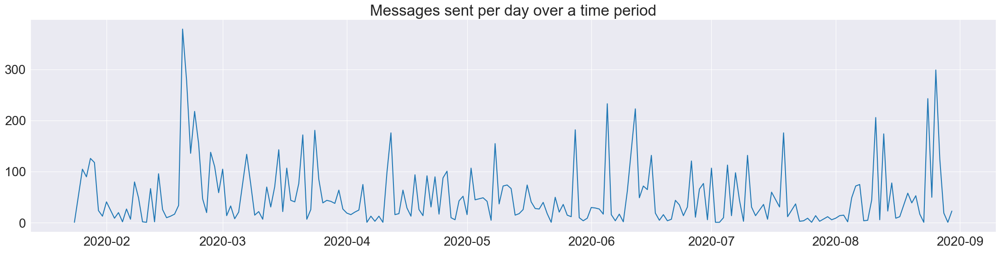

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set default style using Seaborn
sns.set_style("darkgrid")

# Adjust font size and figure size
plt.rcParams['font.size'] = 20
plt.rcParams['figure.figsize'] = (27, 6)

# Plotting messages sent per day over a time period
plt.plot(df1['date'], df1['message_count'])
plt.title('Messages sent per day over a time period')

# Saving the plot
plt.savefig('msg_plots.svg', format='svg')
plt.show()


## 2. CALCULATE TOP 10 MOST ACTIVE DAYS

In [11]:
top10days = df1.sort_values(by="message_count", ascending=False).head(10)
top10days.reset_index(drop=True, inplace=True)
print(top10days)


         date  message_count
0  2020-02-20            379
1  2020-08-26            299
2  2020-02-21            278
3  2020-08-24            243
4  2020-06-05            233
5  2020-06-12            223
6  2020-02-23            218
7  2020-08-11            206
8  2020-05-28            182
9  2020-03-24            181


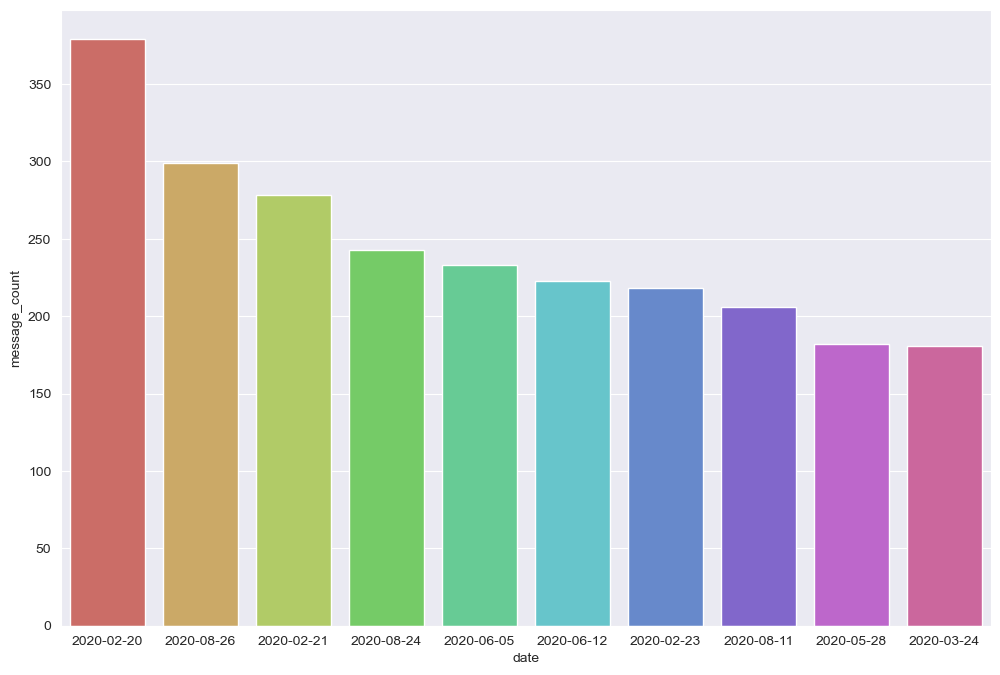

In [12]:
 import seaborn as sns
import matplotlib.pyplot as plt

# Set default style using Seaborn
sns.set_style("darkgrid")

# Adjust font size and figure size
plt.rcParams['font.size'] = 10
plt.rcParams['figure.figsize'] = (12, 8)

# Create a bar plot for top 10 days
sns.barplot(x='date', y='message_count', data=top10days, palette="hls")

# Save the plot
plt.savefig('top10_days.svg', format='svg')
plt.show()


In [13]:
total_users = len(df['user'].unique())
total_ghosts = 237 - total_users + 1  # Assuming 237 is the total number of group members including one admin

print(f"Total number of people who have sent at least one message in the group: {total_users - 1}")
print(f"Number of people who haven't sent even a single message in the group: {total_ghosts}")


Total number of people who have sent at least one message in the group: 136
Number of people who haven't sent even a single message in the group: 101


## 3. TOP 10 ACTIVE USERS

In [14]:
# Make a copy of the DataFrame
df2 = df.copy()

# Remove messages from "group_notification"
df2 = df2[df2['user'] != "group_notification"]

# Group by user and count the number of messages, then sort in descending order
top10df = df2.groupby("user")["message"].count().sort_values(ascending=False)

# Select the top 10 active users and reset the index
top10df = top10df.head(10).reset_index()

# Display the DataFrame of top 10 active users
print(top10df)


            user  message
0    Samay Raina     1916
1   Janvi Rathod     1634
2  Anjali Kapoor     1072
3  Sanyog Sharma      768
4    Rupali Jain      660
5    Mudit Verma      649
6  shivika malik      565
7     Manvi Jain      297
8  Mithun Kapoor      248
9  Vikram Nandal      199


In [15]:
# Generate initials for the top 10 active users
top10df['initials'] = ''
for i in range(10):
    initials = top10df['user'][i].split()[0][0] + top10df['user'][i].split()[1][0]
    top10df.at[i, 'initials'] = initials

# Display the DataFrame with initials
print(top10df)

            user  message initials
0    Samay Raina     1916       SR
1   Janvi Rathod     1634       JR
2  Anjali Kapoor     1072       AK
3  Sanyog Sharma      768       SS
4    Rupali Jain      660       RJ
5    Mudit Verma      649       MV
6  shivika malik      565       sm
7     Manvi Jain      297       MJ
8  Mithun Kapoor      248       MK
9  Vikram Nandal      199       VN


In [16]:
import matplotlib.pyplot as plt

# Adjust font size, figure size, and figure face color for better readability
plt.rcParams['font.size'] = 14
plt.rcParams['figure.figsize'] = (9, 5)
plt.rcParams['figure.facecolor'] = '#00000000'

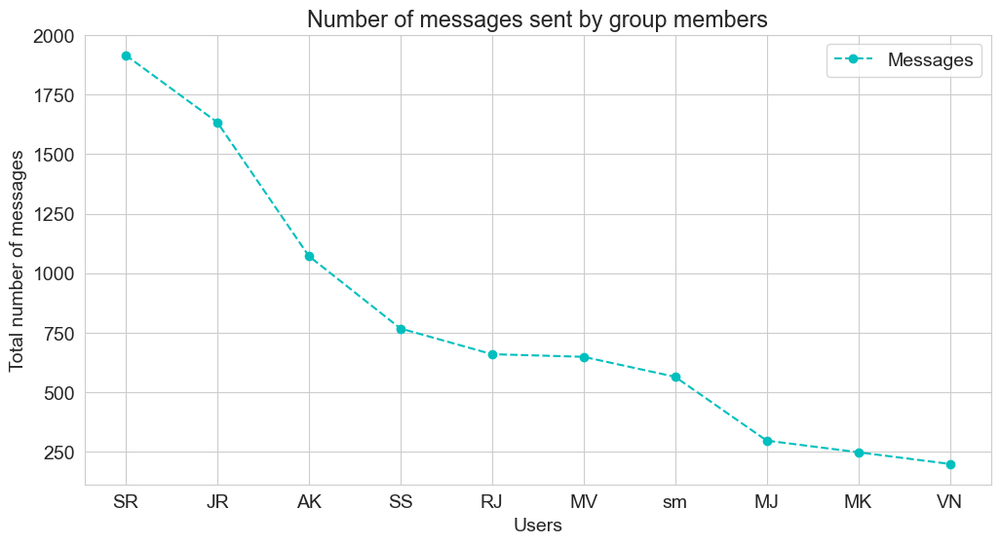

In [17]:
import seaborn as sns
import matplotlib.pyplot as plt

# Improving default styles using Seaborn
sns.set_style("whitegrid")

# Increasing the figure size
plt.figure(figsize=(12, 6))

# Plotting the line graph
plt.plot(top10df['initials'], top10df['message'], 'o--c')

# Labels and Title
plt.xlabel('Users')
plt.ylabel('Total number of messages')
plt.title("Number of messages sent by group members")
plt.legend(['Messages'])

# Saving the plot
plt.savefig('msg_plots.svg', format='svg')
plt.show()


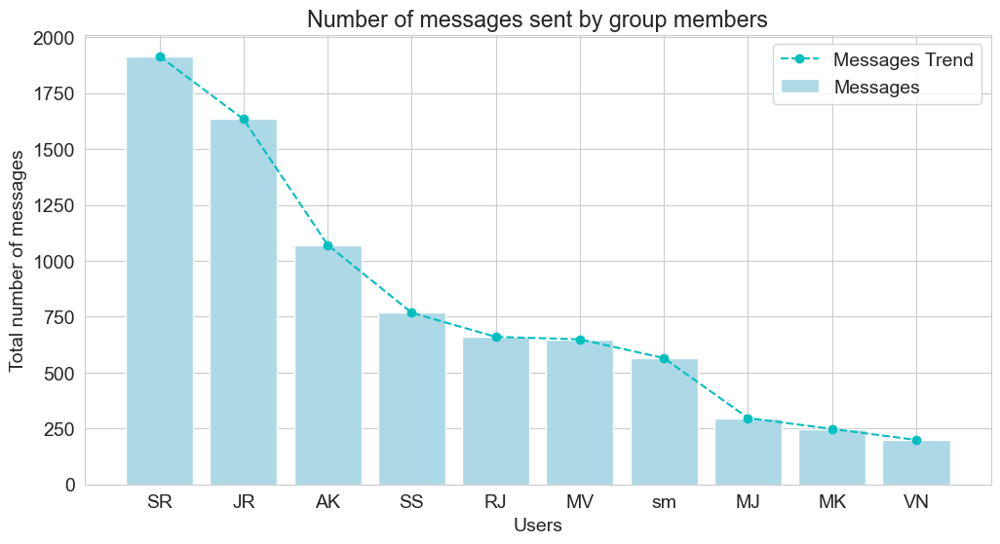

In [18]:
# Improving default styles using Seaborn
sns.set_style("whitegrid")

# Setting the figure size
plt.figure(figsize=(12, 6))

# Plotting the bar chart
plt.bar(top10df['initials'], top10df['message'], color='lightblue', label='Messages')

# Plotting the line graph
plt.plot(top10df['initials'], top10df['message'], 'o--c', label='Messages Trend')

# Labels and Title
plt.xlabel('Users')
plt.ylabel('Total number of messages')
plt.title("Number of messages sent by group members")
plt.legend()

# Saving the plot
plt.savefig('msg_bar_line_plots.svg', format='svg')
plt.show()


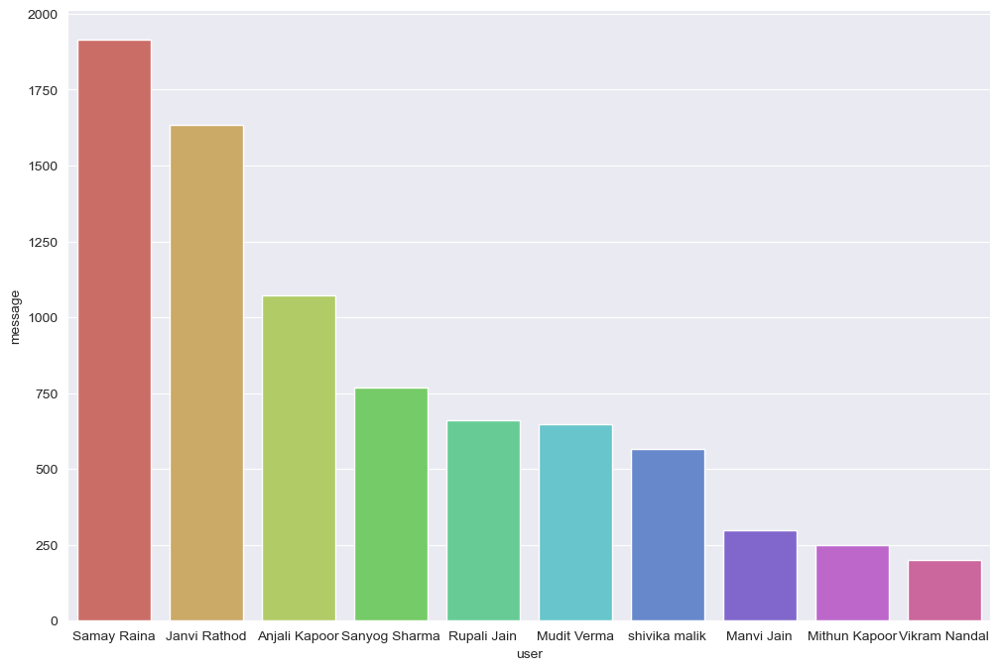

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt

# Beautifying default styles using Seaborn
sns.set_style("darkgrid")

# Adjust font size and figure size
plt.rcParams['font.size'] = 10
plt.rcParams['figure.figsize'] = (12, 8)

# Create a bar plot for top 10 active users
sns.barplot(x='user', y='message', data=top10df, palette="hls")

# Save the plot
plt.savefig('top10_days.svg', format='svg')
plt.show()


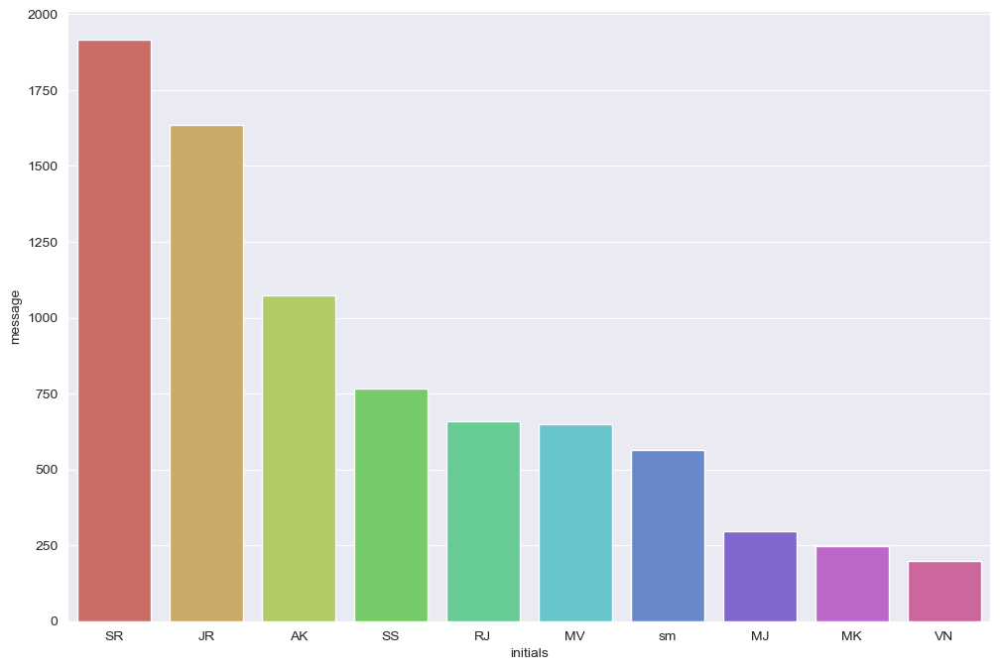

In [20]:
import seaborn as sns
import matplotlib.pyplot as plt

# Beautifying default styles using Seaborn
sns.set_style("darkgrid")

# Adjust font size and figure size
plt.rcParams['font.size'] = 10
plt.rcParams['figure.figsize'] = (12, 8)

# Create a bar plot for top 10 active users
sns.barplot(x='initials', y='message', data=top10df, palette="hls")

# Save the plot
plt.savefig('top10_days.svg', format='svg')
plt.show()


## 4. AVERAGE MESSAGE LENGTH OF TOP 10 MOST ACTIVE USERS OF THE GROUP

In [21]:
# Calculate the message length for each message
df2['message_length'] = df2['message'].apply(len)

# Calculate the average message length for each user
avg_msg_lengths = df2.groupby('user')['message_length'].mean().reset_index()
avg_msg_lengths.rename(columns={'message_length': 'avg_message_length'}, inplace=True)

# Merge the average message lengths with the top 10 active users
top10df = top10df.merge(avg_msg_lengths, on='user')

# Sort the DataFrame by average message length in descending order
top10df_msg = top10df.sort_values(by='avg_message_length', ascending=False)

# Display the DataFrame with average message lengths
print(top10df_msg)


            user  message initials  avg_message_length
9  Vikram Nandal      199       VN           60.889447
7     Manvi Jain      297       MJ           55.838384
4    Rupali Jain      660       RJ           49.904545
3  Sanyog Sharma      768       SS           35.128906
5    Mudit Verma      649       MV           32.896764
1   Janvi Rathod     1634       JR           32.451040
6  shivika malik      565       sm           31.224779
8  Mithun Kapoor      248       MK           29.177419
2  Anjali Kapoor     1072       AK           29.058769
0    Samay Raina     1916       SR           27.758351


In [22]:
import seaborn as sns

def get_colors_of_certain_order(order_list):
    """
    Generates a list of colors based on the order of unique items in order_list.
    
    Args:
    - order_list (list): A list of unique items
    
    Returns:
    - colors (list): A list of colors corresponding to the order of items in order_list
    """
    color_palette = sns.color_palette()
    num_colors = len(order_list)
    return [color_palette[i % len(color_palette)] for i in range(num_colors)]

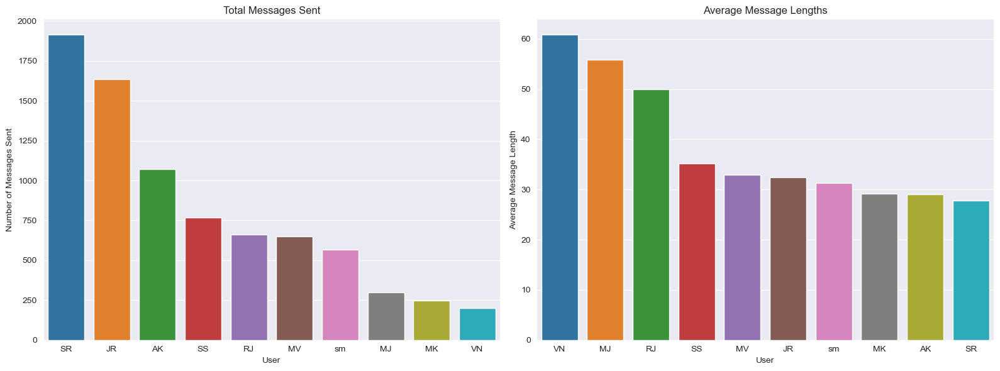

In [23]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the default style using Seaborn
sns.set_style("darkgrid")

# Plotting multiple charts in a grid
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1 - Countplot of total messages sent
sns.barplot(x=top10df['initials'], y=top10df['message'], ax=axes[0], palette=get_colors_of_certain_order(top10df['initials']))

axes[0].set_title('Total Messages Sent')
axes[0].set_xlabel('User')
axes[0].set_ylabel('Number of Messages Sent')

# Plot 2 - Barplot of the top 10 users' average message lengths
sns.barplot(x=top10df_msg['initials'], y=top10df_msg['avg_message_length'], ax=axes[1], palette=get_colors_of_certain_order(top10df_msg['initials']))

axes[1].set_title('Average Message Lengths')
axes[1].set_xlabel('User')
axes[1].set_ylabel('Average Message Length')

# Adjust the layout to prevent overlap
plt.tight_layout()

# Saving the plots
plt.savefig('top10_msg_plots_diff.svg', format='svg')
plt.show()


#####  
It’s really interesting to see plots like this side by side, because here comes the twist:
Ironically SR, the person who sent the most amount of texts , has least messages' length on average. This means this person sends broken and many WhatsApp messages in one go.


## 5. TOP 10 USER MOST SENT MEDIA

In [24]:
# Using `groupby`, `count` and `sort_values` attributes.
top10media = df[df.message == '<Media omitted> '].groupby('user').count().sort_values(by="message", ascending = False).head(10)

# Dropping unused column;
top10media.drop(columns=['date_time', 'day', 'month', 'year', 'date'], inplace=True)

# Renaming column name for visualization;
top10media.rename(columns={"message": "media_sent"}, inplace=True)

# resetting index;
top10media.reset_index(inplace=True)

top10media['initials'] = ''
for i in range(10):
    top10media.initials[i] = top10media.user[i].split()[0][0] + top10media.user[i].split()[1][0]
top10media.initials[9] = "VR"#It’s really interesting to see plots like this side by side, because here comes the twist:
#Ironically, TK, the person who sent the most amount of texts (2000+), has least messages' length on average. This means this person sends broken and many WhatsApp messages in one go.
#We can see that, I send less number of messages while having a relatively longer message length, followed by KS.
##Pre-processing
##We can use this to filter out and see who sends the most media.

# Using `groupby`, `count` and `sort_values` attributes.
top10media = df[df.message == '<Media omitted> '].groupby('user').count().sort_values(by="message", ascending = False).head(10)

# Dropping unused column;
top10media.drop(columns=['date_time', 'day', 'month', 'year', 'date'], inplace=True)

# Renaming column name for visualization;
top10media.rename(columns={"message": "media_sent"}, inplace=True)

# resetting index;
top10media.reset_index(inplace=True)

top10media['initials'] = ''
for i in range(10):
    top10media.initials[i] = top10media.user[i].split()[0][0] + top10media.user[i].split()[1][0]
 

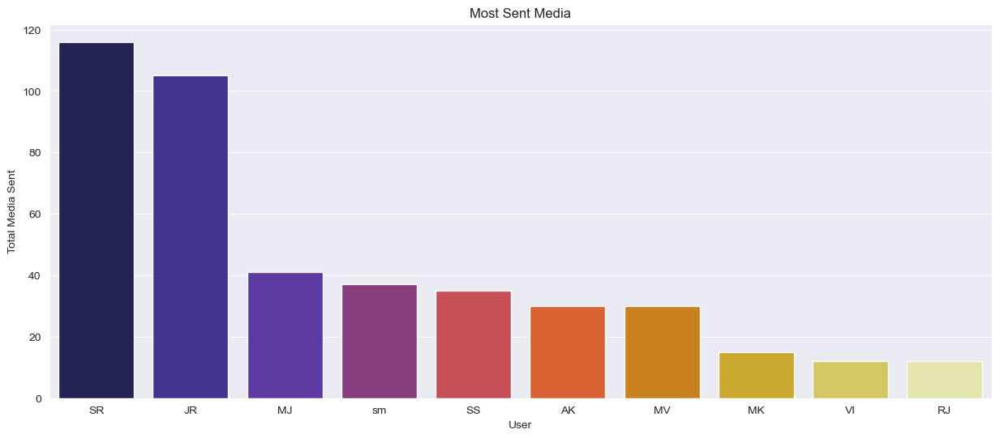

In [25]:
# Increasing the figure size
plt.figure(figsize=(15, 6))

# Beautifying Default Styles using Seaborn
sns.set_style("darkgrid")

# Plotting a bar graph
sns.barplot(x=top10media['initials'], y=top10media['media_sent'], palette="CMRmap")

plt.title('Most Sent Media')
plt.xlabel('User')
plt.ylabel('Total Media Sent')

# Saving the plots
plt.savefig('top10media.svg', format='svg')


In [26]:
print(top10media)

                        user  media_sent initials
0                Samay Raina         116       SR
1               Janvi Rathod         105       JR
2                 Manvi Jain          41       MJ
3              shivika malik          37       sm
4              Sanyog Sharma          35       SS
5              Anjali Kapoor          30       AK
6                Mudit Verma          30       MV
7              Mithun Kapoor          15       MK
8  Vivek Iyer (TSEC, Biomed)          12       VI
9                Rupali Jain          12       RJ


## 6. TOP 10 MOST USED EMOJI

In [27]:
 # Initialize a Counter to count emoji occurrences
emoji_ctr = Counter()

# Create a list of emojis
emojis_list = list(emoji.UNICODE_EMOJI.keys()) 

# Compile a regular expression pattern to match emojis
pattern = re.compile('|'.join(re.escape(p) for p in emojis_list))

# Iterate over each row in the DataFrame
for idx, row in df.iterrows():
    # Find emojis in the message using the compiled regular expression pattern
    emojis_found = pattern.findall(row["message"])
    # Increment the count of each emoji found
    for emoji_found in emojis_found:
        emoji_ctr[emoji_found] += 1 

AttributeError: module 'emoji' has no attribute 'UNICODE_EMOJI'

In [28]:
pip install emoji_data_python

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [29]:
from collections import Counter
import emoji_data_python
import re

# Initialize a Counter to count emoji occurrences
emoji_ctr = Counter()

# Create a list of emoji characters by extracting from EmojiChar objects
emojis_list = [emoji.char for emoji in emoji_data_python.emoji_data]

# Compile a regular expression pattern to match emojis
pattern = re.compile('|'.join(re.escape(p) for p in emojis_list))

# Iterate over each row in the DataFrame
for idx, row in df.iterrows():
    # Find emojis in the message using the compiled regular expression pattern
    emojis_found = pattern.findall(row["message"])
    # Increment the count of each emoji found
    for emoji_found in emojis_found:
        emoji_ctr[emoji_found] += 1


In [30]:
import pandas as pd
import emoji

# Create a DataFrame to store information about the top 10 emojis
top10emojis = pd.DataFrame(index=range(10), columns=["emoji", "emoji_count", "emoji_description"])

# Iterate over the top 10 emojis and populate the DataFrame
for i, (emoji_char, count) in enumerate(emoji_ctr.most_common(10)):
    # Demojize the emoji to get a plain text representation
    description = emoji.demojize(emoji_char)[1:-1]  # Remove the colons ':' at the beginning and end
    
    # Populate the DataFrame with emoji information
    top10emojis.at[i, 'emoji'] = emoji_char
    top10emojis.at[i, 'emoji_count'] = count
    top10emojis.at[i, 'emoji_description'] = description

# Display the DataFrame
top10emojis


,emoji,emoji_count,emoji_description
0,😂,1422,face_with_tears_of_joy
1,👍,313,thumbs_up
2,🏻,239,light_skin_tone
3,🔥,201,fire
4,😅,170,grinning_face_with_sweat
5,💯,145,hundred_points
6,🤣,110,rolling_on_the_floor_laughing
7,👏,68,clapping_hands
8,🤦‍♂️,67,man_facepalming
9,🙌,66,raising_hands


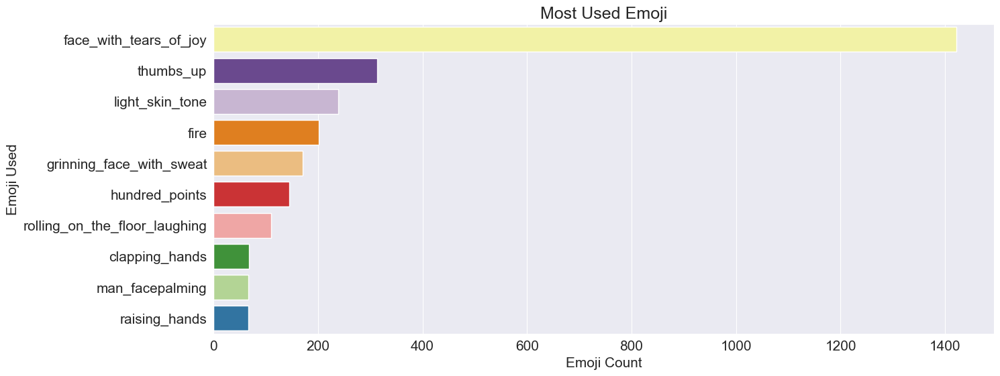

In [31]:
 import matplotlib.pyplot as plt
import seaborn as sns

# Set figure size and font size
plt.figure(figsize=(15, 6))
import matplotlib
matplotlib.rcParams['font.size'] = 15

# Set seaborn style
sns.set_style("darkgrid")

# Plotting
sns.barplot(x='emoji_count', y='emoji_description', data=top10emojis, palette="Paired_r")

# Title and labels
plt.title('Most Used Emoji')
plt.xlabel('Emoji Count')
plt.ylabel('Emoji Used')

# Save plot
plt.savefig('top10emoji.svg', format='svg')
plt.show()


In [32]:
import plotly.express as px
fig = px.treemap(top10emojis, path= ['emoji'],
    values = top10emojis['emoji_count'].tolist(),
)
fig.show()

## 7. MOST ACTIVE DAY, MOST ACTIVE HOURS AND MOST ACTIVE MONTHS

In [33]:
# Create a copy of the DataFrame
df3 = df.copy()

# Set all values in 'message_count' column to 1
df3['message_count'] = 1  

# Extract hour from datetime
df3['hour'] = df3['date_time'].dt.hour

# Group by hour and sum message counts
grouped_by_time = df3.groupby('hour')['message_count'].sum().reset_index()


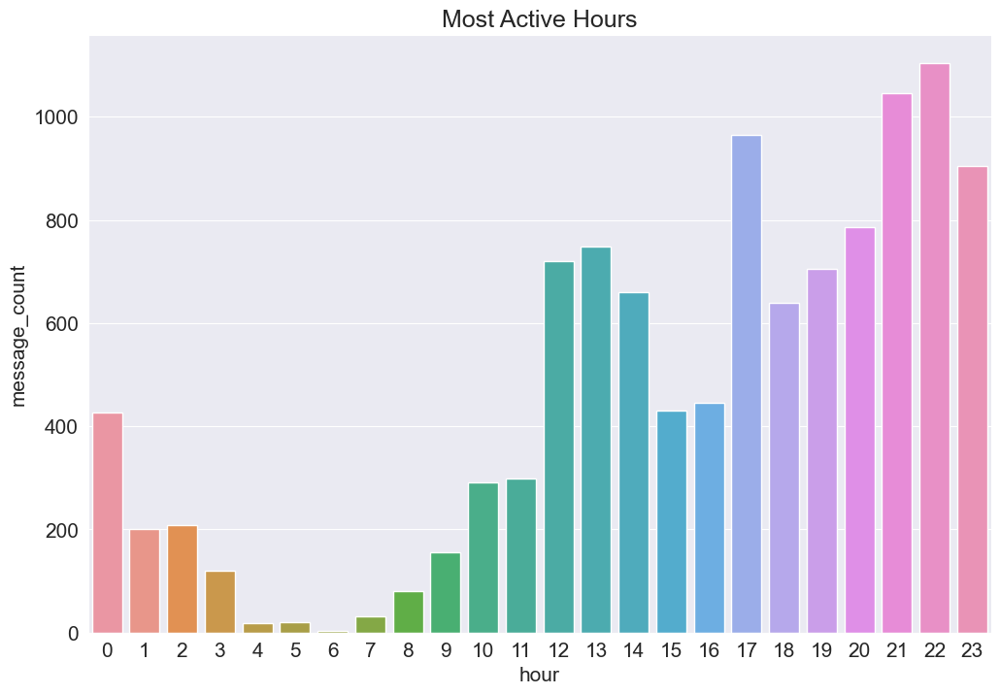

In [34]:
 import seaborn as sns
import matplotlib.pyplot as plt

# Create a bar plot
sns.barplot(x='hour', y='message_count', data=grouped_by_time)

# Add title
plt.title('Most Active Hours')

# Save the plot
plt.savefig('most_active_hours.svg', format='svg')
plt.show()


In [35]:
import pandas as pd

# Extracting weekday and month from the datetime column
df3['day'] = df3['date_time'].dt.day_name()
df3['month_name'] = df3['date_time'].dt.month_name()

# Specific order to be printed in for weekdays
days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
# Grouping by day
grouped_by_day = df3.groupby('day')['message_count'].sum().reindex(days).reset_index()

# Specific order to be printed in for months
months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
# Grouping by month
grouped_by_month = df3.groupby('month_name')['message_count'].sum().reindex(months).reset_index()


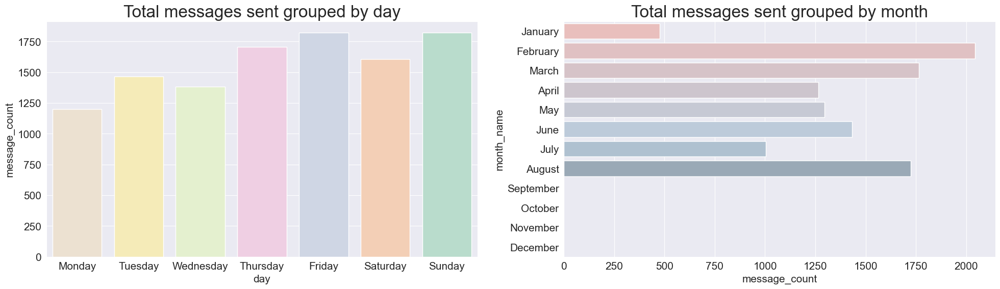

In [36]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(24, 6))

# Set font size for better readability
import matplotlib
matplotlib.rcParams['font.size'] = 20

# Set seaborn style
sns.set_style("darkgrid")

# Plotting

# PLOT 1: Messages grouped by day
sns.barplot(x='day', y='message_count', data=grouped_by_day, order=days, ax=axs[0], palette='Pastel2_r')
axs[0].set_title('Total messages sent grouped by day')

# PLOT 2: Messages grouped by month
sns.barplot(x='message_count', y='month_name', data=grouped_by_month, order=months, ax=axs[1], palette='Pastel1_d')
axs[1].set_title('Total messages sent grouped by month')

# Save the plots
plt.savefig('days_and_month.svg', format='svg')
plt.show()


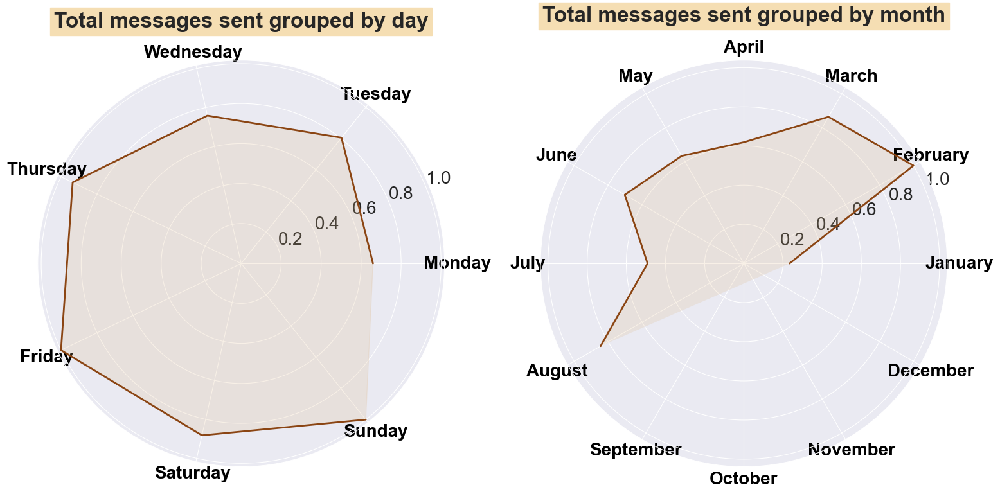

In [37]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Assuming df3 is your DataFrame with necessary columns

# Extracting weekday and month from the datetime column
df3['day'] = df3['date_time'].dt.day_name()
df3['month_name'] = df3['date_time'].dt.month_name()

# Specific order to be printed in for weekdays
days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
# Grouping by day
grouped_by_day = df3.groupby('day')['message_count'].sum().reindex(days).reset_index()

# Specific order to be printed in for months
months =['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
# Grouping by month
grouped_by_month = df3.groupby('month_name')['message_count'].sum().reindex(months).reset_index()

# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(16, 8), subplot_kw={'projection': 'polar'})

# PLOT 1: Messages grouped by day (Spider Plot)
angles_day = np.linspace(0, 2 * np.pi, len(days), endpoint=False).tolist()
values_day = grouped_by_day['message_count'].tolist()
max_value_day = max(values_day)
values_day_normalized = [v / max_value_day for v in values_day]  # Normalize values
axs[0].plot(angles_day, values_day_normalized, linestyle='-', color='saddlebrown', linewidth=2)
axs[0].fill(angles_day, values_day_normalized, alpha=0.2, color='burlywood')  # Brown and antiquewhite colors

axs[0].set_xticks(angles_day)
axs[0].set_xticklabels(days, fontweight='bold', color='black')  # Bold and black days
axs[0].tick_params(axis='x', colors='black')  # Set the color of the radial ticks
axs[0].set_title('Total messages sent grouped by day', fontweight='bold', backgroundcolor='wheat', pad=20)  # Added pad for more space after title

# PLOT 2: Messages grouped by month (Spider Plot)
angles_month = np.linspace(0, 2 * np.pi, len(months), endpoint=False).tolist()
values_month = grouped_by_month['message_count'].tolist()
max_value_month = max(values_month)
values_month_normalized = [v / max_value_month for v in values_month]  # Normalize values
axs[1].plot(angles_month, values_month_normalized, linestyle='-', color='saddlebrown', linewidth=2)
axs[1].fill(angles_month, values_month_normalized, alpha=0.2, color='burlywood')  # Brown and antiquewhite colors

axs[1].set_xticks(angles_month)
axs[1].set_xticklabels(months, fontweight='bold', color='black')  # Bold and black months
axs[1].tick_params(axis='x', colors='black')  # Set the color of the radial ticks
axs[1].set_title('Total messages sent grouped by month', fontweight='bold', backgroundcolor='wheat', pad=20)  # Added pad for more space after title

# Adjust layout
plt.tight_layout()

# Show plot
plt.show()


## 8.WORDCLOUD

In [38]:
from wordcloud import WordCloud, STOPWORDS

# Initialize an empty string to store words
comment_words = ''

# Define stopwords to be avoided in the WordCloud
stopwords = set(STOPWORDS)
stopwords.update(['group', 'link', 'invite', 'joined', 'message', 'deleted', 'yeah', 'hai', 'yes', 'okay', 'ok', 'will', 'use', 'using', 'one', 'know', 'guy', 'group', 'media', 'omitted'])

# Iterate through the DataFrame
for val in df3.message.values:
    # Convert val to string
    val = str(val)
    # Split the value into tokens
    tokens = val.split()
    # Convert tokens to lowercase
    tokens = [token.lower() for token in tokens]
    # Append tokens to comment_words
    comment_words += " ".join(tokens) + " "

# Generate WordCloud
wordcloud = WordCloud(width=600, height=600, background_color='white', stopwords=stopwords, min_font_size=8).generate(comment_words)


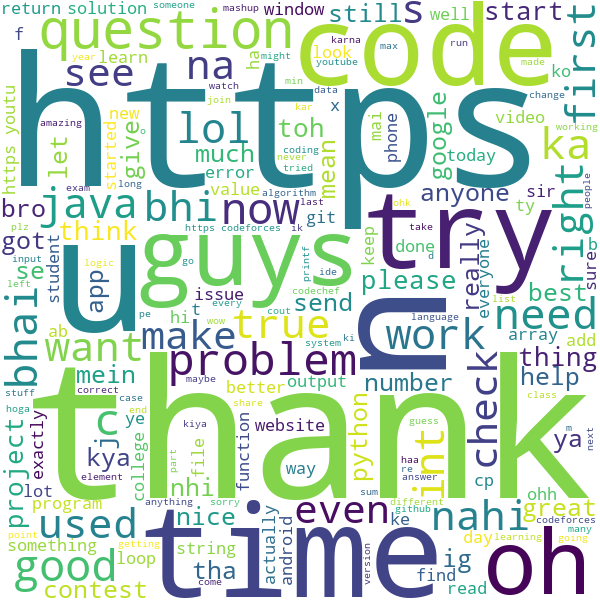

In [39]:
wordcloud.to_image()

## WORDCLOUD OF TOP 10 ACTIVE USERS

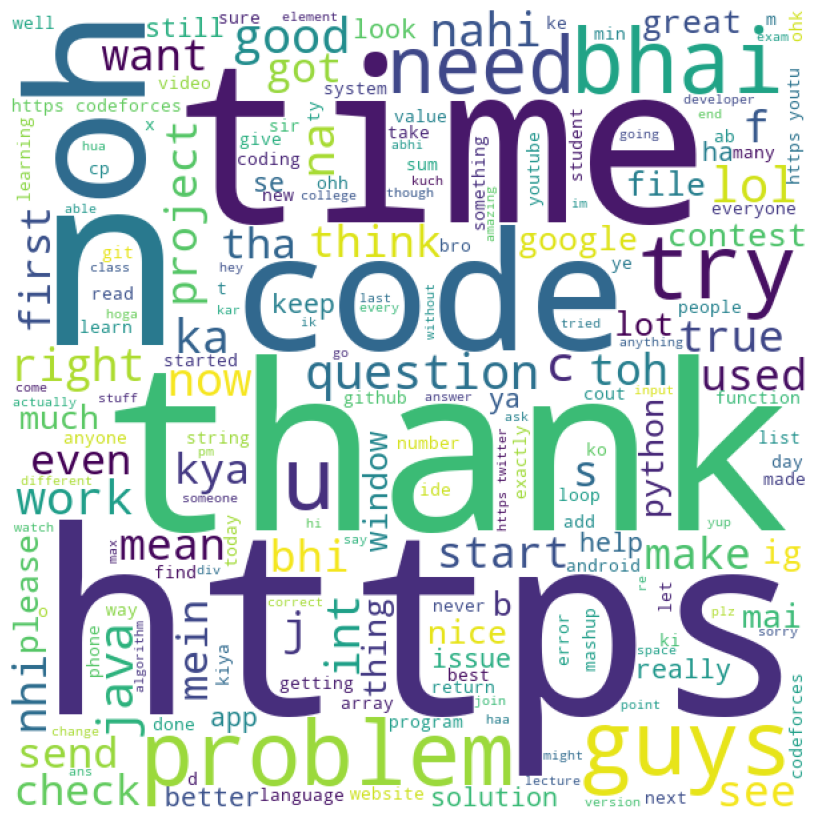

In [40]:
from collections import Counter
from wordcloud import WordCloud, STOPWORDS

# Define stopwords to be avoided in the WordCloud
stopwords = set(STOPWORDS)
stopwords.update(['group', 'link', 'invite', 'joined', 'message', 'deleted', 'yeah', 'hai', 'yes', 'okay', 'ok', 'will', 'use', 'using', 'one', 'know', 'guy', 'group', 'media', 'omitted'])

# Initialize an empty string to store words for top users
top_users_comment_words = ''

# Iterate through the DataFrame for top users
for user in top10df['user']:
    # Get all messages for the current user
    messages_for_user = df3[df3['user'] == user]['message']
    # Iterate through the messages
    for val in messages_for_user.values:
        # Convert val to string
        val = str(val)
        # Split the value into tokens
        tokens = val.split()
        # Convert tokens to lowercase
        tokens = [token.lower() for token in tokens]
        # Append tokens to top_users_comment_words
        top_users_comment_words += " ".join(tokens) + " "

# Generate WordCloud for top users
wordcloud_top_users = WordCloud(width=600, height=600, background_color='white', stopwords=stopwords, min_font_size=8).generate(top_users_comment_words)

# Display the WordCloud
import matplotlib.pyplot as plt
plt.figure(figsize=(8, 8), facecolor=None)
plt.imshow(wordcloud_top_users)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

## 9.HEATMAP COMBINING MSG SENT BY MONTH AND DAY

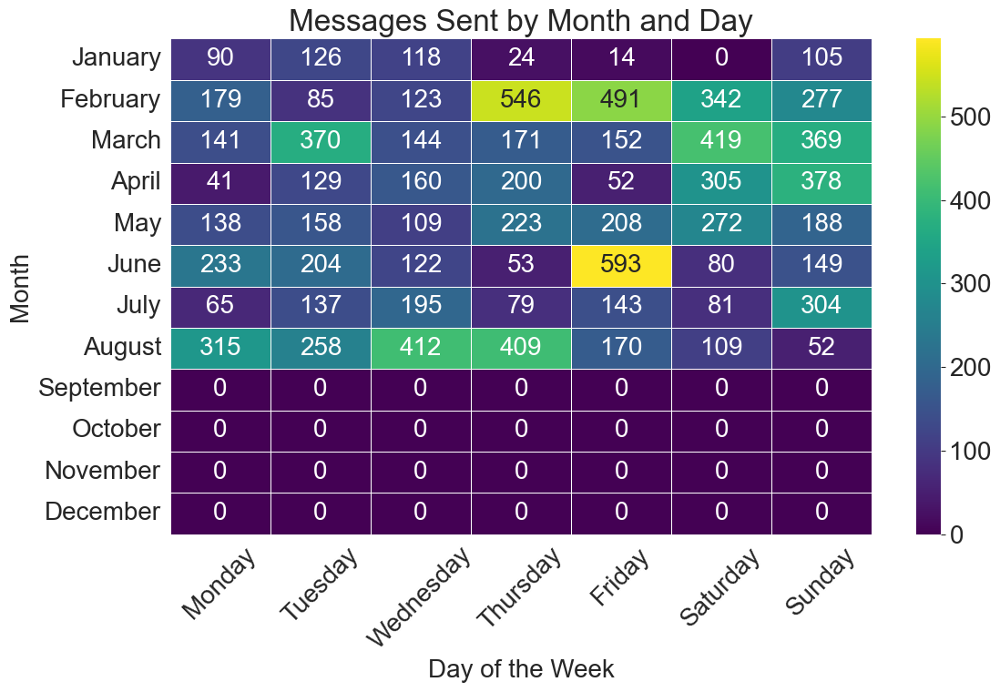

In [41]:
import seaborn as sns
import matplotlib.pyplot as plt

# Pre-processing by day and month
grouped_by_day_and_month = df3.groupby(['day', 'month_name']).size().reset_index(name='message_count')

# Pivot the DataFrame to have days as columns, months as index, and message counts as values
pivot_table = grouped_by_day_and_month.pivot(index='month_name', columns='day', values='message_count')

# Reorder the rows to have months in chronological order
pivot_table = pivot_table.reindex(index=months)

# Specify the order of the days (Monday to Sunday)
days_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
pivot_table = pivot_table[days_order]

# Fill missing values with zeros
pivot_table = pivot_table.fillna(0)

# Plotting the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, cmap='viridis', annot=True, fmt='g', linewidths=.5)
plt.title('Messages Sent by Month and Day')
plt.xlabel('Day of the Week')
plt.ylabel('Month')
plt.xticks(rotation=45)
plt.tight_layout()

# Saving the plot
plt.savefig('month_day_heatmap.svg', format='svg')
plt.show()


## 10. THREE METHODS FOR IDENTIFYING SPAM MESSAGES IN GROUP CHAT

In [42]:
#This code identifies and displays messages that have more than 3 words and have been sent 10 or more times in the chat group
#along with the user who sent each message and the count of occurrences-/

In [43]:
import pandas as pd

# Assuming df is your DataFrame containing the chat data
# Assuming 'message' column contains the messages and 'user' column contains the user information

# Filter messages with more than 3 words
df['word_count'] = df['message'].apply(lambda x: len(x.split()))
filtered_df = df[df['word_count'] > 3]

# Count the occurrences of each message
message_counts = filtered_df['message'].value_counts()

# Filter messages sent 10 or more times
duplicates = message_counts[message_counts >= 10]

# Get the messages sent 10 or more times
duplicates_messages = duplicates.index.tolist()

# Filter the DataFrame to get rows with duplicate messages
duplicate_rows = filtered_df[filtered_df['message'].isin(duplicates_messages)]

# Group by message and user, then count the occurrences
duplicate_counts = duplicate_rows.groupby(['message', 'user']).size().reset_index(name='count')

# Filter to keep only messages sent 10 or more times
duplicate_counts = duplicate_counts[duplicate_counts['count'] >= 10]

# Display the DataFrame
print(duplicate_counts)


                      message             user  count
25  This message was deleted   +91 95949 08570     10
38  This message was deleted     Anjali Kapoor     22
42  This message was deleted      Janvi Rathod     24
43  This message was deleted     Mithun Kapoor     13
48  This message was deleted       Samay Raina     49
50  This message was deleted     Vikram Nandal     13
53  This message was deleted     shivika malik     38
54  You deleted this message        Manvi Jain     14


In [44]:
#SHOW THE MESSAGES THAT HAVE WORD COUNT OF MORE THAN 70 WORDS AND MAY BE THE SPAM MESSAGES!!
import pandas as pd

# Assuming df is your DataFrame containing the chat data
# Assuming 'message' column contains the messages and 'user' column contains the user information

# Filter messages with more than 5 words
df['word_count'] = df['message'].apply(lambda x: len(x.split()))
filtered_df = df[df['word_count'] > 70]

# Select only the 'user' and 'message' columns
filtered_messages = filtered_df[['user', 'message']]

# Display the DataFrame
print(filtered_messages)

                  user                                            message
177      Anjali Kapoor  #include <conio.h> #include <stdio.h>  void ma...
362      Anjali Kapoor  #include <conio.h> #include <stdio.h>  int mai...
467    +91 89764 07509  #include <stdio.h> #include <string.h>  void m...
471    +91 89764 07509  #include <stdio.h> #include <string.h>  void m...
887    +91 79770 56210  #include <stdio.h> void main() {     int total...
944         Manvi Jain  Find a pair (n,r) in an integer array such tha...
976    +91 70394 60876  Sussutu is a world-renowned magician. And rece...
1363        Manvi Jain  Sussutu is a world-renowned magician. And rece...
2496       Rupali Jain  ```import java.util.Scanner; import java.util....
2570      Janvi Rathod  *Some of really important website for a Develo...
2871     Sanyog Sharma  #include <map> #include<iostream> using namesp...
3274   +91 93598 18687  *Saul Bellow* exclaimed - People can lose thei...
3327   +91 73043 57388  Competitive pr

In [45]:
#SHOW THE MESSAGES THAT HAVE WORD COUNT OF MORE THAN 15 WORDS AND SENT MORE THAN ONE TIME AND MAY BE THE SPAM MESSAGES!!
import pandas as pd

# Assuming df is your DataFrame containing the chat data
# Assuming 'message' column contains the messages and 'user' column contains the user information

# Calculate the word count for each message
df['word_count'] = df['message'].apply(lambda x: len(x.split()))

# Filter messages with more than 100 words
filtered_df = df[df['word_count'] > 15]

# Group by message and user, then count the occurrences
message_counts = filtered_df.groupby(['message', 'user']).size().reset_index(name='count')

# Filter to keep only messages sent more than once
message_counts = message_counts[message_counts['count'] > 1]

# Select only the 'user', 'message', and 'count' columns
filtered_messages = message_counts[['user', 'message', 'count']]

# Display the DataFrame
print(filtered_messages)

               user                                            message  count
30  +91 72762 35231  *2 Months of Netflix Premium Free at no cost F...      3


# 11. Extract potential keywords related to criminal activities

In [46]:
def extract_potential_criminal_keywords(text):
    # Define a list of keywords related to criminal activities
    keywords = ['murder', 'homicide', 'assault', 'robbery', 'theft', 'burglary', 'larceny', 'arson', 'kidnapping', 'abduction', 'ransom', 'extortion', 'blackmail', 'carjacking', 'home invasion', 'sexual assault', 'rape', 'sexual abuse', 'pedophilia', 'child abuse', 'child neglect', 'domestic violence', 'stalking', 'harassment', 'cyberbullying', 'bullying', 'terrorism', 'terrorist attack', 'bombing', 'shooting', 'mass shooting', 'hijacking', 'hijack', 'hate crime', 'hate speech', 'ethnic cleansing', 'genocide', 'war crime', 'torture', 'human rights violation', 'death penalty', 'execution', 'suicide', 'suicide bombing', 'illegal arms dealing', 'weapons trafficking', 'gun trafficking', 'illegal firearm possession', 'organized robbery', 'money counterfeiting', 'document forgery', 'identity fraud', 'embezzlement scheme', 'ponzi investment', 'corporate bribery', 'political scandal', 'election fraud', 'voter fraud', 'false testimony', 'perjury', 'public corruption', 'judicial bribery', 'court tampering', 'legal malpractice', 'academic dishonesty', 'academic fraud', 'plagiarism', 'cyber espionage', 'cyber terrorism', 'cyber attack', 'malware', 'hacking', 'phishing', 'identity theft', 'cyber theft', 'money laundering', 'laundering operation', 'illegal money transfer', 'tax evasion', 'tax avoidance', 'offshore account', 'illegal wildlife trade', 'poaching', 'endangered species trafficking', 'environmental crime', 'pollution crime', 'ecological disaster', 'oil spill', 'hazardous waste dumping', 'illegal logging', 'wildlife smuggling', 'ivory trafficking', 'illegal fishing', 'overfishing', 'piracy', 'copyright infringement', 'software piracy', 'film piracy', 'music piracy', 'bootlegging', 'alcohol smuggling', 'drug cultivation', 'illegal mining', 'blood diamond', 'conflict diamond', 'antiquities smuggling', 'art theft', 'artifact smuggling', 'cultural heritage crime', 'cultural property theft', 'human experimentation', 'unethical research', 'medical malpractice', 'patient abuse', 'insurance scam', 'healthcare fraud', 'pharmaceutical fraud', 'product tampering', 'food adulteration', 'food contamination', 'product recall', 'workplace harassment', 'workplace discrimination', 'labor exploitation', 'slavery', 'forced labor', 'child labor', 'child soldiering', 'child marriage', 'forced marriage', 'arranged marriage', 'arranged child marriage', 'early marriage', 'forced prostitution', 'child prostitution', 'sex tourism', 'sex slavery', 'forced abortion', 'gender-based violence', 'honor killing', 'female genital mutilation', 'forced sterilization', 'forced organ harvesting', 'organ trafficking', 'illegal adoption', 'baby trafficking', 'baby farming', 'child soldier recruitment', 'child soldier use', 'child soldier rehabilitation', 'child soldier reintegration', 'child soldier demobilization', 'drug', 'drugs', 'narcotic', 'narcotics', 'trafficking', 'trafficker', 'traffickers', 'trafficking ring', 'drug cartel', 'drug lord', 'drug trade', 'drug smuggling', 'drug dealing', 'drug abuse', 'drug addiction', 'substance abuse', 'illegal drug', 'illicit drug', 'cocaine', 'heroin', 'marijuana', 'cannabis', 'methamphetamine', 'ecstasy', 'LSD', 'crack cocaine', 'opium', 'fentanyl', 'prescription drug abuse', 'prescription drug fraud', 'prescription drug trafficking', 'opioid trafficking', 'opioid epidemic', 'synthetic drug', 'designer drug', 'party drug', 'performance-enhancing drug', 'doping', 'steroid', 'anabolic steroid', 'steroid trafficking', 'steroid abuse', 'steroid scandal', 'fraud', 'fraudulent', 'fraudster', 'fraudulence', 'scam', 'scams', 'scammer', 'scamming', 'scam artist', 'con artist', 'confidence trick', 'confidence scheme', 'pyramid scheme', 'Ponzi scheme', 'investment fraud', 'securities fraud', 'wire fraud', 'mail fraud', 'identity theft', 'credit card fraud', 'insurance fraud', 'tax fraud', 'welfare fraud', 'mortgage fraud', 'bank fraud', 'accounting fraud', 'corporate fraud', 'white-collar crime', 'embezzlement', 'forgery', 'counterfeiting', 'money laundering', 'launder money', 'laundering scheme', 'dirty money', 'black money', 'illegal money', 'underground economy', 'corruption', 'corrupt', 'corrupt practices', 'bribery', 'bribe', 'kickback', 'graft', 'embezzle', 'embezzler', 'corrupt official', 'political corruption', 'police corruption', 'judicial corruption', 'organized crime', 'racketeering', 'mafia', 'mob', 'mobster', 'syndicate', 'criminal organization', 'underworld', 'illegal trade', 'black market', 'illegal gambling', 'human trafficking', 'sex trafficking', 'child trafficking', 'organ trafficking', 'illegal arms trade', 'arms smuggling', 'terrorist financing', 'cybercrime', 'cybercriminal', 'cyber fraud', 'cyber scam', 'dark web', 'illicit trade', 'contraband', 'contraband smuggling', 'contraband trade', 'contraband trafficking', 'illicit goods', 'illegal immigration', 'undocumented immigration', 'human smuggling', 'border smuggling', 'smuggling route', 'smuggling operation', 'smuggling network', 'scam']
    # Compile a regular expression pattern to match the keywords
    pattern = re.compile('|'.join(keywords), flags=re.IGNORECASE)
    # Find all occurrences of keywords in the text
    matches = pattern.findall(text)
    # Return a list of unique matched keywords
    return list(set(matches))

# Apply the function to extract potential criminal keywords from each message
df['potential_criminal_keywords'] = df['message'].apply(extract_potential_criminal_keywords)

# Filter messages with potential criminal keywords
potential_criminal_messages = df[df['potential_criminal_keywords'].apply(len) > 0]

# Display the messages containing potential criminal keywords along with the usernames
print(potential_criminal_messages[['user', 'message', 'potential_criminal_keywords']])


                        user  \
436               Manvi Jain   
1317           Anjali Kapoor   
1320            Janvi Rathod   
1708         +91 82080 02653   
2823              Manvi Jain   
4007           Anjali Kapoor   
4077            Janvi Rathod   
4303             Rupali Jain   
4648        Saket (TSEC, CS)   
5094             Samay Raina   
6273            Janvi Rathod   
6429             Samay Raina   
6545             Samay Raina   
6815         +91 84335 18102   
6934   Keyul Jain (TSEC, CS)   
7063           Vikram Nandal   
7064         +91 99693 94098   
7121           Vikram Nandal   
7271           Anjali Kapoor   
7286              Manvi Jain   
7304             Mudit Verma   
8240         +91 73043 57388   
8843             Samay Raina   
8866         +91 98206 01141   
8905         +91 73043 57388   
9236           Sanyog Sharma   
9392           Anjali Kapoor   
9402         +91 88284 70904   
9987         +91 88284 70904   
9988           Anjali Kapoor   
10544   

# 12. Translation of Messages containing potential keywords related to criminal          activities

In [47]:
import pandas as pd
from googletrans import Translator
import re

def translate_messages(messages, source_lang, target_lang):
    translator = Translator()
    translated_messages = []
    for message in messages:
        try:
            translation = translator.translate(message, src=source_lang, dest=target_lang)
            translated_messages.append(translation.text)
        except Exception as e:
            print(f"Error translating message: {message}")
            print(f"Error details: {e}")
            translated_messages.append("Translation Error")
    return translated_messages
# Apply the function to extract potential criminal keywords from each message
df['potential_criminal_keywords'] = df['message'].apply(extract_potential_criminal_keywords)

# Filter messages with potential criminal keywords
potential_criminal_messages = df[df['potential_criminal_keywords'].apply(len) > 0]

# Select messages with criminal keywords
messages_with_criminal_keywords = potential_criminal_messages['message'].tolist()

# Translate messages with criminal keywords
translated_messages = translate_messages(messages_with_criminal_keywords, source_lang='en', target_lang='ja')

# Create a DataFrame to store the original and translated messages
translated_df = pd.DataFrame({'original_message': messages_with_criminal_keywords, 'translated_message': translated_messages})

# Display the DataFrame with translated messages
print(translated_df)

Error translating message: https://docs.google.com/forms/d/e/1FAIpQLSd4CfJxydDDZGSzlTPVeiWQDM6XInm3gZZaDk9oc9y--1dxeA/viewform 
Error details: list index out of range
Error translating message: https://threatpost.com/apis-next-frontier-cybercrime/158536/ 
Error details: list index out of range
                                     original_message  \
0   It was a normal text editor. And we used termi...   
1                      Anyone interested in hacking?    
2                   We've got a hacking community  B    
3   [Name]Shruti Jain; [Phone number] Mobile：70452...   
4   https://docs.google.com/forms/d/e/1FAIpQLSd4Cf...   
5                               Bhai ye sab scam hai    
6   https://fightwithcovid.github.io/web/  Mobile ...   
7                         (Not intended for mobile).    
8                            Execution time *4 secs*    
9               Are u guys doing the hacking thing😅?    
10                                   Not for mobile.    
11  // A tricky Java 

# 13.Extract links from messages and return the user who sent the message

In [48]:
def extract_links_and_user(text):
    # Regular expression pattern to match URLs
    url_pattern = r'https?://\S+|www\.\S+'
    # Find all occurrences of URLs in the text
    urls = re.findall(url_pattern, text)
    # Return a tuple containing the user and the list of URLs found
    return urls

# Assuming df is your DataFrame containing the chat data
# Assuming 'message' column contains the messages and 'user' column contains the user information

# Apply the function to extract links and users from each message
df['links_and_user'] = df.apply(lambda row: extract_links_and_user(row['message']), axis=1)

# Filter messages with links
messages_with_links = df[df['links_and_user'].apply(lambda x: len(x)) > 0]

# Display the messages containing links along with the usernames
for index, row in messages_with_links.iterrows():
    user = row['user']
    links = row['links_and_user']
    print(f"User: {user}\nLinks: {links}\n")


User: Chirag Sharma (TSEC, CS)
Links: ['https://youtu.be/AU7mADJMa9Y']

User: Pranay Thakur (TSEC, CS)
Links: ['https://youtu.be/aZu084TPInE']

User: Janvi Rathod
Links: ['http://meetu.ps/e/HKD5Q/BGt8n/d']

User: Janvi Rathod
Links: ['https://www.youtube.com/watch?v=fUqpYvIYj-Y']

User: Janvi Rathod
Links: ['https://www.youtube.com/playlist?list=PLDN4rrl48XKpZkf03iYFl-O29szjTrs_O']

User: Janvi Rathod
Links: ['https://youtu.be/4eWKHLSRHPY']

User: Samay Raina
Links: ['https://research.hackerrank.com/developer-skills/2020?utm_medium=social&utm_source=instagram&utm_campaign=021420&utm_content=IGPoll']

User: +91 82080 02653
Links: ['https://forms.gle/27DSsnJnBBMRy6Bt8']

User: +91 90822 59476
Links: ['https://code.dcoder.tech/files/code/5e3d7fad3975f256bf9d10e8/practice']

User: Samay Raina
Links: ['https://code.dcoder.tech/files/code/5e4a61595e611d351827daec/hell']

User: Anjali Kapoor
Links: ['https://code.dcoder.tech/files/code/5e4c15209e436e412f89d805/right-angled-triangle']

User: J

# 14.TO FIND TOP 10 MOST SHARED LINKS ALONG WITH SOME OTHER DETAILS

In [49]:
 import pandas as pd
import re
from collections import Counter

# Function to extract links from messages
def extract_links(text):
    # Regular expression pattern to match URLs
    url_pattern = r'https?://\S+|www\.\S+'
    # Find all occurrences of URLs in the text
    urls = re.findall(url_pattern, text)
    # Return the list of URLs found
    return urls

# Assuming df is your DataFrame containing the chat data
# Assuming 'message' column contains the messages and 'user' column contains the user information
# Assuming 'date_time' column contains the date and time information

# Apply the function to extract links from each message
df['links'] = df['message'].apply(extract_links)

# Flatten the list of links
all_links = [link for links in df['links'] for link in links]

# Count the frequency of each link
link_counts = Counter(all_links)

# Get the top 10 most shared links
top_10_links = link_counts.most_common(10)

# Create a dictionary to store users who shared each link along with the count of shares and date_time
link_users_count_date = {link: Counter() for link, _ in top_10_links}

# Iterate through each row to populate the link_users_count_date dictionary
for index, row in df.iterrows():
    for link in row['links']:
        if link in link_users_count_date:
            link_users_count_date[link][(row['user'], row['date_time'])] += 1

# Display the top 10 most shared links along with their counts, users who shared each link, count of shares by each user, and date and time of each share
for link, count in top_10_links:
    print(f"Link: {link}, Count: {count}")
    print("Users who shared this link with the count and date/time:")
    for (user, date_time), share_count in link_users_count_date[link].items():
        print(f"User: {user}, Share Count: {share_count}, Date/Time: {date_time}")
    print()


Link: www.peopleperhour.com, Count: 9
Users who shared this link with the count and date/time:
User: Mudit Verma, Share Count: 1, Date/Time: 2020-02-21 01:28:00
User: Janvi Rathod, Share Count: 4, Date/Time: 2020-03-01 14:46:00
User: Janvi Rathod, Share Count: 4, Date/Time: 2020-06-16 19:05:00

Link: www.teamtreehouse.com, Count: 4
Users who shared this link with the count and date/time:
User: Janvi Rathod, Share Count: 2, Date/Time: 2020-03-01 14:46:00
User: Janvi Rathod, Share Count: 2, Date/Time: 2020-06-16 19:05:00

Link: www.tutorialspoint.com, Count: 4
Users who shared this link with the count and date/time:
User: Janvi Rathod, Share Count: 2, Date/Time: 2020-03-01 14:46:00
User: Janvi Rathod, Share Count: 2, Date/Time: 2020-06-16 19:05:00

Link: www.khamsat.com, Count: 4
Users who shared this link with the count and date/time:
User: Janvi Rathod, Share Count: 2, Date/Time: 2020-03-01 14:46:00
User: Janvi Rathod, Share Count: 2, Date/Time: 2020-06-16 19:05:00

Link: www.fiverr.co

# 15.KEYWORD EXTRACTION

In [50]:
!pip install rake-nltk

import rake_nltk
import nltk
nltk.download('stopwords')


Defaulting to user installation because normal site-packages is not writeable


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ASUS\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [51]:
def keyword_extraction(text):
    rake = rake_nltk.Rake()
    rake.extract_keywords_from_text(text)
    keywords = rake.get_ranked_phrases()
    return keywords

# Example usage
df['keywords'] = df['message'].apply(keyword_extraction)
for index, row in df.iterrows():
    print("Keywords for message {}: {}".format(index, row['keywords']))


Keywords for message 0: ['one outside', 'even whatsapp', 'end encrypted', 'end', 'tap', 'read', 'messages', 'listen', 'learn', 'chat', 'calls']
Keywords for message 1: ['samay raina created group', 'coders 👨\u200d💻👩\u200d💻🖥💻"']
Keywords for message 2: ['joined using', 'invite link', 'group']
Keywords for message 3: ['91 99871 38558 joined using', 'invite link', 'group']
Keywords for message 4: ['91 91680 38866 joined using', 'invite link', 'group']
Keywords for message 5: ['91 72762 35231 joined using', 'invite link', 'group']
Keywords for message 6: ['91 88392 06534 joined using', 'invite link', 'group']
Keywords for message 7: ['91 98709 38217 joined using', 'invite link', 'group']
Keywords for message 8: ['91 98702 02065 joined using', 'invite link', 'group']
Keywords for message 9: ['91 91370 44426 joined using', 'invite link', 'group']
Keywords for message 10: ['91 86559 19035 joined using', 'invite link', 'group']
Keywords for message 11: ['91 79778 39093 joined using', 'invite l

Keywords for message 4367: ['ty']
Keywords for message 4368: ['warning', 'gives']
Keywords for message 4369: ['interface iy', 'list']
Keywords for message 4370: ['ig']
Keywords for message 4371: []
Keywords for message 4372: ['type safe', 'mean']
Keywords for message 4373: ['yeah']
Keywords for message 4374: ['gives issues']
Keywords for message 4375: ['list extends collection', 'collection', 'well', 'interface', 'interface']
Keywords for message 4376: ['linkedlist etc', 'list', 'classes', 'arraylist']
Keywords for message 4377: ['learn something every day']
Keywords for message 4378: ['``` public interface list', 'extends collection', 'e >```', 'e']
Keywords for message 4379: ['source code']
Keywords for message 4380: ['understand', 'difference']
Keywords for message 4381: ['🙌🏻']
Keywords for message 4382: ['learning java', 'apni kaksha', 'aman dhattarwal', 'channel']
Keywords for message 4383: ['🤔', 'generic', 'end']
Keywords for message 4384: ['also generic', 'collection']
Keywords 

Keywords for message 9770: ['gaming laptops', 'worth', 'money']
Keywords for message 9771: ['pc instead', 'go']
Keywords for message 9772: []
Keywords for message 9773: ['sata', 'interface']
Keywords for message 9774: ['alright thanks']
Keywords for message 9775: ['samay raina added', '91 93728 12301']
Keywords for message 9776: ['100']
Keywords for message 9777: ['91 93728 12301 left']
Keywords for message 9778: ['definitely go ahead', 'portability', 'pc', 'issue']
Keywords for message 9779: ['okay guys', 'thanks']
Keywords for message 9780: ['true']
Keywords for message 9781: ['would say dont buy', 'year', 'waste', 'laptop', 'gaming']
Keywords for message 9782: ['pc', 'get']
Keywords for message 9783: ['ull get better specs']
Keywords for message 9784: ['1']
Keywords for message 9785: ['media omitted']
Keywords for message 9786: []
Keywords for message 9787: ['https :// fellowship', 'source', 'programs', 'open', 'mlh', 'io']
Keywords for message 9788: ['sabka deadline gaya']
Keywords

# 16.TOPIC MODELLING

In [52]:
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import string

def preprocess_text(text):
    # Tokenize text
    tokens = word_tokenize(text)
    # Remove punctuation and stopwords
    stop_words = set(stopwords.words('english'))
    tokens = [word.lower() for word in tokens if word.isalpha() and word.lower() not in stop_words]
    return ' '.join(tokens)

def print_top_words(model, feature_names, n_top_words):
    for topic_idx, topic in enumerate(model.components_):
        message = "Topic #%d: " % topic_idx
        message += " ".join([feature_names[i] for i in topic.argsort()[:-n_top_words - 1:-1]])
        print(message)
    print()

def topic_modeling(messages, num_topics=5, n_top_words=10):
    # Preprocess messages
    preprocessed_messages = [preprocess_text(message) for message in messages]
    # Create CountVectorizer
    vectorizer = CountVectorizer(max_df=0.95, min_df=2, max_features=500)
    X = vectorizer.fit_transform(preprocessed_messages)
    # Fit LDA model
    lda = LatentDirichletAllocation(n_components=num_topics, random_state=42)
    lda.fit(X)
    # Get feature names
    feature_names = vectorizer.get_feature_names_out()
    # Print top words for each topic
    print_top_words(lda, feature_names, n_top_words)
    return lda, vectorizer

# Example usage
lda_model, vectorizer = topic_modeling(df['message'])


Topic #0: using link group invite joined thanks know code need got
Topic #1: use yeah like good time get na also first think
Topic #2: hai int lol bhi nahi printf true toh kya nhi
Topic #3: media omitted oh see still right ty better done error
Topic #4: https message deleted yes guys one used thank app file



## Here's a breakdown of the topics:
Topic #0: This topic seems to be related to group interactions, possibly involving links, invitations, and expressions of gratitude like "thanks".

Topic #1: This topic appears to be about general conversation topics like "yeah", "like", "good", "time", etc., indicating casual discussions.

Topic #2: This topic contains words that are likely to be part of Hinglish conversations, such as "hai", "int", "lol", "bhi", "nahi", "printf", "true", "toh", "kya", etc.

Topic #3: This topic might include messages related to media files, with words like "media", "omitted", "see", "still", "right", "ty" (thank you), "better", "done", "error", etc.

Topic #4: This topic seems to be related to the use of links, messages, and media files, with words like "https", "message", "deleted", "yes", "guys", "one", "used", "thank", "app", "file", etc.

# 17.SENTIMENTAL ANALYSIS

In [53]:
pip install vaderSentiment nltk

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [54]:
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer
from nltk.corpus import sentiwordnet as swn

# Download necessary resources for NLTK
nltk.download('vader_lexicon')
nltk.download('sentiwordnet')

# Sentiment analysis with VADER
def analyze_sentiment_vader(sentence):
    sia = SentimentIntensityAnalyzer()
    sentiment_scores = sia.polarity_scores(sentence)
    return sentiment_scores

# Sentiment analysis with SentiWordNet
def analyze_sentiment_sentiwordnet(sentence):
    sentiment_score = {'pos': 0, 'neg': 0, 'obj': 0}
    tokens = nltk.word_tokenize(sentence)
    for token in tokens:
        synsets = list(swn.senti_synsets(token))
        if synsets:
            synset = synsets[0]  # Take the first synset (most common meaning)
            sentiment_score['pos'] += synset.pos_score()
            sentiment_score['neg'] += synset.neg_score()
            sentiment_score['obj'] += synset.obj_score()
    return sentiment_score

# Example usage:
sample_sentence = "I love this product. It's amazing!"
vader_sentiment = analyze_sentiment_vader(sample_sentence)
sentiwordnet_sentiment = analyze_sentiment_sentiwordnet(sample_sentence)

print("VADER Sentiment:", vader_sentiment)
print("SentiWordNet Sentiment:", sentiwordnet_sentiment)


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\ASUS\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package sentiwordnet to
[nltk_data]     C:\Users\ASUS\AppData\Roaming\nltk_data...
[nltk_data]   Package sentiwordnet is already up-to-date!


VADER Sentiment: {'neg': 0.0, 'neu': 0.266, 'pos': 0.734, 'compound': 0.8516}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.25, 'obj': 4.125}


In [55]:
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer
from nltk.corpus import sentiwordnet as swn
import pandas as pd

# Download necessary resources for NLTK
nltk.download('vader_lexicon')
nltk.download('sentiwordnet')

# Sentiment analysis with VADER
def analyze_sentiment_vader(sentence):
    sia = SentimentIntensityAnalyzer()
    sentiment_scores = sia.polarity_scores(sentence)
    return sentiment_scores

# Sentiment analysis with SentiWordNet
def analyze_sentiment_sentiwordnet(sentence):
    sentiment_score = {'pos': 0, 'neg': 0, 'obj': 0}
    tokens = nltk.word_tokenize(sentence)
    for token in tokens:
        synsets = list(swn.senti_synsets(token))
        if synsets:
            synset = synsets[0]  # Take the first synset (most common meaning)
            sentiment_score['pos'] += synset.pos_score()
            sentiment_score['neg'] += synset.neg_score()
            sentiment_score['obj'] += synset.obj_score()
    return sentiment_score

# Function to perform sentiment analysis on each message in the DataFrame
def analyze_sentiment_df(df):
    vader_sentiments = []
    sentiwordnet_sentiments = []
    for message in df['message']:
        vader_sentiment = analyze_sentiment_vader(message)
        sentiwordnet_sentiment = analyze_sentiment_sentiwordnet(message)
        vader_sentiments.append(vader_sentiment)
        sentiwordnet_sentiments.append(sentiwordnet_sentiment)
    return vader_sentiments, sentiwordnet_sentiments

# Example usage:
# Assuming df is your DataFrame containing the messages
vader_sentiments, sentiwordnet_sentiments = analyze_sentiment_df(df)

# Adding sentiment scores to the DataFrame
df['vader_sentiment'] = vader_sentiments
df['sentiwordnet_sentiment'] = sentiwordnet_sentiments

# Displaying the DataFrame with sentiment scores
print(df[['message', 'vader_sentiment', 'sentiwordnet_sentiment']])


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\ASUS\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package sentiwordnet to
[nltk_data]     C:\Users\ASUS\AppData\Roaming\nltk_data...
[nltk_data]   Package sentiwordnet is already up-to-date!


                                                 message  \
0      Messages and calls are end-to-end encrypted. N...   
1            Samay Raina created group "CODERS👨‍💻👩‍💻🖥💻"    
2             You joined using this group's invite link    
3      +91 99871 38558 joined using this group's invi...   
4      +91 91680 38866 joined using this group's invi...   
...                                                  ...   
11005                                          Ranveer😍    
11006  If you are interested you can also watch plane...   
11007                                          ohk nyc👍    
11008                   As it is purely tech related...    
11009                                               Ohh    

                                         vader_sentiment  \
0      {'neg': 0.084, 'neu': 0.916, 'pos': 0.0, 'comp...   
1      {'neg': 0.0, 'neu': 0.667, 'pos': 0.333, 'comp...   
2      {'neg': 0.0, 'neu': 0.789, 'pos': 0.211, 'comp...   
3      {'neg': 0.0, 'neu': 0.833, 'pos'

In [56]:
print(df[['message', 'vader_sentiment', 'sentiwordnet_sentiment']].head(30))

                                              message  \
0   Messages and calls are end-to-end encrypted. N...   
1         Samay Raina created group "CODERS👨‍💻👩‍💻🖥💻"    
2          You joined using this group's invite link    
3   +91 99871 38558 joined using this group's invi...   
4   +91 91680 38866 joined using this group's invi...   
5   +91 72762 35231 joined using this group's invi...   
6   +91 88392 06534 joined using this group's invi...   
7   +91 98709 38217 joined using this group's invi...   
8   +91 98702 02065 joined using this group's invi...   
9   +91 91370 44426 joined using this group's invi...   
10  +91 86559 19035 joined using this group's invi...   
11  +91 79778 39093 joined using this group's invi...   
12  +91 98670 44401 joined using this group's invi...   
13  +91 84828 26061 joined using this group's invi...   
14  +91 96191 55044 joined using this group's invi...   
15  +91 99201 75875 joined using this group's invi...   
16  +91 87799 77656 joined usin

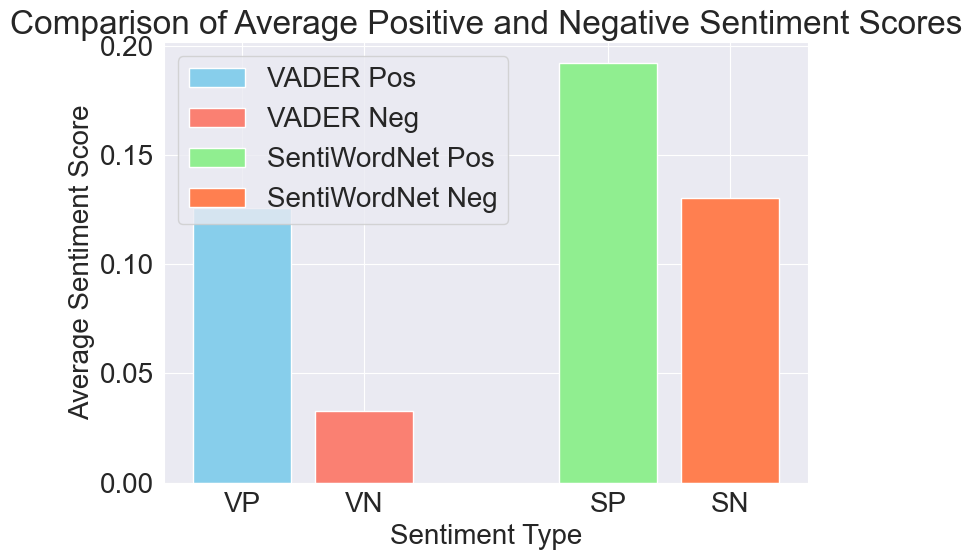

In [57]:
import matplotlib.pyplot as plt

# Calculate average VADER positive and negative sentiment scores
avg_vader_pos = sum(vader['pos'] for vader in df['vader_sentiment']) / len(df)
avg_vader_neg = sum(vader['neg'] for vader in df['vader_sentiment']) / len(df)

# Calculate average SentiWordNet positive and negative sentiment scores
avg_sentiwordnet_pos = sum(sentiwordnet['pos'] for sentiwordnet in df['sentiwordnet_sentiment']) / len(df)
avg_sentiwordnet_neg = sum(sentiwordnet['neg'] for sentiwordnet in df['sentiwordnet_sentiment']) / len(df)

# Plotting
plt.figure(figsize=(8, 6))

# VADER positive sentiment
plt.bar(x=[0], height=avg_vader_pos, width=0.4, color='skyblue', label='VADER Pos')

# VADER negative sentiment
plt.bar(x=[0.5], height=avg_vader_neg, width=0.4, color='salmon', label='VADER Neg')

# SentiWordNet positive sentiment
plt.bar(x=[1.5], height=avg_sentiwordnet_pos, width=0.4, color='lightgreen', label='SentiWordNet Pos')

# SentiWordNet negative sentiment
plt.bar(x=[2], height=avg_sentiwordnet_neg, width=0.4, color='coral', label='SentiWordNet Neg')

plt.title('Comparison of Average Positive and Negative Sentiment Scores')
plt.xlabel('Sentiment Type')
plt.ylabel('Average Sentiment Score')
plt.xticks([0, 0.5, 1.5, 2], ['VP', 'VN', 'SP', 'SN'])
plt.legend()
plt.tight_layout()
plt.show()

In [58]:
pip install textblob

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [59]:
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer
from nltk.corpus import sentiwordnet as swn
from textblob import TextBlob

# Download necessary resources for NLTK
nltk.download('vader_lexicon')
nltk.download('sentiwordnet')



# Function to perform sentiment analysis with TextBlob
def analyze_sentiment_textblob(sentence):
    blob = TextBlob(sentence)
    polarity = blob.sentiment.polarity
    subjectivity = blob.sentiment.subjectivity
    return {'polarity': polarity, 'subjectivity': subjectivity}

for message in df['message']:
    vader_sentiment = analyze_sentiment_vader(message)
    sentiwordnet_sentiment = analyze_sentiment_sentiwordnet(message)
    textblob_sentiment = analyze_sentiment_textblob(message)

    print("Message:", message)
    print("VADER Sentiment:", vader_sentiment)
    print("SentiWordNet Sentiment:", sentiwordnet_sentiment)
    print("TextBlob Sentiment:", textblob_sentiment)
    print()

Message: Messages and calls are end-to-end encrypted. No one outside of this chat, not even WhatsApp, can read or listen to them. Tap to learn more. 
VADER Sentiment: {'neg': 0.084, 'neu': 0.916, 'pos': 0.0, 'compound': -0.296}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 1.25, 'obj': 16.375}
TextBlob Sentiment: {'polarity': 0.25, 'subjectivity': 0.275}

Message: Samay Raina created group "CODERS👨‍💻👩‍💻🖥💻" 
VADER Sentiment: {'neg': 0.0, 'neu': 0.667, 'pos': 0.333, 'compound': 0.25}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: You joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.789, 'pos': 0.211, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: +91 99871 38558 joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.1531}

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\ASUS\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package sentiwordnet to
[nltk_data]     C:\Users\ASUS\AppData\Roaming\nltk_data...
[nltk_data]   Package sentiwordnet is already up-to-date!


Message: +91 91372 82638 joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: +91 75069 97789 joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: +91 98234 51436 joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: +91 87796 70896 joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob

Message: +91 79770 56210 joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: +91 90499 38860 joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: +91 80801 39870 joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: +91 96648 44643 joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob

Message: +91 96536 93868 joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: +91 79776 23387 joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: +91 95187 88109 joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: +91 94044 50783 joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob

Message: We'll try posting our codes at 10 pm ... 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 6.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: +91 82916 40581 joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Alright 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.25}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.25, 'obj': 0.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Also  Please note  People genuinely interested in coding or Want to start coding only be in this group 
VADER Sentiment: {'neg': 0.0, 'neu': 0.704, 'pos': 0.296, 'compound': 0.6486}
SentiWordNet Sentiment: {'pos': 1.375, 'neg': 0.25, 'obj': 14.375}
TextBlob Sentiment: 

Message: Yes 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4019}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 0.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: C is only restricted to functions ..While c++has classes and structures vala stuff 
VADER Sentiment: {'neg': 0.191, 'neu': 0.809, 'pos': 0.0, 'compound': -0.3818}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 8.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 1.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Just check my soln out 
VADER Sentiment: {'neg

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Here 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I generalized the code too 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.25, 'obj': 3.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Hence this is the most appropriate 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.125, 'obj': 3.5}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.5}

Message: Can anyone send the list of codes to be done in C this sem 
VADER Sentiment: {'neg': 0.0, '

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: In this program why do we get output of i uptill 10 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 8.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: More than 2 test conditions🤨 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.5}

Message: Is it allowed!? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 2.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Compile it and send the o/p 
VADER Sentiment: {'neg': 0.0, 'n

Message: Guys today's q. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Just a note 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.0, 'obj': 2.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Haan will try 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 1.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: . 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBl

Message: my code has so many variables ...it might me difficult to understand... 
VADER Sentiment: {'neg': 0.185, 'neu': 0.815, 'pos': 0.0, 'compound': -0.3612}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 1.25, 'obj': 8.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.75}

Message: 👍 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 👍 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: See the above solns for digits counting 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.1}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.

Message: bro ek question hai 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.25, 'obj': 0.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: tune math.h library ko import nai kia na? 
VADER Sentiment: {'neg': 0.375, 'neu': 0.625, 'pos': 0.0, 'compound': -0.6369}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: infact mere hisaab se undeclared indentifier ka error bhi pop up hona chaiye tha but run horaha hai🤯🤯 
VADER Sentiment: {'neg': 0.098, 'neu': 0.902, 'pos': 0.0, 'compound': -0.2144}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 1.375, 'obj': 7.625}
TextBlob Sentiment: {'polarity': -0.5, 'subjectivity': 0.5}

Message: This is because 52 (i.e. 25) might be stored as 24.9999999 or 25.0000000001 because the return type is double. When assigned to int, 25.0000000001 becomes 25 but 24.9999999 will give output 24. T

Message: Ohk 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 👍 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Superb logic👍 
VADER Sentiment: {'neg': 0.0, 'neu': 0.196, 'pos': 0.804, 'compound': 0.6249}
SentiWordNet Sentiment: {'pos': 0.875, 'neg': 0.0, 'obj': 0.125}
TextBlob Sentiment: {'polarity': 1.0, 'subjectivity': 1.0}

Message: darshan sir told us to avoid statements like break if possible since it causes halt in the flow of the program abruptly and causes voltage fluctuations  (just telling this to you),so just keep that in mind 
VADER Sentiment: {'neg': 0.057, 'neu': 0.879, 'pos': 0.065, 'compound': 0.0772}
SentiWordNet Sentiment: {'pos': 1.5, 'neg': 0.0, 'obj': 23.5}
TextBlob Sentimen

Message: Yes bro ...That was the trick in the whole plot 
VADER Sentiment: {'neg': 0.101, 'neu': 0.672, 'pos': 0.227, 'compound': 0.3612}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 5.625}
TextBlob Sentiment: {'polarity': 0.2, 'subjectivity': 0.4}

Message: Yeah 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Sharma ji ka beta on fire 😂🔥 
VADER Sentiment: {'neg': 0.286, 'neu': 0.714, 'pos': 0.0, 'compound': -0.34}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment: {'neg':

Message: Here @919653693868 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: no its not working for any other test cases... 
VADER Sentiment: {'neg': 0.216, 'neu': 0.784, 'pos': 0.0, 'compound': -0.296}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 1.5, 'obj': 6.375}
TextBlob Sentiment: {'polarity': -0.125, 'subjectivity': 0.375}

Message: Ig its bcoz of the extra spaces I printed 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 6.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.1}

Message: What O/p is it givinh 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 1.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: And what is the expected o/p 
VA

Message: Then send the soln 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.0, 'obj': 1.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: just check please 
VADER Sentiment: {'neg': 0.0, 'neu': 0.465, 'pos': 0.535, 'compound': 0.3182}
SentiWordNet Sentiment: {'pos': 1.25, 'neg': 0.0, 'obj': 1.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 

Message: Oh got it thanks 
VADER Sentiment: {'neg': 0.0, 'neu': 0.508, 'pos': 0.492, 'compound': 0.4404}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 3.75}
TextBlob Sentiment: {'polarity': 0.2, 'subjectivity': 0.2}

Message: Cheers! 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.5255}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 0.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yeah it runs just fine 
VADER Sentiment: {'neg': 0.0, 'neu': 0.429, 'pos': 0.571, 'compound': 0.4588}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.125, 'obj': 4.25}
TextBlob Sentiment: {'polarity': 0.4166666666666667, 'subjectivity': 0.5}

Message: Thanks saket 
VADER Sentiment: {'neg': 0.0, 'neu': 0.256, 'pos': 0.744, 'compound': 0.4404}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 0.875}
TextBlob Sentiment: {'polarity': 0.2, 'subjectivity': 0.2}

Message: Np. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound

Message: See every data type has a range 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 7.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Of nos it represents 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.25, 'obj': 2.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Can someone help me setup the Build Task for C++ in VSCODE 
VADER Sentiment: {'neg': 0.0, 'neu': 0.803, 'pos': 0.197, 'compound': 0.4019}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.0, 'obj': 7.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Need Urgent Assistance 
VADER Sentiment: {'neg': 0.0, 'neu': 0.526, 'pos': 0.474, 'compound': 0.2023}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.125, 'obj': 2.25}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: As far as I know signed int

Message: And then bracket close of earlier loop 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.125, 'obj': 4.125}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.5}

Message: yeah 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ok 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.5}

Message: nooo  just curious 
VADER Sentiment: {'neg': 0.0, 'neu': 0.465, 'pos': 0.535, 'compound': 0.3182}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.375, 'obj': 0.875}
TextBlob Sentiment: {'polarity': -0.1, 'subjectivity': 1.0}

Message: thanks tho 
VADER Sentiment: {'neg': 0.0, 'neu': 0.256, 'pos': 0.744, 'compound': 0.4404}
Senti

Message: https://www.youtube.com/watch?v=fUqpYvIYj-Y 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Guys, just asking even though we are just FEs, Do we have an experinced programmers amongst us 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 1.25, 'neg': 0.125, 'obj': 11.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Some one who solves CodeChef ? 
VADER Sentiment: {'neg': 0.0, 'neu': 0.656, 'pos': 0.344, 'compound': 0.2732}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: @919920175875 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

M

Message: 👍🏻 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Was anyone able to solve this? 
VADER Sentiment: {'neg': 0.0, 'neu': 0.735, 'pos': 0.265, 'compound': 0.2023}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.625}

Message: Nope🤦‍♂ 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: No issues..... 
VADER Sentiment: {'neg': 0.688, 'neu': 0.312, 'pos': 0.0, 'compound': -0.296}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.25, 'obj': 1.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Imma post today's challenge in some time.... 
VADER Sentiment: {'neg': 0.0, 'neu': 0.822, 'pos': 0.178, 'compound

Message: ya 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Correct? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 0.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 👍 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: but that is very very inefficient 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 1.25, 'neg': 0.625, 'obj': 3.125}
TextBlob Sentiment: {'polarity': 0.26, 'subjectivity': 0.39}

Message: can be done using  better logic 
VADER Sentiment: {'neg': 0.0, 'neu': 0.633, 'pos': 0.367, 'compound': 0.4404}
SentiWordNet Sentiment: {'p

Message: Me 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Dm 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.625, 'obj': 0.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: https://research.hackerrank.com/developer-skills/2020?utm_medium=social&utm_source=instagram&utm_campaign=021420&utm_content=IGPoll 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: https://forms.gle/27DSsnJnBBMRy6Bt8 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Plz d

Message: guys we do not have file operations in syllabus right? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.625, 'obj': 8.375}
TextBlob Sentiment: {'polarity': 0.2857142857142857, 'subjectivity': 0.5357142857142857}

Message: No I guess 
VADER Sentiment: {'neg': 0.688, 'neu': 0.312, 'pos': 0.0, 'compound': -0.296}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.5, 'obj': 2.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Can someone explain the question first 😅 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.25, 'obj': 4.375}
TextBlob Sentiment: {'polarity': 0.25, 'subjectivity': 0.3333333333333333}

Mes

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: so the random characters should just be alphabets ? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.0, 'obj': 5.25}
TextBlob Sentiment: {'polarity': -0.5, 'subjectivity': 0.5}

Message: What if the string has more than 18 characters? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.5}

Message: What about duplicate letters? 
VADER Sentiment: {'neg': 0

Message: N other 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.625, 'obj': 1.375}
TextBlob Sentiment: {'polarity': -0.125, 'subjectivity': 0.375}

Message: Even simplest of the programs can mess you up 
VADER Sentiment: {'neg': 0.238, 'neu': 0.762, 'pos': 0.0, 'compound': -0.3612}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.5, 'obj': 5.375}
TextBlob Sentiment: {'polarity': -0.175, 'subjectivity': 0.175}

Message: If you have any good programs from your lectures then plz do send 
VADER Sentiment: {'neg': 0.0, 'neu': 0.724, 'pos': 0.276, 'compound': 0.4939}
SentiWordNet Sentiment: {'pos': 0.875, 'neg': 0.0, 'obj': 7.125}
TextBlob Sentiment: {'polarity': 0.7, 'subjectivity': 0.6000000000000001}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Mess

Message: Ya sure we will try our best 
VADER Sentiment: {'neg': 0.0, 'neu': 0.435, 'pos': 0.565, 'compound': 0.7579}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.5, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.75, 'subjectivity': 0.5944444444444444}

Message: Ya 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Definitely looking forward to it 
VADER Sentiment: {'neg': 0.0, 'neu': 0.597, 'pos': 0.403, 'compound': 0.4019}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.0, 'obj': 3.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.5}

Message: thanks for this💯 
VADER Sentiment: {'neg': 0.0, 'neu': 0.408, 'pos': 0.592, 'compound': 0.4404}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 0.875}
TextBlob Sentiment: {'polarity': 0.2, 'subjectivity': 0.2}

Message: why isn't there a committee of ACM at tsec any idea? 
VADE

Message: He's my teammate btw 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Nice 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.6, 'subjectivity': 1.0}

Message: Hey everyone!  Harsh here from SE IT.  I'm always ready to help anyone with anything they need! Don't feel afraid to hit me up with any kind of problem! 
VADER Sentiment: {'neg': 0.183, 'neu': 0.676, 'pos': 0.141, 'compound': -0.3755}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 2.125, 'obj': 15.125}
TextBlob Sentiment: {'polarity': 0.04999999999999999, 'subjectivity': 0.75}

Message: Yall can share your experiences of the competition 
VADER Sentiment: {'neg': 0.0, 'neu': 0.761, 'pos': 0.239, 'compound': 0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg

Message: Hear hear 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Hear hear 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yeah man Realized this pretty late 
VADER Sentiment: {'neg': 0.0, 'neu': 0.402, 'pos': 0.598, 'compound': 0.714}
SentiWordNet Sentiment: {'pos': 1.25, 'neg': 0.125, 'obj': 3.625}
TextBlob Sentiment: {'polarity': -0.024999999999999994, 'subjectivity': 0.8}

Message: Are you guys participating again this year?? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: lol 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 

Message: Lets not discuss this here 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.625, 'obj': 3.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Please 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.3182}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.0, 'obj': 0.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Same luckily she's not for our division 
VADER Sentiment: {'neg': 0.0, 'neu': 0.645, 'pos': 0.355, 'compound': 0.5106}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.625, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.16666666666666666, 'subjectivity': 0.4791666666666667}

Message: Only programming stuff to be discussed here  A humble request 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.375, 'obj': 8.625}
TextBlob Sentiment: {'polarity': -0.1, 'subjectivity': 0.7}

Message: And any front end languages? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: @917506412914 will guide you regarding this 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 2.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Try responsive web course on fcc 
VADER Sentiment: {'neg': 0.0, 'neu': 0.667, 'pos': 0.333, 'compound': 0.3612}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 5.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Plzz🙏 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ohk 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compou

Message: Oh 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: And code cell too has some coding event on 27 right? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.25, 'obj': 9.625}
TextBlob Sentiment: {'polarity': 0.2857142857142857, 'subjectivity': 0.5357142857142857}

Message: Ya 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: CodeStorm 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: yes 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4019}
SentiWordNet

Message: yall have project in AP? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: But that drawing wala bs 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yeah 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yeah No assingments 
VADER Sentiment: {'neg': 0.407, 'neu': 0.185, 'pos': 0.407, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.25, 'obj': 1.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Mini Project 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet 

Message: It can be done in O(n) too 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.25, 'obj': 7.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This fails if number of elements is large , say 10^8 
VADER Sentiment: {'neg': 0.231, 'neu': 0.661, 'pos': 0.107, 'compound': -0.3612}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 1.0, 'obj': 4.625}
TextBlob Sentiment: {'polarity': -0.14285714285714285, 'subjectivity': 0.36428571428571427}

Message: Time limit exceeded aayega 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ab ye samjh ke bahar jaa raha hai😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 

Message: N-i likha toh he usne 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ab sorry 
VADER Sentiment: {'neg': 0.565, 'neu': 0.435, 'pos': 0.0, 'compound': -0.0772}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.625, 'obj': 1.375}
TextBlob Sentiment: {'polarity': -0.5, 'subjectivity': 1.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I read it as n-1 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 3.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: n-i 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'po

Message: +91 98206 01141 joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: you want the log na jaha pe error aata hai 
VADER Sentiment: {'neg': 0.225, 'neu': 0.667, 'pos': 0.108, 'compound': -0.34}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.875, 'obj': 4.125}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: +91 98501 32687 joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: press f9 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Messag

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Here is the code for sorting 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Senti

Message: Y r u taking it as sine function take it as series ka sum 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 14.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Accha ok 
VADER Sentiment: {'neg': 0.0, 'neu': 0.312, 'pos': 0.688, 'compound': 0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.5}

Message: What's Wrong in this one? 
VADER Sentiment: {'neg': 0.437, 'neu': 0.563, 'pos': 0.0, 'compound': -0.4767}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.75, 'obj': 2.25}
TextBlob Sentiment: {'polarity': -0.5, 'subjectivity': 0.9}

Message: n-1 hoga condition mein not n-2 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.625, 'obj': 1.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: if condition bhi galat hai 
VADER Se

Message: nice 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.6, 'subjectivity': 1.0}

Message: there is never a fixed way of solving a problem 
VADER Sentiment: {'neg': 0.243, 'neu': 0.541, 'pos': 0.216, 'compound': -0.0772}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 1.5, 'obj': 7.25}
TextBlob Sentiment: {'polarity': -0.05, 'subjectivity': 0.2}

Message: Yeah 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Algo-web.netlify.com  Guys Our beloved friend @917208176024 had developed this 
VADER Sentiment: {'neg': 0.0, 'neu': 0.519, 'pos': 0.481, 'compound': 0.7579}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.0, 'obj': 4.5}
TextBlob Sentiment: {'polarity': 0.39999999999999997, 'subjectivity': 0.65}

Message: Do 

Message: Add her 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.125, 'obj': 0.25}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Samay Raina added +91 70452 77749 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: If anyone needs 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.125, 'obj': 0.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: +91 99695 65480 joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compoun

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: After clicking it should show this page only 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 6.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 1.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 👍 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'ne

Message: I did not get any invite 
VADER Sentiment: {'neg': 0.265, 'neu': 0.735, 'pos': 0.0, 'compound': -0.1139}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.625, 'obj': 5.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: U visited that link? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yes 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4019}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 0.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Were u logged in? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 3.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yes 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4019}
SentiWordNet S

Message: 🤣 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: EXACTLY. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 0.875}
TextBlob Sentiment: {'polarity': 0.25, 'subjectivity': 0.25}

Message: Good job 
VADER Sentiment: {'neg': 0.0, 'neu': 0.256, 'pos': 0.744, 'compound': 0.4404}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.0, 'obj': 1.5}
TextBlob Sentiment: {'polarity': 0.7, 'subjectivity': 0.6000000000000001}

Message: Thanks 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4404}
SentiWordNet Sentiment: {'pos'

Message: Thanks 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4404}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 0.875}
TextBlob Sentiment: {'polarity': 0.2, 'subjectivity': 0.2}

Message: Does anyone of you have your own website? Monitized ? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.6, 'subjectivity': 1.0}

Message: Monetized? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: google ads? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: https://chrome.google.com/webstore/detail/youtube-playback-speed-co/hdannnflhlmdablckfkjplei

Message: ^^ 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: ? 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: For? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: . 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Kar reg 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}



Message: +91 99693 94098 joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.833, 'pos': 0.167, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 🙁 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Aaj kafi hard tha na?😅 
VADER Sentiment: {'neg': 0.259, 'neu': 0.741, 'pos': 0.0, 'compound': -0.1027}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.75, 'obj': 1.25}
TextBlob Sentiment: {'polarity': -0.2916666666666667, 'subjectivity': 0.5416666666666666}

Message: halat kharab ho gayi bro 
VADER Sentiment: {'n

Message: official rd h new toh hoga he... 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.25, 'obj': 3.375}
TextBlob Sentiment: {'polarity': 0.13636363636363635, 'subjectivity': 0.45454545454545453}

Message: Ill be sitting and trying all the problems we did today and of the Mashup Some day after 29th  Anyone wanna join me? 
VADER Sentiment: {'neg': 0.199, 'neu': 0.722, 'pos': 0.079, 'compound': -0.5106}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 1.125, 'obj': 14.5}
TextBlob Sentiment: {'polarity': -0.5, 'subjectivity': 1.0}

Message: Yes 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4019}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 0.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ofc 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 's

Message: We should try the sums before viewing the editorial, right? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 5.875}
TextBlob Sentiment: {'polarity': 0.2857142857142857, 'subjectivity': 0.5357142857142857}

Message: Haa 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: If dont get any idea or not able to AC it, then read editorial and imolement if still fail then look at the code and implement urself again 
VADER Sentiment: {'neg': 0.115, 'neu': 0.885, 'pos': 0.0, 'compound': -0.5423}
SentiWordNet Sentiment: {'pos': 1.375, 'neg': 0.75, 'obj': 16.875}
TextBlob Sentiment: {'polarity': -0.375, 'subjectivity': 0.46249999999999997}

Message: AC? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 

Message: Organiser here lol 
VADER Sentiment: {'neg': 0.0, 'neu': 0.417, 'pos': 0.583, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.8, 'subjectivity': 0.7}

Message: Ok matlab mein he nhi tha😂 
VADER Sentiment: {'neg': 0.0, 'neu': 0.694, 'pos': 0.306, 'compound': 0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.5}

Message: Trushant Narwani (TSEC, CS) joined using this group's invite link 
VADER Sentiment: {'neg': 0.0, 'neu': 0.849, 'pos': 0.151, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 6.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Solution to this problem↓ 
VADER Sentiment: {'neg': 0.0, 'neu': 0.566, 'pos': 0.434, 'compound': 0.3182}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: 

Message: Programming* 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: What if someone makes fun of Coding? Will you be able to stand him/her? 
VADER Sentiment: {'neg': 0.0, 'neu': 0.78, 'pos': 0.22, 'compound': 0.5661}
SentiWordNet Sentiment: {'pos': 1.125, 'neg': 0.0, 'obj': 6.875}
TextBlob Sentiment: {'polarity': 0.4, 'subjectivity': 0.4125}

Message: Vaise toh permutations & combinations ka bhi kitna use hai 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: In fact I still have JEE notes and stuff from it 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 8.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjecti

Message: ? 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Some ppl just do it for fun 
VADER Sentiment: {'neg': 0.0, 'neu': 0.645, 'pos': 0.355, 'compound': 0.5106}
SentiWordNet Sentiment: {'pos': 1.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.3, 'subjectivity': 0.2}

Message: Sometimes competitors 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Do it to ruin events like these 
VADER Sentiment: {'neg': 0.336, 'neu': 0.442, 'pos': 0.221, 'compound': -0.3182}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.5, 'obj': 4.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: they do it for kicks 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compoun

Message: FEs ko bol raha hoon 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 👍 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Mast! 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 👏👏 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
T

Message: Cant this be a bit early or late ? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 6.875}
TextBlob Sentiment: {'polarity': -0.09999999999999999, 'subjectivity': 0.44999999999999996}

Message: Like what time? 
VADER Sentiment: {'neg': 0.0, 'neu': 0.444, 'pos': 0.556, 'compound': 0.3612}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 1.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Anytime before 3 or after 7 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Evening mein revise karnege right? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.2857142857142857, 'subjectivity': 0.5357142857142857}



Message: Anyone giving codekaze final round? 
VADER Sentiment: {'neg': 0.0, 'neu': 0.625, 'pos': 0.375, 'compound': 0.34}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': -0.1, 'subjectivity': 0.7}

Message: Me. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Anyone wants to give 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.25, 'obj': 1.75}
TextBlob Sentiment: {'polarity': 0.2, 'subjectivity': 0.1}

Message: Kuch nahi samjh raha hai😅😅😢 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: ☝🏻 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sent

Message: 👍🏻 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Register before contest starts or else you won't be able to enter. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.0, 'obj': 7.625}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.625}

Message: Where can we find the conventions which we have to follow like using int main return 0 instead of void main 
VADER Sentiment: {'neg': 0.0, 'neu': 0.884, 'pos': 0.116, 'compound': 0.3612}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.0, 'obj': 12.25}
TextBlob Sentiment: {'polarity': 0.16666666666666666, 'subjectivity': 

Message: So I have to do AP+AC today🤒 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: chill bro i havent started yet🤣 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.25, 'obj': 2.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Same here 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.125}

Message: konsa hai😂? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: What's the timing tomorrow?? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0

Message: shivika malik changed the group description 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Visit link in description. Itll have link to questions. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.25, 'obj': 6.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ohk ty 
VADER Sentiment: {'neg': 0.0, 'neu': 0.278, 'pos': 0.722, 'compound': 0.3818}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: https://codeforces.com/blog/entry/60949 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This is of today right 
VADER 

Message: https://www.geeksforgeeks.org/fast-io-for-competitive-programming/ 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: cin.tie(NULL); 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.25, 'obj': 0.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: ios::sync_with_stdio(false); 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.75, 'obj': 1.25}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Include it in the code 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ohh. Okay. 
VADER Sentiment: {'neg': 0.0, 'ne

Message: While using scanf 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: abhi bhi aaraha hai 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: u didnt use that variable? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: use kiya hai 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: haar mein ye error aaraha hai 
VADER Sentiment: {'neg': 0.351, 'neu': 0.649, 'pos': 0.0, 'compound': -0.4019}
S

Message: Ab koi mat nikalna please😅 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: https://atcoder.jp/contests/abc158/submissions/10606151 Problem B solution   https://atcoder.jp/contests/abc158/submissions/10614920 Problem C solution   https://atcoder.jp/contests/abc158/submissions/10636078 Problem D solution 
VADER Sentiment: {'neg': 0.45, 'neu': 0.167, 'pos': 0.383, 'compound': -0.296}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 2.125, 'obj': 9.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: not the most efficient solution but gets the job done 
VADER Sentiment: {'neg': 0.153, 'neu': 0.692, 'pos': 0.155, 'compou

Message: all the best guya 
VADER Sentiment: {'neg': 0.0, 'neu': 0.417, 'pos': 0.583, 'compound': 0.6369}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 1.75}
TextBlob Sentiment: {'polarity': 1.0, 'subjectivity': 0.3}

Message: guys* 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: hey anyone who can take a look at my cpp code for B question 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.25, 'obj': 8.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: getting error? 
VADER Sentiment: {'neg': 0.73, 'neu': 0.27, 'pos': 0.0, 'compound': -0.4019}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.625, 'obj': 1.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: yes 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 

Message: Correct me if m wrong 
VADER Sentiment: {'neg': 0.508, 'neu': 0.492, 'pos': 0.0, 'compound': -0.4767}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.75, 'obj': 3.0}
TextBlob Sentiment: {'polarity': -0.5, 'subjectivity': 0.9}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: ar stores starting address 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.1}

Message: ar is a pointer to the first block of memory alloted to array so you can also dereference it like any otger pointer so ar[i] = *(ar+i) 
VADER Sentiment: {'neg': 0.102, 'neu': 0.81, 'pos': 0.088, 'compound': -0.1027}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.125, 'obj': 18.5}
TextBlob Sentiment: {'polar

Message: At what time is the github and cp seminar on sat? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 5.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: @917506412914 ?? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 21st march starts around 10 am. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 6.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Volunteering ka bhi hai voh time 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Volunteering for what? 
VADER Sentiment: {'neg': 0.0

Message: ohhhh 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: thanks 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4404}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 0.875}
TextBlob Sentiment: {'polarity': 0.2, 'subjectivity': 0.2}

Message: https://codeforces.com/blog/entry/74714 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: CCDSAP postpone ho gaya 
VADER Sentiment: {'neg': 0.388, 'neu': 0.612, 'pos': 0.0, 'compound': -0.2263}
SentiWord

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: correct me if im wrong 
VADER Sentiment: {'neg': 0.437, 'neu': 0.563, 'pos': 0.0, 'compound': -0.4767}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.75, 'obj': 2.0}
TextBlob Sentiment: {'polarity': -0.5, 'subjectivity': 0.9}

Message: for this sum we need to find all the magic squares and compare it with our cube?? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 1.25, 'neg': 0.375, 'obj': 7.375}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 1.0}

Message: Yes and find the one at min cost 
VADER Sentiment: {'neg': 0.0, 'neu': 0.722, 'pos': 0.278, 'compound': 0.4019}
SentiWordNet Sentiment: {'pos': 0.875, 'neg': 0.0, 'obj': 5.125}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😶😶 
VADER Sentiment: {'n

Message: 👍 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Guys I copied this code from geeksforgeeks 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.25, 'obj': 3.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: But its not working 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.625, 'obj': 3.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I mean how do I include a user defined file in another file using #include "" 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'po

Message: For today's maship 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 0.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: *mashup 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Sanyog Sharma added +91 93598 18687 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Invited 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.

Message: shivika malik changed the group description 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Who dis? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: not from TSEC... 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.625, 'obj': 0.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: someones frnd 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Tabhi😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Se

Message: Logic mila but implementation😭 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Vahi 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 💯 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Welcome🙏 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'pol

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Nhi bhai 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Abhi toh ds or algo bhi nhi aata hai aache se 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Acha ab smjha iska mtlb 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: https://youtu.be/s6LrBex9NPA 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.

Message: Same here 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.125}

Message: I have been following karan on quora for a while now. he posts some really good answers there. Guys please check his profile on quora. The answers are more relevant to us than anyone else as he is also a studen of mumbai university. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.877, 'pos': 0.123, 'compound': 0.6697}
SentiWordNet Sentiment: {'pos': 2.25, 'neg': 0.25, 'obj': 29.5}
TextBlob Sentiment: {'polarity': 0.4, 'subjectivity': 0.525}

Message: Ty 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.3818}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: thank you for the tips! 
VADER Sentiment: {'neg': 0.0, 'neu': 0.589, 'pos': 0.411, 'compound': 0.4199}
SentiWordNet Sentiment: {

Message: *Java compareTo Algorithm* ``` int compareTo(String a, String b){ 	int d = a.length() - b.length(); 	int i = 0; 	for(int i = 0; (d != 0) && (i < a.length()); i++)  		d = a.charAt(i) - b.charAt(i); 	 	return d; }``` 
VADER Sentiment: {'neg': 0.134, 'neu': 0.866, 'pos': 0.0, 'compound': -0.636}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 1.0, 'obj': 17.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: What u said is correct but the reason am telling you to start with hackerRank is if u do then not only ur practicing but ur also building a profile which can be put up on resume. Companies do see ur Website profile specially hackerRank while if u Solve practice contest questions on codechef ur rating is not gonna increase as far as I know ratings codechef increases only when we participate and solve in long challenge, lunchtime and cookoff. Rest as u wish practicing is important anyway 
VADER Sentiment: {'neg': 0.027, 'neu': 0.844, 'pos': 0.129, 'compound': 0.

Message: Select the text and select monospace 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: ``` 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: ``` this works too `` ` 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.25, 'obj': 1.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Without the space 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}


Message: In java? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I don't think so 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ohk 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: No 
VADER Sentiment: {'neg': 1.0, 'neu': 0.0, 'pos': 0.0, 'compound': -0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.25, 'obj': 0.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ohk ty 
VADER Sentiment: {'neg': 0.0, 'neu': 0.278, 'pos': 0.722, 'compound': 0.3818}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob S

Message: Hmm 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Google pe I tried searching nahi mila 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Haa yes 
VADER Sentiment: {'neg': 0.0, 'neu': 0.27, 'pos': 0.73, 'compound': 0.4019}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 0.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: After one cycle 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yes 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4019}
SentiWordNet Sentiment: {'pos': 0.25,

Message: pro player in😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Who is it tell us @919594908570 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 4.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: At least don't spam🤦‍♂ 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos':

Message: In the first problem 
VADER Sentiment: {'neg': 0.474, 'neu': 0.526, 'pos': 0.0, 'compound': -0.4019}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.625, 'obj': 2.375}
TextBlob Sentiment: {'polarity': 0.25, 'subjectivity': 0.3333333333333333}

Message: Its working perfectly fine in my bluej compiler🤔 
VADER Sentiment: {'neg': 0.0, 'neu': 0.5, 'pos': 0.5, 'compound': 0.7184}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.125, 'obj': 4.375}
TextBlob Sentiment: {'polarity': 0.4166666666666667, 'subjectivity': 0.5}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Nahi 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I think its bcoz Im using 11.0.6 
V

Message: Yes 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4019}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 0.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: lol 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.8, 'subjectivity': 0.7}

Message: painnnnnnn 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: ＞﹏＜ 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {

Message: Thanks mate! 
VADER Sentiment: {'neg': 0.0, 'neu': 0.239, 'pos': 0.761, 'compound': 0.4926}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 1.875}
TextBlob Sentiment: {'polarity': 0.25, 'subjectivity': 0.2}

Message: 👏👏 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: No problem! 
VADER Sentiment: {'neg': 1.0, 'neu': 0.0, 'pos': 0.0, 'compound': -0.636}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.875, 'obj': 1.125}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Pls send today's questions 
VADER Sentiment: {'neg': 0.0, 'neu': 0.698, 'pos': 0.302, 'compound': 0.0772}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.25, 'obj': 2.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Editorial has link to problems🤦🏿‍♂ 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}

Message: Yes🤦‍♂ 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 🔥 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yess🔥🔥 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Am i the only one who is getting home sick?🙄 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 8.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 1.0}

Message: +1 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextB

Message: My favorite show of all time 
VADER Sentiment: {'neg': 0.0, 'neu': 0.625, 'pos': 0.375, 'compound': 0.4588}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 3.75}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 1.0}

Message: Yes do watch it it's awesome 
VADER Sentiment: {'neg': 0.0, 'neu': 0.37, 'pos': 0.63, 'compound': 0.7783}
SentiWordNet Sentiment: {'pos': 1.125, 'neg': 0.125, 'obj': 4.75}
TextBlob Sentiment: {'polarity': 1.0, 'subjectivity': 1.0}

Message: Maine silence of the lambs book padhi he 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Even bates motel 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Kaha gaya voh enthu😂😂 
VADER Sentiment: {'neg': 

Message: Bas bhai aur imagine Mat karo 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.5, 'obj': 2.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂😂😂😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Lmao 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.5994}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.6, 'subjectivity': 1.0}

Message: Aadat ho jayegi ghar pe baithne ki... 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 2.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Bruh fr 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos':

Message: Okk👍 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: #include<stdio.h> void main() {   int n,i,loc1,loc2;   printf("Enter no. of points:");   scanf("%d",&n);   float x[n],y[n];   for(int i=0;i<n;i++)   {     scanf("%f %f",&x[i],&y[i]);   }   float temp=x[0];   for(i=1;i<n;i++)   {     if(temp>x[i])     {       temp=x[i];       loc1 = i;     }   }   float m=0;   for(i=0;i<n && i!=loc1;i++)   {     float temp=(y[i]-y[loc2])/(x[i]-x[loc1]);     if(m<temp)     {       m=temp;       loc2=i;     }   }   printf("the points are %f,%f and %f,%f",x[loc1],y[loc1],x[loc2],y[loc2]); } 
VADER Sentiment: {'neg': 0.062, 'neu': 0.938, 'pos': 0.0, 'compound': -0.3595}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.5, 'obj': 52.375}
TextBlob Sentiment: {'polarity': 0.16666666666666666, 'subjectivity': 0.3333333333333333}

Message: See if it is worki

Message: https://practice.geeksforgeeks.org/contest/special-21-day-1-mathematics 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I did refresh,it took me to the problems section but problems khul nhi the 
VADER Sentiment: {'neg': 0.329, 'neu': 0.671, 'pos': 0.0, 'compound': -0.6597}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 1.25, 'obj': 8.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: If you are able to access then do send🙏 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.0, 'obj': 4.5}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.625}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0

Message: Ubuntu or windows? I need some help with windows version of docker 😕 
VADER Sentiment: {'neg': 0.0, 'neu': 0.787, 'pos': 0.213, 'compound': 0.4019}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.125, 'obj': 8.25}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Windows. What are you trying to do? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I'll dm wait 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.625, 'obj': 2.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Docker for desktop i

Message: 12 am 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 2-5 it is 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 1.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjecti

Message: Thanks harsh 
VADER Sentiment: {'neg': 0.5, 'neu': 0.0, 'pos': 0.5, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.625, 'obj': 1.25}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.44999999999999996}

Message: ? 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Welcome 😉 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4588}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 0.75}
TextBlob Sentiment: {'polarity': 0.8, 'subjectivity': 0.9}

Message: No 
VADER Sentiment: {'neg': 1.0, 'neu': 0.0, 'pos': 0.0, 'compound': -0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.25, 'obj': 0.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: In java? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 

Message: Acha , i didn't read the question properly 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.25, 'obj': 4.125}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.1}

Message: https://helpwithcovid.com/ 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Curated list of *100+ Free courses, books & tools* ranging from data science, digital marketing to photography & design — made accessible by companies, institutes & individuals in response to the coronavirus outbreak.   https://rajbohra.com/FreeResourcesCovid19 
VADER Sentiment: {'neg': 0.0, 'neu': 0.898, 'pos': 0.102, 'compound': 0.5106}
SentiWordNet Sentiment: {'pos': 0.875, 'neg': 0.125, 'obj': 21.0}
TextBlob Sentiment: {'polarity': 0.25833333333333336, 'subjectivity': 0.39166666666666666}

Message: 
VAD

Message: When class is unloading 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.375, 'obj': 2.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: What does that mean?I got the same ans on google 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 7.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.125}

Message: I mean what is unloading? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.375, 'obj': 3.375}
TextBlob Sentiment: {'polarity': -0.3125, 'subjectivity': 0.6875}

Message: Udher se he dekha😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment

Message: ohhh okay 
VADER Sentiment: {'neg': 0.0, 'neu': 0.345, 'pos': 0.655, 'compound': 0.2263}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.125, 'obj': 0.75}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.5}

Message: U had any other thoughts? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.625, 'obj': 4.0}
TextBlob Sentiment: {'polarity': -0.125, 'subjectivity': 0.375}

Message: i was thinking about iterative only between pos of 1s 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 8.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 1.0}

Message: didnt consider the fact that 0 answer was possible too 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.25, 'obj': 6.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 1.0}

Message: What was ur

SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 6.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: In 1st statement, variable ```fruits``` is an ArrayList, and in second statement, it is of type List. List is an abstract class, so it cannot be instantiated directly. List is used to group several different implementations of Lists, like ArrayL

Message: Oh okay 
VADER Sentiment: {'neg': 0.0, 'neu': 0.345, 'pos': 0.655, 'compound': 0.2263}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.125, 'obj': 1.75}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.5}

Message: But without it it can be done 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 6.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Its good problem but I saw something similar but was bit more high level so they used stack  I got confused and thought it's same problem 🤦🏻‍♂😅 
VADER Sentiment: {'neg': 0.267, 'neu': 0.671, 'pos': 0.062, 'compound': -0.7506}
SentiWordNet Sentiment: {'pos': 1.25, 'neg': 2.0, 'obj': 19.75}
TextBlob Sentiment: {'polarity': 0.15999999999999998, 'subjectivity': 0.47750000000000004}

Message: Could be solved by just traversing string.. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.741, 'pos': 0.259, 'compound': 0.2732}
SentiWordNet Sentiment:

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This is right in pycharm but it’s showing an error here 
VADER Sentiment: {'neg': 0.262, 'neu': 0.738, 'pos': 0.0, 'compound': -0.5499}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.875, 'obj': 8.875}
TextBlob Sentiment: {'polarity': 0.2857142857142857, 'subjectivity': 0.5357142857142857}

Message: @919820487592 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: What is the error 
VADER Sentiment: {'neg': 0.474, 'neu': 0.526, 'pos': 0.0, 'compound': -0.4019}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.75, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: What exactly is the error? 
VADE

Message: +91 88798 05171 was added 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Is the site of Codeforces opening? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 2.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Even the lighter versions are not opening^ 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.625, 'obj': 4.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Due to a power outage Codeforces and Polygon are unavailable now. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.5, 'obj': 6.75}
TextBlob Sentiment: {'polarity': -0.125, 'subjectivity': 0.375}

Messag

Message: ? 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Might have missed a corner case 
VADER Sentiment: {'neg': 0.355, 'neu': 0.645, 'pos': 0.0, 'compound': -0.296}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.75, 'obj': 4.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Long Queue =( 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.375, 'obj': 1.25}
TextBlob Sentiment: {'polarity': -0.4, 'subjectivity': 0.7}

Message: What am I suppose to do now? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: think which case you might have missed. Once the contest gets over you would be able to see th

Message: Wait ill enable it 
VADER Sentiment: {'neg': 0.483, 'neu': 0.517, 'pos': 0.0, 'compound': -0.4215}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.5, 'obj': 2.875}
TextBlob Sentiment: {'polarity': -0.5, 'subjectivity': 1.0}

Message: Ok 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.5}

Message: Private testcases and others submissions now viewable 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.125, 'obj': 3.125}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.375}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: what was the problem E about? 
VADER Sentiment: {'neg': 0.403, 'neu':

Message: It also has count parameter 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: You can use that 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: ya wait let me try if it accepts that 
VADER Sentiment: {'neg': 0.0, 'neu': 0.777, 'pos': 0.223, 'compound': 0.3182}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 5.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 👍🏻 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentime

Message: anyone solved today's C 
VADER Sentiment: {'neg': 0.0, 'neu': 0.488, 'pos': 0.512, 'compound': 0.2732}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Anyone who wants to learn C++ for CP, this video is more than enough 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.375, 'obj': 6.375}
TextBlob Sentiment: {'polarity': 0.2333333333333333, 'subjectivity': 0.3666666666666667}

Message: BFS+DFS + Terrible Implementation 
VADER Sentiment: {'neg': 0.608, 'neu': 0.392, 'pos': 0.0, 'compound': -0.4767}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.625, 'obj': 1.375}
TextBlob Sentiment: {'polarity': -1.0, 'subjectivity': 1.0}

Message: woaah 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Messag

Message: 🔥🔥🔥 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 🙌🏻 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Thank you @917045040641 and @919820487592 ! 
VADER Sentiment: {'neg': 0.0, 'neu': 0.589, 'pos': 0.411, 'compound': 0.4199}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 👍🏻👌🏻 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Se

Message: Thank you, Tushar! 
VADER Sentiment: {'neg': 0.0, 'neu': 0.417, 'pos': 0.583, 'compound': 0.4199}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 👍🏻👍🏻👍🏻 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Thank you, Shyren! 
VADER Sentiment: {'neg': 0.0, 'neu': 0.417, 'pos': 0.583, 'compound': 0.4199}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Haha 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4588}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.2, 'subjectivity': 0.3}

Message: https://codeforces.com/problemset/problem/1323/A 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWo

Message: Nope 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Oh.. Mera sample hua run but fir WA he mil rha tha 1hr k baad give up kr dia😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 12.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Second wala dekha? Kaafi interesting tha 
VADER Sentiment: {'neg': 0.0, 'neu': 0.649, 'pos': 0.351, 'compound': 0.4019}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 1.875}
TextBlob Sentiment: {'polarity': 0.25, 'subjectivity': 0.25}

Message: Nahi😞 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Aaj subah padha 
VADER Sentiment: {'neg': 0.0, 

Message: xD 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.5859}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Mera ek hi hua😓 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: @918830526885 D ka TC kya tha tere approach ka 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.375, 'obj': 4.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: np upsolve next one... 
VADER Sentiment: {'neg': 0.0, 'neu': 0.556, 'pos': 0.444, 'compound': 0.34}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Pehle waale mai tle mila coz I used brute force,what wqs the approach @918408867834 ? 
V

Message: Everyone needs to have a look at this☝️ 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.125, 'obj': 4.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 👍👍 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 👍🏻 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}

Message: This is sorce 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 0.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 0.0001% 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: The headline ends with a question mark 🤦🏻‍♂️ 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.375, 'obj': 4.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Uday samant said ki no one will be promoted without exam 
VADER Sentiment: {'neg': 0.157, 'neu': 0.643, 'pos': 0.2, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.25, 'obj': 7.25}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Online exam best☠️☠️ 
VADER Sentiment: {'neg':

Message: C 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: In B, I got TLE in the 3rd pretest. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 5.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: i solved it using prefix array 
VADER Sentiment: {'neg': 0.0, 'neu': 0.656, 'pos': 0.344, 'compound': 0.2732}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 6.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: pratik did it using sliding window 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Codeforces is down and i didn't save my code 
VADER Sentiment: {'neg

Message: Cool 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.3182}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.375, 'obj': 0.375}
TextBlob Sentiment: {'polarity': 0.35, 'subjectivity': 0.65}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Difficult choice between Python and Kotlin. 
VADER Sentiment: {'neg': 0.333, 'neu': 0.667, 'pos': 0.0, 'compound': -0.3612}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.75, 'obj': 3.25}
TextBlob Sentiment: {'polarity': -0.5, 'subjectivity': 1.0}

Message: Why tho? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentime

Message: 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: wow all of you are🙆🏽‍♂️🔥 
VADER Sentiment: {'neg': 0.0, 'neu': 0.513, 'pos': 0.487, 'compound': 0.5859}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.375, 'obj': 1.375}
TextBlob Sentiment: {'polarity': 0.1, 'subjectivity': 1.0}

Message: Private testcases and others submission now viewable 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.125, 'obj': 3.125}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.375}

Message: Thank you Pratik! 🙌🏻 
VADER Sentiment: {'neg': 0.0, 'neu': 0.518, 'pos': 0.482, 'compound': 0.4199}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Congratulations @918247578176 @919689727471 @918408867834 🙌🏻🙌🏻

Message: I use geany.. Its good for Linux lots of bugs in Win verson 
VADER Sentiment: {'neg': 0.0, 'neu': 0.599, 'pos': 0.401, 'compound': 0.7717}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.25, 'obj': 8.125}
TextBlob Sentiment: {'polarity': 0.75, 'subjectivity': 0.5}

Message: Jetbrains ka hai na vo> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I* 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: haa 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I use Windows 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}

Message: Considering you have installed mingw 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yes 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4019}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 0.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I have 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: In this extension page you will find extension 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.0, 'obj': 5.25}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Docs* 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}

Message: can any1 tell me the approach to solve this one?Im getting a wrong answer on test 5 
VADER Sentiment: {'neg': 0.173, 'neu': 0.726, 'pos': 0.101, 'compound': -0.3182}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.75, 'obj': 12.125}
TextBlob Sentiment: {'polarity': -0.5, 'subjectivity': 0.9}

Message: leave it I got the soln. 
VADER Sentiment: {'neg': 0.231, 'neu': 0.769, 'pos': 0.0, 'compound': -0.0516}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 3.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: https://www.linkedin.com/pulse/web-development-front-end-resources-guide-basics-lakshya-thakur 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Thanks 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4404}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 0.875}
TextB

Message: Run time errors🤮 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: then come index out of range errors. 
VADER Sentiment: {'neg': 0.286, 'neu': 0.714, 'pos': 0.0, 'compound': -0.34}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.625, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Wahi 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Even if it gets compiled it gets stuck in an infinite loop 
VADER Sentiment: {'neg': 0.154, 'neu': 0.846, 'pos': 0.0, 'compo

Message: Why are you implementing Deque 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: to solve some qs? 
VADER Sentiment: {'neg': 0.0, 'neu': 0.625, 'pos': 0.375, 'compound': 0.2023}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: no just learning it from some article 
VADER Sentiment: {'neg': 0.268, 'neu': 0.732, 'pos': 0.0, 'compound': -0.296}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.25, 'obj': 5.125}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: i mean in java,you can create a deque object either with ArrayList or LinkedList 
VADER Sentiment: {'neg': 0.0, 'neu': 0.84, 'pos': 0.16, 'compound': 0.2732}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 10.0}
TextBlob Sentiment: {'polarity': -0.3125, 'subjectivity': 0

Message: ♥️♥️ 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: No problem! Do let us know when you've made the improvements if you choose to! Keep adding features! 
VADER Sentiment: {'neg': 0.25, 'neu': 0.65, 'pos': 0.1, 'compound': -0.5386}
SentiWordNet Sentiment: {'pos': 1.0, 'neg': 0.875, 'obj': 10.125}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yess for sureee 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 0.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: For the first suggestion i would say rather text to stay forever make an onboarding experience 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 1.25, 'neg': 0.75, 'obj': 9.0}
TextBlob Sentiment: {'pola

Message: double h(vector<double>& nums, int k){       vector<double> sum(nums.size() + 1, 0.0);     for(int i = 1 ; i < sum.size() ; i ++)         sum[i] = sum[i - 1] + nums[i - 1];       double res = 0;     for(int j = k; j<= nums.size() ; j ++)         for(int i = 0 ; i <= nums.size() - j; i ++)             res = max(res, (sum[i + j] - sum[i]) / j);     return res; }   int32_t main() {     fio       int n, k;     cin >> n >> k;       vector<double> nums;     double x;     while(n --){         cin >> x;         nums.push_back(x);     }       cout << setprecision(15) << h(nums, k) << endl; } 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.5, 'obj': 58.5}
TextBlob Sentiment: {'polarity': 0.041666666666666664, 'subjectivity': 0.08333333333333333}

Message: C 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity

Message: Open it using git hub 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.5}

Message: It is damm good  🔥 
VADER Sentiment: {'neg': 0.0, 'neu': 0.508, 'pos': 0.492, 'compound': 0.4404}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.125, 'obj': 2.125}
TextBlob Sentiment: {'polarity': 0.7, 'subjectivity': 0.6000000000000001}

Message: Thank you! Ooh didn't check the profile change thing! Nice observation, Tushar! 
VADER Sentiment: {'neg': 0.0, 'neu': 0.618, 'pos': 0.382, 'compound': 0.7332}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 9.0}
TextBlob Sentiment: {'polarity': 0.75, 'subjectivity': 1.0}

Message: Thanks Harsh! 
VADER Sentiment: {'neg': 0.5, 'neu': 0.0, 'pos': 0.5, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.625, 'obj': 1.25}
TextBlob Sentiment: {'polarity': -0.024999999999999994, 'subjectivity': 0.449

Message: *Sort 10 billion numbers*  10 billion numbers are given, sort them   *Approach 1 :-  (External Sorting)* Here k is the size of maximum elements which  can be sorted internally. Since the size of numbers is huge, we can't make use of the primary memory to serve the purpose. 1) Divide the numbers in group of k. 2) Sort each group independently in O(klogk). ( using internal sort - Quick Sort )     Merge sort all the groups. 3) Create a min heap of size=10 billion/k. 4) Update the min heap with the minimum from each group. 5) Extract the minimum from the heap and write to a file. 6) Get the next number from the group from which extracted number belonged. 7) Update the min heap. 8) Go to step 5.    *Approach 2:- Using Doubly Ended Priority Queue (DEPQ)*  1) Read in as many elements as will fit into DEPQ.    The elements in DEPQ will eventually be the middle group of elements. 2) Proces the remaining elements one at a time.    If the next element <= smallest element in the DEPQ, out

Message: This seems valid. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 1.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I am not sure, correct me if I am wrong^ 
VADER Sentiment: {'neg': 0.219, 'neu': 0.781, 'pos': 0.0, 'compound': -0.2411}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 1.125, 'obj': 6.375}
TextBlob Sentiment: {'polarity': -0.375, 'subjectivity': 0.8944444444444444}

Message: Idk I read somewhere that the compiler may output any value 
VADER Sentiment: {'neg': 0.119, 'neu': 0.678, 'pos': 0.203, 'compound': 0.25}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.625, 'obj': 7.125}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ev

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 9th May* Saturday. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 1) All pending semester exams (except final semester) are effectively cancelled in Maharashtra. 2) Marks will be given according to UGC guidelines i.e. 50% marks based on this SEM internal assessment and 50% based on last semester exam performance. 3) If you are unhappy with this Sem marks, University will announce dates for Re-Exam which will probably be a 80 mark paper (not clarified as to of how many marks the re exam will be) 4) All those who fail in this Sem internal assessment will have to give exams in next sem or the Re-Exam as notified by the University. 5) A

Message: Any adult 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.1, 'subjectivity': 0.3}

Message: Sahi hai 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Same goes with IT branch? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.125}

Message: He is from IT branch 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 3.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Only for it 😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos

Message: 😂 💯 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Are you sure? 
VADER Sentiment: {'neg': 0.0, 'neu': 0.465, 'pos': 0.535, 'compound': 0.3182}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.5, 'obj': 1.25}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.8888888888888888}

Message: Same lol 
VADER Sentiment: {'neg': 0.0, 'neu': 0.263, 'pos': 0.737, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.4, 'subjectivity': 0.4125}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ded😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 

Message: how did u get this formula?? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Write all numbers not divisible for some n and find the kth value for different values of  k, you'll observe a pattern. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.779, 'pos': 0.221, 'compound': 0.6249}
SentiWordNet Sentiment: {'pos': 1.75, 'neg': 0.625, 'obj': 12.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.6}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: #beginner #webdev  https://twitter.com/dev_avocado/status/1241836047820034049?s=09 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'n

Message: You need to learn java or kotlin first 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.125, 'obj': 4.75}
TextBlob Sentiment: {'polarity': 0.25, 'subjectivity': 0.3333333333333333}

Message: Then XML 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.0, 'obj': 0.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Hint 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yeah 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.296}
SentiWordN

Message: btw press " s " 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: https://github.com/farhanirani/SUDOKU 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: yup only when you exit 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 1.0}

Message: idk why 
VADER Sentiment: {'neg': 0.583, 'neu': 0.417, 'pos': 0.0, 'compound': -0.1027}
Se

Message: 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂😂 looking for next project 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sent

Message: https://github.com/gibsjose/cpp-cheat-sheet/blob/master/C++%20Syntax.md 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: https://github.com/gibsjose/cpp-cheat-sheet/blob/master/Data%20Structures%20and%20Algorithms.md 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Cheat sheets for c++ 
VADER Sentiment: {'neg': 0.5, 'neu': 0.5, 'pos': 0.0, 'compound': -0.4588}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Nice thanks! 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.7177}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 1.875}
TextBlob Sentiment: {'polarity': 0.425,

Message: Yess ye bahoot late reply karta hai 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 2.75}
TextBlob Sentiment: {'polarity': -0.3, 'subjectivity': 0.6}

Message: 2 3 days?! 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Lol 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.8, 'subjectivity': 0.7}

Message: Tera PC bhi nahi dekha abhi tak  Dekhunga soon 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Kab ayega tera soon ? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'com

Message: 🔥🔥 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Nice work 
VADER Sentiment: {'neg': 0.0, 'neu': 0.263, 'pos': 0.737, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.6, 'subjectivity': 1.0}

Message: Great animations! What all did you use? 
VADER Sentiment: {'neg': 0.0, 'neu': 0.577, 'pos': 0.423, 'compound': 0.6588}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 1.0, 'subjectivity': 0.75}

Message: CSS ig🤔 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: JS bhi laga hoga  Is this one on youtube 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}


Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Starts in 5 mins 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Solutions :https://codeforces.com/blog/entry/65396 
VADER Sentiment: {'neg': 0.0, 'neu': 0.37, 'pos': 0.63, 'compound': 0.1779}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: All submissions and test cases are now visible. 
VAD

Message: 9900 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😅😂😂😂🤣🤣🤣 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob

Message: Oh God you are so against GitHub Actions It will develop further chill 
VADER Sentiment: {'neg': 0.0, 'neu': 0.851, 'pos': 0.149, 'compound': 0.2732}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.25, 'obj': 9.125}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.5}

Message: No, please look it up, Tanay! 
VADER Sentiment: {'neg': 0.25, 'neu': 0.455, 'pos': 0.295, 'compound': 0.1007}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.25, 'obj': 4.125}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yes I had n got confused😂 
VADER Sentiment: {'neg': 0.0, 'neu': 0.526, 'pos': 0.474, 'compound': 0.4019}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.0, 'obj': 4.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I'll tell you in a bit 


Message: Dark web/Deep web 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.5, 'obj': 1.125}
TextBlob Sentiment: {'polarity': -0.15, 'subjectivity': 0.4}

Message: It uses duckduckgo🤦‍♂️ 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Idk that🤦‍♂️ 
VADER Sentiment: {'neg': 0.583, 'neu': 0.417, 'pos': 0.0, 'compound': -0.1027}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Never used it ,too risky 
VADER Sentiment: {'neg': 0.31, 'neu': 0.69, 'pos': 0.0, 'compound': -0.2023}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 1.0, 'obj': 3.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNe

Message: Regarding terms and conditions 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Thanks 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4404}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 0.875}
TextBlob Sentiment: {'polarity': 0.2, 'subjectivity': 0.2}

Message: https://twitter.com/theEmcon/status/1264676869481398280?s=20 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Following video tutorials on coding!!! 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.1}

Message: 😂😂 
VADER Sentiment: {'neg': 0.0, 

Message: 😂😂😂😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: @917506412914  is operating on Internet explorer mode😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 4.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Looks good, but you yourself struggled with the transition...  Add arrows as well, Dheeraj 
VADER Sentiment: {'neg': 0.166, 'neu': 0.588, 'pos': 0.246, 'compound': 0.128}
SentiWordNet Sentiment: {'pos': 1.125, 'neg': 0.125, 'obj': 7.75}
TextBlob Sentiment: {'polarity': 0.7, 'subjectivity': 0.6000000000000001}

Message: Dudeeeee Insulate kar diye aap sir kiii😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 1.875}
TextBlob Sentiment: {'polari

Message: We're having real talks at 2.35 AM This is fucking awesome!!!!! 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 1.375, 'neg': 0.25, 'obj': 6.375}
TextBlob Sentiment: {'polarity': 0.6, 'subjectivity': 0.65}

Message: 👏👏 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: A CDN can only speed up the download times. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.0, 'obj': 6.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 1.0}

Message: What I meant that most (small) projects do not even use 2-5% of the code in a huge library like jQuery or BootStrap. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.798, 'pos': 0.202, 'compound': 0.5859}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.75, 'obj': 16.125}
TextBlob Se

Message: Ohh that is absolute beauty  ..... 
VADER Sentiment: {'neg': 0.0, 'neu': 0.568, 'pos': 0.432, 'compound': 0.5859}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.375, 'obj': 1.875}
TextBlob Sentiment: {'polarity': 0.2, 'subjectivity': 0.9}

Message: I've used it .... 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Its lengthy,  But it works... It works perfectly  It works always.... 
VADER Sentiment: {'neg': 0.0, 'neu': 0.633, 'pos': 0.367, 'compound': 0.7783}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.0, 'obj': 10.5}
TextBlob Sentiment: {'polarity': 1.0, 'subjectivity': 1.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Now, that you say it..... 
VADER Sentiment: {'

Message: If someone wants to see an enlarged view, I'll add something like a pop-up feature  When the user clicks on a particular image.... 
VADER Sentiment: {'neg': 0.0, 'neu': 0.889, 'pos': 0.111, 'compound': 0.3612}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.625, 'obj': 16.625}
TextBlob Sentiment: {'polarity': 0.18333333333333335, 'subjectivity': 0.21666666666666667}

Message: Even now is not too late. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 1.0, 'obj': 4.625}
TextBlob Sentiment: {'polarity': -0.3, 'subjectivity': 0.6}

Message: That is exactly what I had in mind. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.125, 'obj': 5.125}
TextBlob Sentiment: {'polarity': 0.25, 'subjectivity': 0.25}

Message: Like Google Images. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.444, 'pos': 0.556, 'compound': 0.3612}
SentiWordNet Sentiment: {'pos': 0.12

Message: I'll be adding payment gateways and all 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 6.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: E - commerce only makes sense if you will be getting at least 10 orders per day. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 1.375, 'neg': 0.0, 'obj': 11.625}
TextBlob Sentiment: {'polarity': -0.15, 'subjectivity': 0.7}

Message: For practicing!!! 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😅😅 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Last time I checked, the seller registra

Message: When I read this, for a moment I thought that Sameer meant to see Cybersecurity  waala CSS😅 because a crucial part of websocket handling is security 
VADER Sentiment: {'neg': 0.0, 'neu': 0.897, 'pos': 0.103, 'compound': 0.34}
SentiWordNet Sentiment: {'pos': 1.625, 'neg': 0.5, 'obj': 12.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 1.0}

Message: Ohh..... 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Oversmart banega😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

M

Message: torrent 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Checked pirate bay? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.0, 'obj': 2.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Not yet 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.625, 'obj': 1.125}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I'll check now 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Best place 
VADER Sentiment: {'neg': 0.0, 'neu': 0.192, 'pos': 0.808, 'compound': 0.6369}
SentiWordNet Sentiment: {'pos': 0.25,

Message: Don't attempt to download the image 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: At any cost.... 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Where can it be accessed but😅? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Follow the video 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Do reverse Google image search 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.

Message: Downloading it is enough na 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 4.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.5}

Message: No, it has to be SET as a wallpaper. 
VADER Sentiment: {'neg': 0.239, 'neu': 0.761, 'pos': 0.0, 'compound': -0.296}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.25, 'obj': 7.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: * or displayed by the system in some manner, but then the system can just kill the task. 
VADER Sentiment: {'neg': 0.29, 'neu': 0.71, 'pos': 0.0, 'compound': -0.8201}
SentiWordNet Sentiment: {'pos': 1.125, 'neg': 0.0, 'obj': 12.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I'll try this when I get some time. Sounds like fun If anything goes wrong, nandroid backup wtg 😂 
VADER Sentiment: {'neg': 0.124, 'neu': 0.52, 'pos': 0.356, 'compound': 0.7003}
SentiWordNet Sentiment: {

Message: I think galaxy young or something it was called 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 7.625}
TextBlob Sentiment: {'polarity': 0.1, 'subjectivity': 0.4}

Message: I guess most people started with samsung. Mostly because of shitty TouchWiz 😂😂 
VADER Sentiment: {'neg': 0.247, 'neu': 0.753, 'pos': 0.0, 'compound': -0.5574}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 1.0, 'obj': 5.875}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.5}

Message: Ya... I know luckily one ui is still shitty but much better 
VADER Sentiment: {'neg': 0.141, 'neu': 0.491, 'pos': 0.368, 'compound': 0.5719}
SentiWordNet Sentiment: {'pos': 2.0, 'neg': 1.0, 'obj': 7.0}
TextBlob Sentiment: {'polarity': 0.41666666666666663, 'subjectivity': 0.6666666666666667}

Message: ^^ 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Se

Message: I used Mi a while back, It fkin showed ads in settings and recent app 🙄😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 11.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.125}

Message: Oooh the scandal 
VADER Sentiment: {'neg': 0.592, 'neu': 0.408, 'pos': 0.0, 'compound': -0.4404}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 0.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yes,it turns out it was some shitty Chinese phone 
VADER Sentiment: {'neg': 0.31, 'neu': 0.69, 'pos': 0.0, 'compound': -0.5574}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.75, 'obj': 9.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: The worst scandal going on rn is the Escobar Inc. Wala 😂😂 
VADER Sentiment: {'neg': 0.412, 'neu': 0.588, 'pos': 0.0, 'compound': -0.7906}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 1.25, 'obj': 4.5}
TextBlob Sentiment:

Message: Ya... now providing what moto calls unique key for bootloader unlocking that’s up to manufacturer re. Before doing that they have too check if device has valid purchase date etc now moto does it on site and gives code immediately I have never tried on mi device that’s issue with xiomi 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.875, 'neg': 1.25, 'obj': 34.875}
TextBlob Sentiment: {'polarity': 0.1875, 'subjectivity': 1.0}

Message: Shit going above head again 😂 
VADER Sentiment: {'neg': 0.474, 'neu': 0.526, 'pos': 0.0, 'compound': -0.5574}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.25, 'obj': 4.75}
TextBlob Sentiment: {'polarity': -0.1, 'subjectivity': 0.45}

Message: That's much better imo 
VADER Sentiment: {'neg': 0.0, 'neu': 0.508, 'pos': 0.492, 'compound': 0.4404}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.125, 'obj': 2.25}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.5}

Message: 1 saal hogaya

Message: this is refurbished 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.125, 'obj': 1.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Anyone using leetcode here? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Arey.. this is a scam brother Escobar sends refurbished devices to their reviewers only 
VADER Sentiment: {'neg': 0.236, 'neu': 0.764, 'pos': 0.0, 'compound': -0.5719}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.25, 'obj': 8.25}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 1.0}

Message: aur unka oos 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: sabse buggy 
VADER Sentime

Message: Eh bhai bas bas 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I too have messed many device settings 😂 
VADER Sentiment: {'neg': 0.324, 'neu': 0.676, 'pos': 0.0, 'compound': -0.34}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.25, 'obj': 6.625}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.5}

Message: Like crazy man😂 But, lagging is more of an issue! 
VADER Sentiment: {'neg': 0.347, 'neu': 0.523, 'pos': 0.131, 'compound': -0.4389}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.625, 'obj': 6.875}
TextBlob Sentiment: {'polarity': 0.012500000000000011, 'subjectivity': 0.7}

Message: Ik 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I try my best to keep the tabs belo

Message: +91 96536 93868 changed to +91 99304 97064 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Sent

Message: MUCH better than WSL, as you can have separate, disposable containers. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.775, 'pos': 0.225, 'compound': 0.4404}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.125, 'obj': 7.25}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.5}

Message: Oh yeah even Docker is amazing and it's supported via a nice GUI if you've updated to Win 10 version 2004. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.502, 'pos': 0.498, 'compound': 0.9313}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.5, 'obj': 13.875}
TextBlob Sentiment: {'polarity': 0.6666666666666666, 'subjectivity': 0.7666666666666666}

Message: GUI? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: What GUI? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextB

Message: Can you add subtasks to task? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.125, 'obj': 2.25}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 💯 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 👌🏻 Amazing💯 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 💯💯 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Thank you everyone! ^_^ 
VADER Sentiment: {'neg': 0.0, 'neu': 0.518, 'pos': 0.482, 'compound': 0.4199}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.

Message: Yes 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4019}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 0.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Actually, he is doing a great job. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.549, 'pos': 0.451, 'compound': 0.6249}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.125, 'obj': 6.25}
TextBlob Sentiment: {'polarity': 0.4, 'subjectivity': 0.425}

Message: Yes getting used to command line...but as a beginner better to use an IDE like BlueJ 
VADER Sentiment: {'neg': 0.0, 'neu': 0.597, 'pos': 0.403, 'compound': 0.7964}
SentiWordNet Sentiment: {'pos': 0.875, 'neg': 0.125, 'obj': 12.0}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.5}

Message: But no one is going to tell you that their should be written in a notepad or something 
VADER Sentiment: {'neg': 0.149, 'neu': 0.851, 'pos': 0.0, 'compound': -0.4215}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.375, 'obj': 11.3

Message: I cannot do ```"I have " + 5 + " Apples"```. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.625, 'obj': 7.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 🤣 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: But I call a function with missing arguments? 
VADER Sentiment: {'neg': 0.614, 'neu': 0.386, 'pos': 0.0, 'compound': -0.7469}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.25, 'obj': 6.75}
TextBlob Sentiment: {'polarity': -0.2, 'subjectivity': 0.05}

Message: 😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Im uncomfortable with Python syntax fr🤣 
VADER Sentiment: {'neg': 0.342, 'neu': 0.6

Message: Interview purpose 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 🤦‍♂️🤦‍♂️ 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: There is a function in JavaScript, setTimeout I can never remember if it is ```setTimeout(function, time)``` or ```setTimeout(time, function)```. I look it up whenever I need to. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 1.0, 'obj': 20.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ham JavaScript tak pahuche hi nahi🙈 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Se

Message: And usme pattern programs print karna ke baad o/p bhi itna 🤮🤮 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Windows mai it happens 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: My 11th 12th teacher explained me that 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 4.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: It was never meant to be used with a mouse 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.625, 'obj': 7.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: True that.

Message: Ok I got it 
VADER Sentiment: {'neg': 0.0, 'neu': 0.476, 'pos': 0.524, 'compound': 0.296}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 3.875}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.5}

Message: _Nani_!? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Don't use an IDE when you're starting out. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 4.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.1}

Message: Exactly 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 0.875}
TextBlob Sentiment: {'polarity': 0.25, 'subjectivity': 0.25}

Message: Not again! 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet S

Message: Don't tell me tune https likha 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Nahi, chrome me copy-paste karte hai toh aa jata hai. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ohh 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 👏👏 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Do elaborate and ask your question! 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound'

Message: Git and Git hub summarised,found this on LinkedIn....might be helpful 
VADER Sentiment: {'neg': 0.0, 'neu': 0.763, 'pos': 0.237, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.5, 'obj': 7.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Nice! 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4753}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.75, 'subjectivity': 1.0}

Message: Thanks for Sharing!!! 
VADER Sentiment: {'neg': 0.0, 'neu': 0.132, 'pos': 0.868, 'compound': 0.7633}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.375, 'obj': 1.5}
TextBlob Sentiment: {'polarity': 0.390625, 'subjectivity': 0.2}

Message: Touch command is not provided by git ig🤔🤔 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.75, 'obj': 6.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: It is 
VAD

Message: How many of you guys feel that you don't understand borders, margins pading? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.0, 'obj': 7.375}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.5}

Message: padding* 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: The content is protruding outside of  etc 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 3.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.05}

Message: Watch this video 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: https://www.youtube.com/watc

Message: Ikrrr so many uses 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.5}

Message: Yeahh 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: What is the actual use of selenium?Can any1 explain in layman's terms😅? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 1.375, 'obj': 6.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.1}

Message: Automate a web browser 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.5, 'obj': 3.25}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Selenium is really fun actually I used it in ostl project 
VADE

Message: Depends on the use case. I haven't indulged a lot in automation so maybe you're right 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 13.875}
TextBlob Sentiment: {'polarity': 0.2857142857142857, 'subjectivity': 0.5357142857142857}

Message: Ya depends on the purpose only probably 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 1.0}

Message: Works for me 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: @918451904417 python use karte sab hai sab chupke rehte hai par bata koi nhi😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}

Message: Html css scss js 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: If you're using vscode download Live Server it's similar to that 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.25, 'obj': 5.375}
TextBlob Sentiment: {'polarity': 0.06818181818181818, 'subjectivity': 0.45}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Wow 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.5859}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.375, 'obj': 0.375}
TextBlob Sentiment: {'polarity': 0.1, 'subjectivity': 1.0}

Message: 💯💯 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos'

Message: 🙌🏻👏🏻 amazing! @918879805171 
VADER Sentiment: {'neg': 0.0, 'neu': 0.328, 'pos': 0.672, 'compound': 0.6239}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.25, 'obj': 0.75}
TextBlob Sentiment: {'polarity': 0.7500000000000001, 'subjectivity': 0.9}

Message: 🔥🔥🔥 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Nice 🔥 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.6, 'subjectivity': 1.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
Te

Message: Congratulations!! 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.6688}
SentiWordNet Sentiment: {'pos': 1.0, 'neg': 0.0, 'obj': 0.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Congratulations 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.5994}
SentiWordNet Sentiment: {'pos': 1.0, 'neg': 0.0, 'obj': 0.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Hey everyone! Today's mashup has EASY questions.  I am sure you all can do first 3 questions as they don't require any Algorithm. Do participate! The contest is beginner friendly. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.72, 'pos': 0.28, 'compound': 0.8663}
SentiWordNet Sentiment: {'pos': 2.125, 'neg': 1.625, 'obj': 20.25}
TextBlob Sentiment: {'polarity': 0.40520833333333334, 'subjectivity': 0.638888888888889}

Message: The programming language that wants to rescue the world from dangerous code https://www.protocol.com/rust-programming-safety

Message: Shaant beth be🤦‍♂️ 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Now, Its about opensource and GSOC 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Second question got answered 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.5, 'obj': 3.25}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I'm glad! 
VADER Sentiment: {'neg': 0.0, 'neu': 0.233, 'pos': 0.767, 'compound': 0

Message: Are* 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yeah True 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.6124}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.0, 'obj': 1.5}
TextBlob Sentiment: {'polarity': 0.35, 'subjectivity': 0.65}

Message: True that 
VADER Sentiment: {'neg': 0.0, 'neu': 0.263, 'pos': 0.737, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.0, 'obj': 0.5}
TextBlob Sentiment: {'polarity': 0.35, 'subjectivity': 0.65}

Message: @918080142783 will probably counter me on this... 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 4.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Se

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 💯🔥 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Well said! 
VADER Sentiment: {'neg': 0.0, 'neu': 0.295, 'pos': 0.705, 'compound': 0.3382}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: You deleted this message 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 1.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0

Message: 🔥👍🏻 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: The stream has started , you all can join! 
VADER Sentiment: {'neg': 0.0, 'neu': 0.737, 'pos': 0.263, 'compound': 0.3595}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 6.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: https://youtu.be/HF12-91iazM 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Se

Message: I feel that Wordpress gained it's popularity because it was so open. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.612, 'pos': 0.388, 'compound': 0.6908}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.0, 'obj': 8.25}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.5}

Message: That's what I am saying the range of use cases will depend upon the flexibility of the platform 
VADER Sentiment: {'neg': 0.0, 'neu': 0.87, 'pos': 0.13, 'compound': 0.34}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 9.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: That is true. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.417, 'pos': 0.583, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.125, 'obj': 1.125}
TextBlob Sentiment: {'polarity': 0.35, 'subjectivity': 0.65}

Message: But I don't think that companies will be willing to trust Amazon with their business logic. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.667, 'pos': 0.333, 'compound': 0.7579}
SentiWo

Message: Dekhenge bhai kabhi na kabhi😅 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Arey yaar start as soon as possible... 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 4.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 1.0}

Message: ha 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.34}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: nahi to me spoiler deta hu rukh 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.5, 'obj': 1.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, '

Message: Idhar hi bhej rha hu 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Remainder waise sab karke 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yesm 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ohh damn 
VADER Sentiment: {'neg': 0.73, 'neu': 0.27, 'pos': 0.0, 'compound': -0.4019}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.125, 'obj': 0.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Samjh gaya 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0,

Message: Hey everyone  I just became 4 star on hackerRank in DSA So I was asking  Where does that holds weight? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.0, 'obj': 13.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I still struggle with this and it's terrible😂 
VADER Sentiment: {'neg': 0.277, 'neu': 0.723, 'pos': 0.0, 'compound': -0.3182}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This mess

Message: Join this on Telegram. You can use #needSimran if you need team members for a specific project. There are a bunch of hashtags you can use as well, like #LinkedInReview or #ResumeReview 
VADER Sentiment: {'neg': 0.0, 'neu': 0.799, 'pos': 0.201, 'compound': 0.7003}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.25, 'obj': 20.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.125}

Message: Actually it is not that small but the thing is not much people around us are not or we don't know how to find them... 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 2.25, 'neg': 2.25, 'obj': 14.5}
TextBlob Sentiment: {'polarity': -0.11666666666666665, 'subjectivity': 0.2333333333333333}

Message: Yaa true 
VADER Sentiment: {'neg': 0.0, 'neu': 0.263, 'pos': 0.737, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.0, 'obj': 0.5}
TextBlob Sentiment: {'polarity': 0.35, 'subjectivity': 0.65}

Message: Yup.. I agree.. H

Message: let the results come  once 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Sir🙏 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Our final build had a fatal bug 
VADER Sentiment: {'neg': 0.412, 'neu': 0.588, 'pos': 0.0, 'compound': -0.5423}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.375, 'obj': 5.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 1.0}

Message: But theek hai its like a lesson for the next time 
VADER Sentiment: {'neg': 0.0, 'neu': 0.735, 'pos': 0.265, 'compound': 0.5023}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 6.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: We should have talked to them 
VADER Sentiment: {'n

Message: Congratulations @917738557601 @918976407509 !! Jeet Ke Aanna... 
VADER Sentiment: {'neg': 0.0, 'neu': 0.572, 'pos': 0.428, 'compound': 0.6688}
SentiWordNet Sentiment: {'pos': 1.0, 'neg': 0.0, 'obj': 0.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Congratulations bhai log🤗🥳 
VADER Sentiment: {'neg': 0.0, 'neu': 0.339, 'pos': 0.661, 'compound': 0.5994}
SentiWordNet Sentiment: {'pos': 1.0, 'neg': 0.0, 'obj': 0.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Jite ya na jite apna best dena hai 
VADER Sentiment: {'neg': 0.0, 'neu': 0.625, 'pos': 0.375, 'compound': 0.6369}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 1.75}
TextBlob Sentiment: {'polarity': 1.0, 'subjectivity': 0.3}

Message: Sahi🔥🔥 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: https://us02web.zoom.us/j/8378133

Message: But this is for the not starting with either od a,e,i,o or u 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.75, 'obj': 10.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.1}

Message: of* 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: There was a problem on hackerrank to select names of cities from a table with should not start or end with a vowel and this worked 
VADER Sentiment: {'neg': 0.109, 'neu': 0.891, 'pos': 0.0, 'compound': -0.4019}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 1.25, 'obj': 15.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: If the first character of a class is ^ then it negates the class. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.625, '

Message: I already deleted it thinking I'll start fresh 
VADER Sentiment: {'neg': 0.0, 'neu': 0.723, 'pos': 0.277, 'compound': 0.3182}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.75, 'obj': 6.625}
TextBlob Sentiment: {'polarity': 0.3, 'subjectivity': 0.5}

Message: @917506412914 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Paste the output of ```git remote -v``` 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': -0.1, 'subjectivity': 0.2}

Message: There r 2 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos':

Message: Yeah  dk watch 
VADER Sentiment: {'neg': 0.0, 'neu': 0.476, 'pos': 0.524, 'compound': 0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: do* 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Saare exception ko ek he catch karta hai @919820696178 😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.5, 'obj': 3.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWord

Message: I wish it were not just an app 
VADER Sentiment: {'neg': 0.0, 'neu': 0.69, 'pos': 0.31, 'compound': 0.4019}
SentiWordNet Sentiment: {'pos': 1.375, 'neg': 0.875, 'obj': 4.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: was* 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: ? 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: What do you want? 
VADER Sentiment: {'neg': 0.0, 'neu': 0.698, 'pos': 0.302, 'compound': 0.0772}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.25, 'obj': 1.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I don't want anything, Tanay was looking for something to write his notes in. I suggested either GitHub repos, Git

Message: Hey have you solved chefina and swaps @917208176024 
VADER Sentiment: {'neg': 0.0, 'neu': 0.769, 'pos': 0.231, 'compound': 0.2732}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 🙏 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: It's this 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Can u give *just* a hint 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.0, 'obj': 5.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: How can you minimize swap cost 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'co

Message: Go for it guys 🔥💪 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Do whatever you are into ..... 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: true 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.0, 'obj': 0.5}
TextBlob Sentiment: {'polarity': 0.35, 'subjectivity': 0.65}

Message: Be it app dev or web dev or ML or Competitive Coding 
VADER Sentiment: {'neg': 0.0, 'neu': 0.866, 'pos': 0.134, 'compound': 0.1779}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 8.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Focus on 1 thing at a time.... 
VADER Sentiment: {'neg': 0.0, 

Message: Oh then do u have Xcode installed and before that pls check software update section, command line tools installing happens from there... 
VADER Sentiment: {'neg': 0.0, 'neu': 0.939, 'pos': 0.061, 'compound': 0.0772}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.0, 'obj': 16.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yeah i have Xcode 
VADER Sentiment: {'neg': 0.0, 'neu': 0.476, 'pos': 0.524, 'compound': 0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Software update section? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Nope it’s not needed to install Xcode just command line tools are necessary mostly but check software update section, they are installed from there 
VADER Sentiment: {'neg': 0.0, 'neu': 1

Message: 😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Me too lol 
VADER Sentiment: {'neg': 0.0, 'neu': 0.417, 'pos': 0.583, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.25, 'obj': 1.625}
TextBlob Sentiment: {'polarity': 0.8, 'subjectivity': 0.7}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: July* 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂😂👍 lockdown kafi lamba chala nhi 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0

Message: this is awsm😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 0.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Its basically a term used when a software has been released and an exception is thrown causing a crash 
VADER Sentiment: {'neg': 0.153, 'neu': 0.847, 'pos': 0.0, 'compound': -0.4019}
SentiWordNet Sentiment: {'pos': 1.0, 'neg': 0.625, 'obj': 15.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Thrown midway of execution 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Java developers know the be

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 🔥🔥🔥 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😍😍😍 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 🙌🏻🙌🏻 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Amazing! 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.6239}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.25, 'obj': 0.75}
TextBlob Sentiment: {'pol

Message: I'm sending a few resources I'm using for my Django project..... 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 7.875}
TextBlob Sentiment: {'polarity': -0.2, 'subjectivity': 0.1}

Message: PS they are a mix of mostly Django + a few general web dev reasources.... 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 8.75}
TextBlob Sentiment: {'polarity': 0.11666666666666665, 'subjectivity': 0.3666666666666667}

Message: Also, these are literally like links, I copied and pasted into a text file, cause I had like 50+ tabs open..... So, I use them and I feel they are quite handy! 
VADER Sentiment: {'neg': 0.0, 'neu': 0.825, 'pos': 0.175, 'compound': 0.6476}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.875, 'obj': 23.5}
TextBlob Sentiment: {'polarity': 0.375, 'subjectivity': 0.7}

Message: Do append if you guys have a few m

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Try opening the folder in command prompt. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 6.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Then type ```git-bash``` 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.0, 'obj': 1.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Okay. I'll try. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.513, 'pos': 0.487, 'compound': 0.2263}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.125, 'obj': 2.75}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.5}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.

Message: Bhavna samaj na bhai 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Just start is what it means. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.875, 'neg': 0.125, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Haa haa voh theek hai😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I found some good question and answer 
VADER Sentiment: {'neg': 0.0, 'neu': 0.633, 'pos': 0.367, 'compound': 0.4404}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.25, 'obj': 5.125}
TextBlob Sentiment: {'polarity': 0.7, 'subjectivity': 0.6000000000000001}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos

Message: Thank😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Maybe because there was no other unique app like that 
VADER Sentiment: {'neg': 0.173, 'neu': 0.63, 'pos': 0.197, 'compound': 0.0772}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.875, 'obj': 5.625}
TextBlob Sentiment: {'polarity': 0.21875, 'subjectivity': 0.6875}

Message: And how did GitHub come to know? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.0, 'obj': 2.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Some algorithm ig 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Bhai GitHub itna kar kyu raha hai vohi nhi samjh raha

Message: Yeah will 
VADER Sentiment: {'neg': 0.0, 'neu': 0.312, 'pos': 0.688, 'compound': 0.296}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 1.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: They can only manipulate your project and it's data, which is bad 
VADER Sentiment: {'neg': 0.241, 'neu': 0.759, 'pos': 0.0, 'compound': -0.5423}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 1.5, 'obj': 6.25}
TextBlob Sentiment: {'polarity': -0.3499999999999999, 'subjectivity': 0.8333333333333333}

Message: But its still there in my older committs ig 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.0, 'obj': 6.5}
TextBlob Sentiment: {'polarity': 0.16666666666666666, 'subjectivity': 0.3333333333333333}

Message: Also, if you have good security rules, you should be fine 
VADER Sentiment: {'neg': 0.0, 'neu': 0.53, 'pos': 0.47, 'compound': 0.7269}
SentiWordNet Sentiment: {'pos': 1.25, 'neg': 0.2

Message: https://stackoverflow.com/questions/39549346/how-to-update-new-api-key-on-current-firebase-project 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I mean just had logged 2 accounts of mine in for testing 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.875, 'neg': 0.0, 'obj': 9.125}
TextBlob Sentiment: {'polarity': -0.3125, 'subjectivity': 0.6875}

Message: Too much☹️,I better delete the project as there wasn't anything stored in 
VADER Sentiment: {'neg': 0.0, 'neu': 0.791, 'pos': 0.209, 'compound': 0.4404}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.375, 'obj': 9.0}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.5}

Message: Okk😂👍 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}


Message: Bhai sab sl mein hote hai tu idher kidher dekh raha hai😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Locked 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: @918097984068 hataya kyu😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0

Message: Lets say N is 10^9 + 7 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.125, 'obj': 4.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Use n = 5 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: your loop will run 10^9 + 7 times 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.0, 'obj': 4.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: ? 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Easier. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos

Message: By mistake 
VADER Sentiment: {'neg': 0.706, 'neu': 0.294, 'pos': 0.0, 'compound': -0.34}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.625, 'obj': 1.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Hi I called an HTML file from node js using express. The HTML file further call CSS files. However the CSS files fail to load when the browser is on. And they load if I paste the CSS code in the HTML file  Any specific reason why.? 
VADER Sentiment: {'neg': 0.074, 'neu': 0.926, 'pos': 0.0, 'compound': -0.5423}
SentiWordNet Sentiment: {'pos': 1.0, 'neg': 1.375, 'obj': 33.625}
TextBlob Sentiment: {'polarity': -0.16666666666666666, 'subjectivity': 0.3083333333333333}

Message: You checked the path of CSS file ? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'co

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 👌🏻👌🏻 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 🔥💯👏 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polar

Message: I have opened an issue, do have look and let me know about it! 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.125, 'obj': 12.125}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Okayy 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I will check and get back to you 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 4.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Really Nice 
VADER Sentiment: {'neg': 0.0, 'neu': 0.244, 'pos': 0.756, 'compound': 0.4754}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.0, 'obj': 1.375}
TextBlob Sentiment: {'polarity': 0.6, 'subjectivity': 1.0}

Message: Ive too raised an issue,do have a look at it👍 
VADER S

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Awesome 🔥👍 
VADER Sentiment: {'neg': 0.0, 'neu': 0.196, 'pos': 0.804, 'compound': 0.6249}
SentiWordNet Sentiment: {'pos': 0.875, 'neg': 0.125, 'obj': 0.0}
TextBlob Sentiment: {'polarity': 1.0, 'subjectivity': 1.0}

Message: *Unix Developers Introduction Training* 🎯🎯Target Oriented Program  *9th August, Sunday - Time 4:00 to 6:00 PM* *Course Fee - Free*  To join this session, join the WhatsApp group. *https://chat.whatsapp.com/GWSOL6KfauB2rBC8qzuSGe*  *Unix* is a *pervasive* and *Industry Standard* platform which every developer must be familiar with. Join the session to get introduced to Unix Commands. The session is gong to be hands-on and you will get practical experience on an Unix Environment.   *Highlights* *- 100% Lab based on Cloud* *- 2 hours

Message: Ikrrrrr 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Dark mode mai rakh genuinely accha dikhta hai 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 0.5, 'obj': 1.75}
TextBlob Sentiment: {'polarity': 0.125, 'subjectivity': 0.45}

Message: I wish college students me itni unity ko ki anyone from all 4 years shouldn't attend college only! 🙃 
VADER Sentiment: {'neg': 0.0, 'neu': 0.834, 'pos': 0.166, 'compound': 0.4574}
SentiWordNet Sentiment: {'pos': 1.375, 'neg': 0.0, 'obj': 12.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 1.0}

Message: Also SEO optimisation 
VADER Sentiment: {'neg': 0.0, 'neu': 0.435, 'pos': 0.565, 'compound': 0.3818}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0

Message: Accha thanks 
VADER Sentiment: {'neg': 0.0, 'neu': 0.256, 'pos': 0.744, 'compound': 0.4404}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 0.875}
TextBlob Sentiment: {'polarity': 0.2, 'subjectivity': 0.2}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I've set this as desktop background 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 4.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: oh nyc😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'

Message: You have to host it on a cloud provider's server. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 8.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: https://www.apachefriends.org/hosting.html 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 👍 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Can anyone send me a PDF of a good book for data structures and algorithms and a good course too also I wanted on operating system too 😅 
VADER Sentiment: {'neg': 0.0, 'neu': 0.784, 'pos': 0.216, 'compound': 0.7003}
SentiWordNet Sentiment: {'pos': 1.5, 'neg': 0.5, 'obj': 19.0}
TextBlob Sentiment

Message: https://www.linkedin.com/posts/verma-khushboo_i-received-500-requests-for-resume-review-activity-6698124808229580800-h5Gz 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Have a look everybody💯 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Great tips 
VADER Sentiment: {'neg': 0.0, 'neu': 0.196, 'pos': 0.804, 'compound': 0.6249}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.8, 'subjectivity': 0.75}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Tha

Message: Twitter* 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Wtf🤦‍♂️😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: True tho 
VADER Sentiment: {'neg': 0.0, 'neu': 0.263, 'pos': 0.737, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.0, 'obj': 1.5}
TextBlob Sentiment: {'polarity': 0.35, 'subjectivity': 0.65}

Message: Ese logo ko verified badge milta hai🤦‍♂️🤦‍♂️ 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.0, 'obj': 4.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ab verified ki ijjat nahi bachi dude,aaj kal koi bhi verified ho ja rha hai😂,if you have ever seen on insta 

TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Like and Android's last version might look similar to Fuchsian maybe  kind of like that so smooth switch 🤔 
VADER Sentiment: {'neg': 0.0, 'neu': 0.773, 'pos': 0.227, 'compound': 0.5729}
SentiWordNet Sentiment: {'pos': 1.0, 'neg': 0.75, 'obj': 11.25}
TextBlob Sentiment: {'polarity': 0.25, 'subjectivity': 0.4666666666666667}

Message: Leaving support for millions of devices is not simple and thing they can do as a company 
VADER Sentiment: {'neg': 0.0, 'neu': 0.847, 'pos': 0.153, 'compound': 0.4019}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.75, 'obj': 12.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.35714285714285715}

Message: True 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.0, 'obj': 0.5}
TextBlob Sentiment: {'polarity': 0.35, 'subjectivity': 0.65}

Message: 🤔 yeah true thing but what I read is that they are planning to make

Message: Fastboot was crashing 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: F 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: You got stuck on bootloop? 
VADER Sentiment: {'neg': 0.333, 'neu': 0.667, 'pos': 0.0, 'compound': -0.25}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: You can do a complete firmware restore for most phones. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.784, 'pos': 0.216, 'compound': 0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 8.0}
TextBlob Sentiment: {'polarity': 0.3, 'subjectivity': 0.45}

Message: Yup with crashed fastboot 
VADER Sentiment: {'neg': 0.0, 'n

Message: Whenever i type any command on fastboot it restarts the device 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 8.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Which device? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ek ek error screen tha which only said press power button to restart 
VADER Sentiment: {'neg': 0.184, 'neu': 0.816, 'pos': 0.0, 'compound': -0.4019}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.625, 'obj': 7.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 1.0}

Message: Asus zenfone max pro m2😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message:

Message: Could someone please help me by explaining difference between a 1tb SATA and 1tb HDD Hard disk? Which one is better suited for a gaming laptops. 
VADER Sentiment: {'neg': 0.048, 'neu': 0.683, 'pos': 0.27, 'compound': 0.7579}
SentiWordNet Sentiment: {'pos': 3.125, 'neg': 1.5, 'obj': 13.375}
TextBlob Sentiment: {'polarity': 0.10416666666666666, 'subjectivity': 0.5208333333333333}

Message: You mean a 1TB SSD and 1TB HDD? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': -0.3125, 'subjectivity': 0.6875}

Message: Are you sure? 
VADER Sentiment: {'neg': 0.0, 'neu': 0.465, 'pos': 0.535, 'compound': 0.3182}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.5, 'obj': 1.25}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.8888888888888888}

Message: A 1TB SSD is *not* cheap. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentimen

Message: Django 🤩 My heart goes  La La La La La La La La La 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 10.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: A cdn is a Content *Delivery* Network. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 5.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yeah, but it can cache stuff, so it won't have to keep fetching stuff from the US, right? 
VADER Sentiment: {'neg': 0.0, 'neu': 0.914, 'pos': 0.086, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 14.0}
TextBlob Sentiment: {'polarity': 0.2857142857142857, 'subj

Message: Yeah 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.296}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: But after basic graphics. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.125}

Message: graphics.h is obsolete right? 
VADER Sentiment: {'neg': 0.423, 'neu': 0.577, 'pos': 0.0, 'compound': -0.296}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.25, 'obj': 2.5}
TextBlob Sentiment: {'polarity': 0.2857142857142857, 'subjectivity': 0.5357142857142857}

Message: We use C# while building games But The actual Engine  Unity is built using C++ 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 1.0, 'neg': 0.625, 'obj': 10.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.1}

Mess

Message: Apart from programming tooo 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.0, 'obj': 1.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Respect+ 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yes 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4019}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 0.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: true 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.0, 'obj': 0.5}
TextBlob Sentiment: {'polarity': 0.35, 'subjectivity': 0.65}

Message: kartik can teach our professors 😄 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'p

Message: Mein clear tha IIT wala padhai nahi hoga mujhse 😅😅 
VADER Sentiment: {'neg': 0.0, 'neu': 0.776, 'pos': 0.224, 'compound': 0.3818}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 0.75}
TextBlob Sentiment: {'polarity': 0.10000000000000002, 'subjectivity': 0.3833333333333333}

Message: Yes sane 
VADER Sentiment: {'neg': 0.0, 'neu': 0.27, 'pos': 0.73, 'compound': 0.4019}
SentiWordNet Sentiment: {'pos': 1.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Lol 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.8, 'subjectivity': 0.7}

Message: Yeh sab baate tab nahi smjhi🤦‍♂️😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Koi na ab farak nhi padta hai😅 
VADER Senti

Message: Excited!!💯💯 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.375, 'obj': 0.375}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: GFGIOTSAHD Use this code to get 1500 discount on GFG Courses making effective price = 0  https://practice.geeksforgeeks.org/courses/cpp-stl  https://practice.geeksforgeeks.org/courses/SDE-theory  https://practice.geeksforgeeks.org/courses/ds-and-algo-foundation  https://practice.geeksforgeeks.org/courses/Amazon-Test-Series  https://practice.geeksforgeeks.org/courses/Java-Collections  You can purchase one of these for *free*  The coupon is valid across all courses  I have given links for only those for which the effective price becomes INR 0 
VADER Sentiment: {'neg': 0.0, 'neu': 0.879, 'pos': 0.121, 'compound': 0.7351}
SentiWordNet Sentiment: {'pos': 1.0, 'neg': 0.5, 'obj': 33.5}
TextBlob Sentiment: {'polarity': 0.4, 'subjectivity': 0.8500000000000001}

Message: 

Message: What? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Karo 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: IT1 has started.. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 👍 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Fees? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity'

Message: https://youtu.be/JWuhLRfdtZU 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Excited!! 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4559}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.375, 'obj': 0.375}
TextBlob Sentiment: {'polarity': 0.5859375, 'subjectivity': 0.75}

Message: 💯💯nice 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Total no of students in Tsec in 1 year= 120 CS + 120 IT + 60 Extc + 60 Biomedical + 60 BioTech + 60 Chemical = 480 .°.Total number of students in all 4 years=480*4=1920(minimum no of students)  Tution fees per sem = 129545 Consider in worst case 50% students as OBC/EBC No of obc/ebc students=960 .°.Rem students=960 Total revenue

Message: Do attend, everyone! There is going to be so much to learn! We'll be covering all the fundamentals of Cloud! 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.25, 'obj': 13.375}
TextBlob Sentiment: {'polarity': 0.3125, 'subjectivity': 0.2}

Message: 💯🔥 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Read about them 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 1.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: if any1 has any idea plz tell me,im new to this 
VADER S

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Y 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂😂 why do you watch such videos 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 4.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.5}

Message: My eyes hurts 
VADER Sentiment: {'neg': 0.608, 'neu': 0.392, 'pos': 0.0, 'compound': -0.4767}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.875, 'obj': 0.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 🤣🤣🤣 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet S

Message: Or good first issue..tag 
VADER Sentiment: {'neg': 0.0, 'neu': 0.508, 'pos': 0.492, 'compound': 0.4404}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.0, 'obj': 4.375}
TextBlob Sentiment: {'polarity': 0.475, 'subjectivity': 0.4666666666666667}

Message: This is the easiest way to contribute. Remember that no change is small or big. A contribution is a contribution. https://youtu.be/kRYk1-yKwWs 
VADER Sentiment: {'neg': 0.1, 'neu': 0.773, 'pos': 0.127, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 2.125, 'neg': 1.25, 'obj': 13.625}
TextBlob Sentiment: {'polarity': -0.125, 'subjectivity': 0.25}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: The _first-timers-only_ and the _good-first-issue_ tags are good tags to start with 
VADER Sentiment: {'neg': 0.0, 'neu': 0.791, 'pos': 0.209, 'compound': 0.4404}
SentiWordNet Se

Message: Just can not. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.625, 'obj': 1.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Its illegible 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: damn good! 
VADER Sentiment: {'neg': 0.458, 'neu': 0.0, 'pos': 0.542, 'compound': 0.126}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.125, 'obj': 1.25}
TextBlob Sentiment: {'polarity': 0.875, 'subjectivity': 0.6000000000000001}

Message: this is ML right? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 2.625}
TextBlob Sentiment: {'polarity': 0.2857142857142857, 'subjectivity': 0.5357142857142857}

Message: No Idts 
VADER Sentiment: {'neg': 0.688, 'neu': 0.312, 'po

Message: No consequences? Attendance locha vagere? 
VADER Sentiment: {'neg': 0.39, 'neu': 0.61, 'pos': 0.0, 'compound': -0.3736}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.25, 'obj': 2.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: No no 
VADER Sentiment: {'neg': 1.0, 'neu': 0.0, 'pos': 0.0, 'compound': -0.5267}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.5, 'obj': 1.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Great then 
VADER Sentiment: {'neg': 0.0, 'neu': 0.196, 'pos': 0.804, 'compound': 0.6249}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.0, 'obj': 1.625}
TextBlob Sentiment: {'polarity': 0.8, 'subjectivity': 0.75}

Message: Which subjects do you have? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Meeting join toh kar. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.577, 'pos'

Message: M3  PCE Paradigms and Computer Programming Fundamentals Java Programming  DBMS DSA 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 8.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: IT has PCE again? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: What? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: No no no more ks different pce 
VADER Sentiment: {'neg': 0.623, 'neu': 0.377, 'pos': 0.0

Message: Damn straight. 
VADER Sentiment: {'neg': 0.587, 'neu': 0.0, 'pos': 0.413, 'compound': -0.2023}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.125, 'obj': 1.75}
TextBlob Sentiment: {'polarity': 0.2, 'subjectivity': 0.4}

Message: Respect + infinity 
VADER Sentiment: {'neg': 0.0, 'neu': 0.244, 'pos': 0.756, 'compound': 0.4767}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: True 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.0, 'obj': 0.5}
TextBlob Sentiment: {'polarity': 0.35, 'subjectivity': 0.65}

Message: outcome? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I'll ask 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos

Message: PiP mode❤️ 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.125, 'obj': 0.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: PiP? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.125, 'obj': 0.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Picture in Picture. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ohh 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Dear all, All the lectures are cancelled till 28 th August 20. Kindly note. 
VADER Sentiment: {'neg': 0.106, 'neu': 0.585, 'pos': 0.309, 'com

Message: Pls add this number 
VADER Sentiment: {'neg': 0.0, 'neu': 0.435, 'pos': 0.565, 'compound': 0.1531}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.5, 'obj': 0.875}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Mudit Verma added +91 82916 52210 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Same😭 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Kon esi afwa fela raha hai 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Sen

Message: Actually it's because it has been this way for many years and we see very less people doing things out of box cause we are always told 10th karlo life set hai then jee karlo set hai but no-one talks of skills 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 2.125, 'neg': 0.5, 'obj': 25.375}
TextBlob Sentiment: {'polarity': 0.09444444444444444, 'subjectivity': 0.2288888888888889}

Message: true 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.0, 'obj': 0.5}
TextBlob Sentiment: {'polarity': 0.35, 'subjectivity': 0.65}

Message: If supply increases demands decreases 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.25, 'obj': 3.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I literally have wasted 18 years of my life it seems sometimes😂 
VADER Sentiment: {'neg': 

Message: Def 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: True lol 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.6808}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.0, 'obj': 0.5}
TextBlob Sentiment: {'polarity': 0.575, 'subjectivity': 0.675}

Message: Issleye Youtuber ko views milte hai😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Ask them why they are doing it?😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: F😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: 

Message: Whoa 👌🏼🙌🏼😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: You have TextEdit. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Jhuta😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I know but dint want to use.. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.775, 'pos': 0.225, 'compound': 0.1154}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.25, 'obj': 5.125}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Which is actually a half decent code editior. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0

Message: Virtualbox. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Docker? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I would better use windows😂 
VADER Sentiment: {'neg': 0.0, 'neu': 0.508, 'pos': 0.492, 'compound': 0.4404}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.0, 'obj': 2.5}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.5}

Message: Or Linux 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Hypervisor? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg':

Message: Yes, but that will be throwing away like 35+ YEARS of desktop developers. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.683, 'pos': 0.317, 'compound': 0.6249}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.0, 'obj': 9.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Imagine the knowledge and experience. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.5, 'obj': 2.5}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Yes 😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 0.27, 'pos': 0.73, 'compound': 0.4019}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 0.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Not exactly 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.625, 'obj': 1.25}
TextBlob Sentiment: {'polarity': -0.125, 'subjectivity': 0.25}

Message: I agree but I feel they can p

Message: Ya this is the main reason lot of restrictions in Windows especially OSX for this 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.5, 'neg': 0.125, 'obj': 7.375}
TextBlob Sentiment: {'polarity': 0.08333333333333333, 'subjectivity': 0.6666666666666666}

Message: ha 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.34}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Oh yes. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.27, 'pos': 0.73, 'compound': 0.4019}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 1.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: The source code of Windows has been leaked once or twice but I don't think anyone was able to compile it. 
VADER Sentiment: {'neg': 0.08, 'neu': 0.92, 'pos': 0.0, 'compound': -0.1655}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.125, 'obj': 16.

Message: why tho?I google then ask 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.375, 'neg': 0.0, 'obj': 5.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Adding one more 😅😂 whatthefuck.is 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 3.0}
TextBlob Sentiment: {'polarity': 0.5, 'subjectivity': 0.5}

Message: 😂 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: web pages dekhna bhi hota hai😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.0, 'obj': 1.75}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound

Message: She is a nice teacher. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.517, 'pos': 0.483, 'compound': 0.4215}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 3.625}
TextBlob Sentiment: {'polarity': 0.6, 'subjectivity': 1.0}

Message: Yaa 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Umm, not really She won't have a civil discussion Her physical lecs seemed horrible 
VADER Sentiment: {'neg': 0.226, 'neu': 0.774, 'pos': 0.0, 'compound': -0.5423}
SentiWordNet Sentiment: {'pos': 0.75, 'neg': 1.25, 'obj': 7.0}
TextBlob Sentiment: {'polarity': -0.3666666666666667, 'subjectivity': 0.44761904761904764}

Message: Her most of the lecs just used to be mass bunks 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.0, 'obj': 5.375}
TextBlob Sentiment: {'polarity': 0.5, 'su

Message: ...ends 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 😂😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Same bro. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 1.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.125}

Message: I see its 10 am  And lec is at 10.15 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.25, 'neg': 0.125, 'obj': 6.625}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: I get up, brush and straight on the lecture. 
VADER Sentiment: {'neg': 0.0, 'neu': 0.787, 'pos': 0.213, 'compound': 0.2263}


Message: Seemed like a planned stunt. Why would someone record otherwise 🤷🏻‍♂️ 
VADER Sentiment: {'neg': 0.0, 'neu': 0.783, 'pos': 0.217, 'compound': 0.3612}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.875, 'obj': 8.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: My point exactly. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.125, 'neg': 0.0, 'obj': 1.875}
TextBlob Sentiment: {'polarity': 0.25, 'subjectivity': 0.25}

Message: or kya paid actors or what? 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 4.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 1 minute ka bhi clip nahi hai, usme kya payment. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 5.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: b

Message: Also, single in life.....you know. 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.0, 'obj': 4.375}
TextBlob Sentiment: {'polarity': -0.07142857142857142, 'subjectivity': 0.21428571428571427}

Message: are are bhai chill😂 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: Tu decide kar khush hai single rehke ya nhi 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': -0.07142857142857142, 'subjectivity': 0.21428571428571427}

Message: Khush hu na bhai 😂 Just a way of expressing 🤣 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.625, 'neg': 0.0, 'obj': 4.375}
TextBlob Sentiment: {'polarity': 

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: <Media omitted> 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.0, 'obj': 2.0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: 
VADER Sentiment: {'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0, 'neg': 0, 'obj': 0}
TextBlob Sentiment: {'polarity': 0.0, 'subjectivity': 0.0}

Message: This message was deleted 
VADER Sentiment: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
SentiWordNet Sentiment: {'pos': 0.0, 'neg': 0.125, 'obj': 2.875}
T

In [60]:
# Calculate average VADER sentiment scores
avg_vader_sentiment = {
    'compound': sum(vader['compound'] for vader in vader_sentiments) / len(vader_sentiments),
    'neg': sum(vader['neg'] for vader in vader_sentiments) / len(vader_sentiments),
    'neu': sum(vader['neu'] for vader in vader_sentiments) / len(vader_sentiments),
    'pos': sum(vader['pos'] for vader in vader_sentiments) / len(vader_sentiments)
}

# Calculate average SentiWordNet sentiment scores
avg_sentiwordnet_sentiment = {
    'pos': sum(sentiwordnet['pos'] for sentiwordnet in sentiwordnet_sentiments) / len(sentiwordnet_sentiments),
    'neg': sum(sentiwordnet['neg'] for sentiwordnet in sentiwordnet_sentiments) / len(sentiwordnet_sentiments),
    'obj': sum(sentiwordnet['obj'] for sentiwordnet in sentiwordnet_sentiments) / len(sentiwordnet_sentiments)
}


# Print average sentiment scores
print("Average VADER Sentiment:")
for key, value in avg_vader_sentiment.items():
    print(f"{key}: {value}")

print("\nAverage SentiWordNet Sentiment:")
for key, value in avg_sentiwordnet_sentiment.items():
    print(f"{key}: {value}")
       
    
# Function to perform sentiment analysis with TextBlob
def analyze_sentiment_textblob(sentence):
    blob = TextBlob(sentence)
    polarity = blob.sentiment.polarity
    subjectivity = blob.sentiment.subjectivity
    return {'polarity': polarity, 'subjectivity': subjectivity}

# List to store TextBlob sentiments for all messages
textblob_sentiments = []

for message in df['message']:
    # Analyze sentiment for each message using TextBlob
    textblob_sentiment = analyze_sentiment_textblob(message)
    # Append the sentiment result to the list
    textblob_sentiments.append(textblob_sentiment)

# Calculate average TextBlob sentiment scores
avg_textblob_sentiment = {
    'polarity': sum(sentiment['polarity'] for sentiment in textblob_sentiments) / len(textblob_sentiments),
    'subjectivity': sum(sentiment['subjectivity'] for sentiment in textblob_sentiments) / len(textblob_sentiments)
}

# Print average TextBlob sentiment scores
print("Average TextBlob Sentiment:")
for key, value in avg_textblob_sentiment.items():
    print(f"{key}: {value}")

Average VADER Sentiment:
compound: 0.07002269754768403
neg: 0.03269073569482283
neu: 0.7583311534968187
pos: 0.1256899182561309

Average SentiWordNet Sentiment:
pos: 0.19191135331516804
neg: 0.13022761126248866
obj: 3.5196412352406905
Average TextBlob Sentiment:
polarity: 0.053023395898065095
subjectivity: 0.14325429385528646


In [61]:
import matplotlib.pyplot as plt

# Average sentiment scores
average_vader_sentiment = {'pos': 0.1256899182561309, 'neg': 0.03269073569482283, 'compound': 0.07002269754768403, 'neu': 0.7583311534968187}
average_sentiwordnet_sentiment = {'pos': 0.19191135331516804, 'neg': 0.13022761126248866, 'obj': 3.5206403269754767}
average_textblob_sentiment = {'polarity': 0.053023395898065095, 'subjectivity': 0.14325429385528646}


# Selecting common sentiment attributes
common_attributes = set(average_vader_sentiment.keys()) & set(average_sentiwordnet_sentiment.keys()) & set(average_textblob_sentiment.keys())

# Extracting values for common attributes
vader_values = [average_vader_sentiment[attr] for attr in common_attributes]
sentiwordnet_values = [average_sentiwordnet_sentiment[attr] for attr in common_attributes]
textblob_values = [average_textblob_sentiment[attr] for attr in common_attributes]

print("Common attributes:", common_attributes)
print("VADER values:", vader_values)
print("SentiWordNet values:", sentiwordnet_values)
print("TextBlob values:", textblob_values)

Common attributes: set()
VADER values: []
SentiWordNet values: []
TextBlob values: []


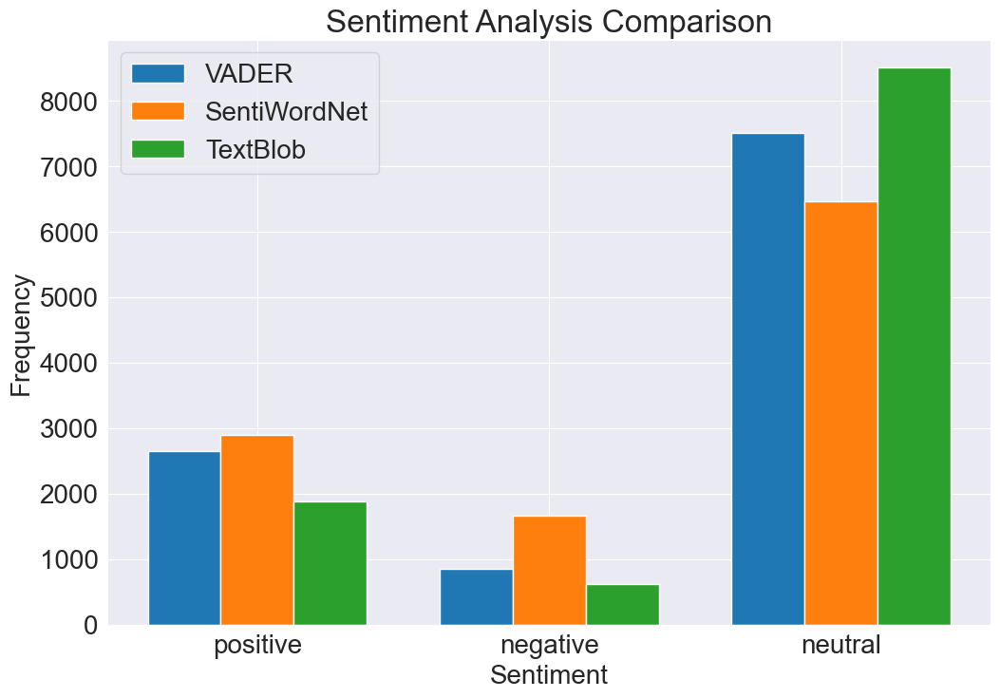

In [62]:
import matplotlib.pyplot as plt

# Function to categorize polarity values into positive, negative, or neutral
def categorize_polarity(polarity):
    if polarity > 0:
        return 'positive'
    elif polarity < 0:
        return 'negative'
    else:
        return 'neutral'

# Initialize lists to store categorized polarity values for each method
vader_polarities = {'positive': 0, 'negative': 0, 'neutral': 0}
sentiwordnet_polarities = {'positive': 0, 'negative': 0, 'neutral': 0}
textblob_polarities = {'positive': 0, 'negative': 0, 'neutral': 0}

# Loop through each message and update polarity counts
for message in df['message']:
    vader_sentiment = analyze_sentiment_vader(message)
    sentiwordnet_sentiment = analyze_sentiment_sentiwordnet(message)
    textblob_sentiment = analyze_sentiment_textblob(message)
    
    vader_polarity = vader_sentiment['compound']
    sentiwordnet_polarity = (sentiwordnet_sentiment['pos'] - sentiwordnet_sentiment['neg'])
    textblob_polarity = textblob_sentiment['polarity']
    
    vader_polarities[categorize_polarity(vader_polarity)] += 1
    sentiwordnet_polarities[categorize_polarity(sentiwordnet_polarity)] += 1
    textblob_polarities[categorize_polarity(textblob_polarity)] += 1

# Plotting
categories = ['positive', 'negative', 'neutral']
vader_counts = [vader_polarities[cat] for cat in categories]
sentiwordnet_counts = [sentiwordnet_polarities[cat] for cat in categories]
textblob_counts = [textblob_polarities[cat] for cat in categories]

bar_width = 0.25
index = range(len(categories))

plt.bar(index, vader_counts, bar_width, label='VADER')
plt.bar([i + bar_width for i in index], sentiwordnet_counts, bar_width, label='SentiWordNet')
plt.bar([i + 2*bar_width for i in index], textblob_counts, bar_width, label='TextBlob')

plt.xlabel('Sentiment')
plt.ylabel('Frequency')
plt.title('Sentiment Analysis Comparison')
plt.xticks([i + bar_width for i in index], categories)
plt.legend()
plt.show()


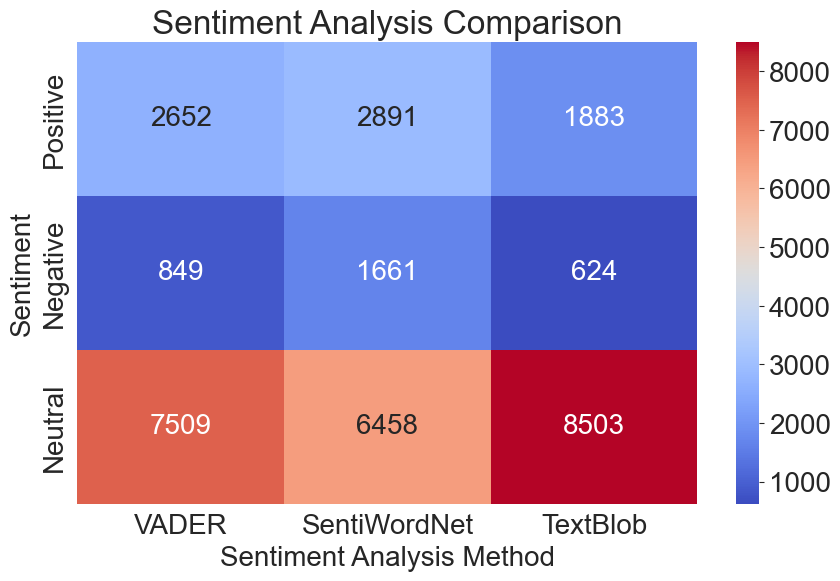

In [63]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Create a DataFrame containing the frequencies of sentiment classifications
data = {
    'Sentiment': ['Positive', 'Negative', 'Neutral'],
    'VADER': vader_counts,
    'SentiWordNet': sentiwordnet_counts,
    'TextBlob': textblob_counts
}
df_heatmap = pd.DataFrame(data)

# Set 'Sentiment' column as the index
df_heatmap.set_index('Sentiment', inplace=True)

# Plotting heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(df_heatmap, annot=True, cmap='coolwarm', fmt='g')
plt.title('Sentiment Analysis Comparison')
plt.xlabel('Sentiment Analysis Method')
plt.ylabel('Sentiment')
plt.show()


VADER Polarity: 0.07002269754768403
SentiWordNet Polarity: 0.030841871026339687
TextBlob Polarity: 0.053023395898065095


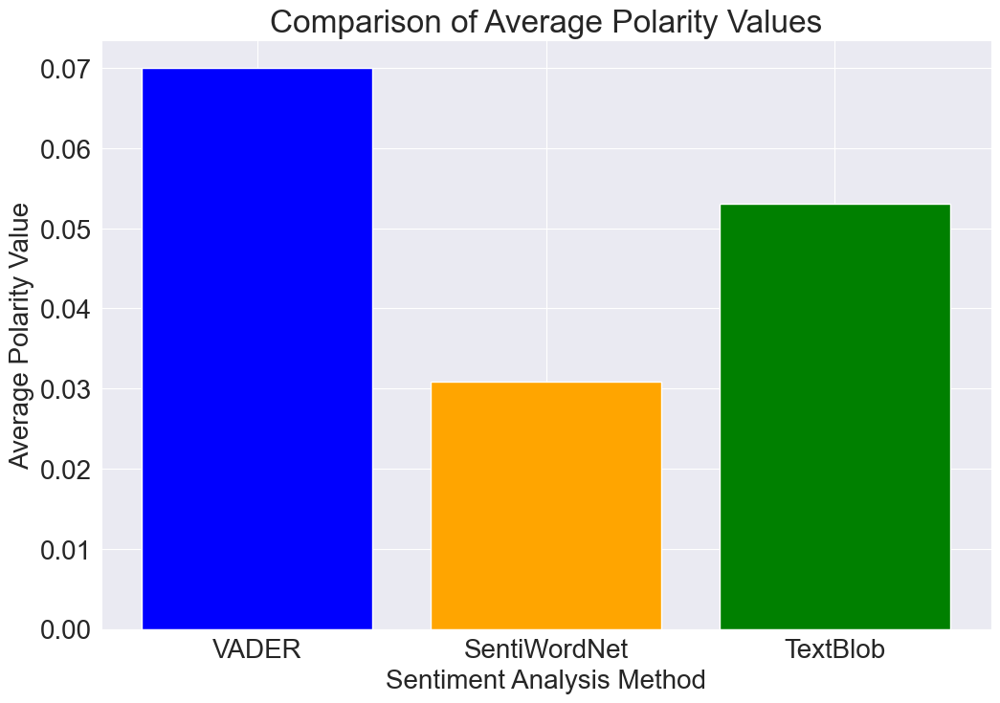

In [64]:
# Calculate polarity values
vader_polarity = average_vader_sentiment.get('compound', 0.0)
sentiwordnet_polarity = (average_sentiwordnet_sentiment.get('pos', 0.0) - average_sentiwordnet_sentiment.get('neg', 0.0)) / 2.0
textblob_polarity = average_textblob_sentiment.get('polarity', 0.0)

# Print the calculated polarity values
print("VADER Polarity:", vader_polarity)
print("SentiWordNet Polarity:", sentiwordnet_polarity)
print("TextBlob Polarity:", textblob_polarity)

# Plotting
import matplotlib.pyplot as plt

methods = ['VADER', 'SentiWordNet', 'TextBlob']
polarity_values = [vader_polarity, sentiwordnet_polarity, textblob_polarity]
plt.bar(methods, polarity_values, color=['blue', 'orange', 'green'])
plt.xlabel('Sentiment Analysis Method')
plt.ylabel('Average Polarity Value')
plt.title('Comparison of Average Polarity Values')
plt.show()


# 18. TRANSLATING FIRST 30 MESSAGES ACCORDING TO OUR CHOICE

In [65]:
pip install googletrans==4.0.0-rc1

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [66]:
from googletrans import LANGUAGES

# Print the list of supported languages and their language codes
for lang_code, lang_name in LANGUAGES.items():
    print(f"{lang_code}: {lang_name}")

af: afrikaans
sq: albanian
am: amharic
ar: arabic
hy: armenian
az: azerbaijani
eu: basque
be: belarusian
bn: bengali
bs: bosnian
bg: bulgarian
ca: catalan
ceb: cebuano
ny: chichewa
zh-cn: chinese (simplified)
zh-tw: chinese (traditional)
co: corsican
hr: croatian
cs: czech
da: danish
nl: dutch
en: english
eo: esperanto
et: estonian
tl: filipino
fi: finnish
fr: french
fy: frisian
gl: galician
ka: georgian
de: german
el: greek
gu: gujarati
ht: haitian creole
ha: hausa
haw: hawaiian
iw: hebrew
he: hebrew
hi: hindi
hmn: hmong
hu: hungarian
is: icelandic
ig: igbo
id: indonesian
ga: irish
it: italian
ja: japanese
jw: javanese
kn: kannada
kk: kazakh
km: khmer
ko: korean
ku: kurdish (kurmanji)
ky: kyrgyz
lo: lao
la: latin
lv: latvian
lt: lithuanian
lb: luxembourgish
mk: macedonian
mg: malagasy
ms: malay
ml: malayalam
mt: maltese
mi: maori
mr: marathi
mn: mongolian
my: myanmar (burmese)
ne: nepali
no: norwegian
or: odia
ps: pashto
fa: persian
pl: polish
pt: portuguese
pa: punjabi
ro: romanian
r

In [67]:
 import pandas as pd
from googletrans import Translator

# Assuming df is your DataFrame containing the chat data
# Assuming 'message' column contains the messages to be translated

# Function to translate messages from one language to another
def translate_messages(messages, source_lang, target_lang):
    translator = Translator()
    translated_messages = []
    for message in messages:
        translation = translator.translate(message, src=source_lang, dest=target_lang)
        translated_messages.append(translation.text)
    return translated_messages

# Set the source and target languages for translation
source_lang = 'en'  # Assuming English is the source language
target_lang = 'ja'  # Assuming japanese is the target language

# Select the first 30 messages
first_50_messages = df['message'].head(56)

# Translate the first 30 messages
translated_messages = translate_messages(first_50_messages, source_lang, target_lang)

# Create a DataFrame to store the original and translated messages
translated_df = pd.DataFrame({'original_message': first_50_messages, 'translated_message': translated_messages})

# Display the DataFrame with translated messages
print(translated_df)


                                     original_message  \
0   Messages and calls are end-to-end encrypted. N...   
1         Samay Raina created group "CODERS👨‍💻👩‍💻🖥💻"    
2          You joined using this group's invite link    
3   +91 99871 38558 joined using this group's invi...   
4   +91 91680 38866 joined using this group's invi...   
5   +91 72762 35231 joined using this group's invi...   
6   +91 88392 06534 joined using this group's invi...   
7   +91 98709 38217 joined using this group's invi...   
8   +91 98702 02065 joined using this group's invi...   
9   +91 91370 44426 joined using this group's invi...   
10  +91 86559 19035 joined using this group's invi...   
11  +91 79778 39093 joined using this group's invi...   
12  +91 98670 44401 joined using this group's invi...   
13  +91 84828 26061 joined using this group's invi...   
14  +91 96191 55044 joined using this group's invi...   
15  +91 99201 75875 joined using this group's invi...   
16  +91 87799 77656 joined usin

In [68]:
source_lang = 'en'  # Assuming English is the source language
target_lang = 'hi'  # Assuming hindi is the target language

# Select the first 30 messages
first_50_messages = df['message'].head(56)

# Translate the first 30 messages
translated_messages = translate_messages(first_50_messages, source_lang, target_lang)

# Create a DataFrame to store the original and translated messages
translated_df = pd.DataFrame({'original_message': first_50_messages, 'translated_message': translated_messages})

# Display the DataFrame with translated messages
print(translated_df)

                                     original_message  \
0   Messages and calls are end-to-end encrypted. N...   
1         Samay Raina created group "CODERS👨‍💻👩‍💻🖥💻"    
2          You joined using this group's invite link    
3   +91 99871 38558 joined using this group's invi...   
4   +91 91680 38866 joined using this group's invi...   
5   +91 72762 35231 joined using this group's invi...   
6   +91 88392 06534 joined using this group's invi...   
7   +91 98709 38217 joined using this group's invi...   
8   +91 98702 02065 joined using this group's invi...   
9   +91 91370 44426 joined using this group's invi...   
10  +91 86559 19035 joined using this group's invi...   
11  +91 79778 39093 joined using this group's invi...   
12  +91 98670 44401 joined using this group's invi...   
13  +91 84828 26061 joined using this group's invi...   
14  +91 96191 55044 joined using this group's invi...   
15  +91 99201 75875 joined using this group's invi...   
16  +91 87799 77656 joined usin

# 19. Networks

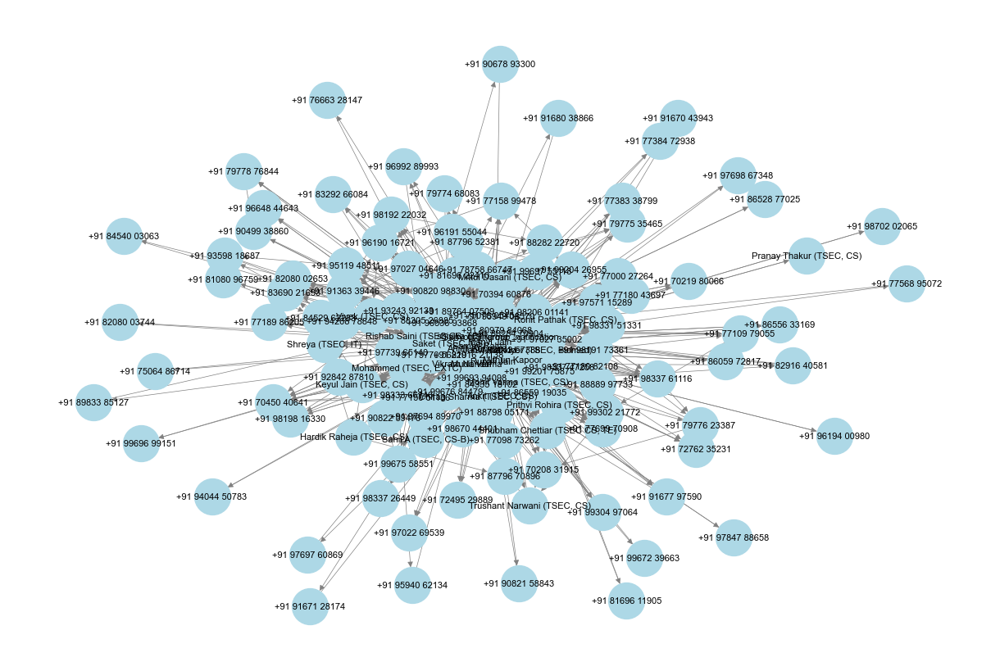

In [69]:
import networkx as nx

# Create an empty directed graph
contact_network = nx.DiGraph()

# Add edges based on interactions between users
for i in range(1, len(df)):
    sender = df.loc[i-1, 'user']
    receiver = df.loc[i, 'user']
    if sender != receiver:  # Exclude self-interactions
        if contact_network.has_edge(sender, receiver):
            # Increment edge weight if the edge already exists
            contact_network[sender][receiver]['weight'] += 1
        else:
            # Add a new edge with weight 1 if it doesn't exist
            contact_network.add_edge(sender, receiver, weight=1)

# Plot the contact network
nx.draw(contact_network, with_labels=True, node_color='lightblue', font_size=8, node_size=1000, edge_color='gray', width=0.5)

# Display the plot
plt.show()

In [70]:
import networkx as nx
import community

# Assuming your directed graph is named 'contact_network'
undirected_contact_network = contact_network.to_undirected()

# Detect communities using the Louvain algorithm
communities = community.best_partition(undirected_contact_network)

# Print the detected communities
print("Detected communities:")
for user, community_id in communities.items():
    print(f"User: {user}, Community: {community_id}")


Detected communities:
User: group_notification, Community: 3
User: +91 96536 93868, Community: 3
User: Janvi Rathod, Community: 1
User: +91 99201 75875, Community: 2
User: +91 95949 08570, Community: 3
User: +91 79778 76844, Community: 3
User: +91 90499 38860, Community: 3
User: Samay Raina, Community: 1
User: Saket (TSEC, CS), Community: 3
User: +91 77568 95072, Community: 3
User: Rohit Pathak (TSEC, CS), Community: 3
User: +91 75078 05454, Community: 4
User: Anjali Kapoor, Community: 1
User: +91 79774 68083, Community: 0
User: +91 70394 60876, Community: 0
User: +91 96191 55044, Community: 0
User: +91 90678 93300, Community: 0
User: Mohit Varma (TSEC, CS), Community: 0
User: +91 79770 56210, Community: 3
User: Chirag Sharma (TSEC, CS), Community: 3
User: Vivek Iyer (TSEC, Biomed), Community: 0
User: Manvi Jain, Community: 3
User: +91 81696 22410, Community: 4
User: +91 89764 07509, Community: 0
User: +91 78758 66747, Community: 3
User: Ankit (TSEC, CS), Community: 0
User: +91 86556 3

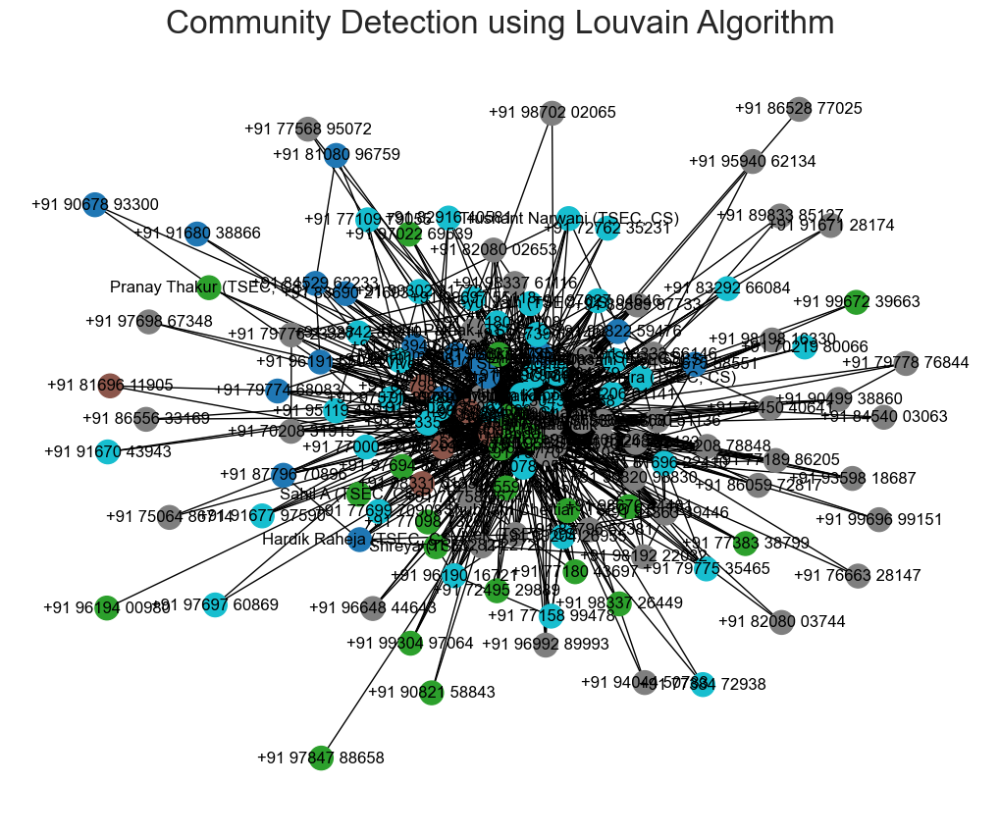

In [71]:
import matplotlib.pyplot as plt

# Create a layout for the nodes
layout = nx.spring_layout(undirected_contact_network)

# Create a list of colors for each node based on its community
colors = [communities[node] for node in undirected_contact_network.nodes()]

# Draw the graph with nodes colored by community
plt.figure(figsize=(10, 8))
nx.draw(undirected_contact_network, pos=layout, node_color=colors, with_labels=True, cmap=plt.cm.tab10)
plt.title('Community Detection using Louvain Algorithm')
plt.show()


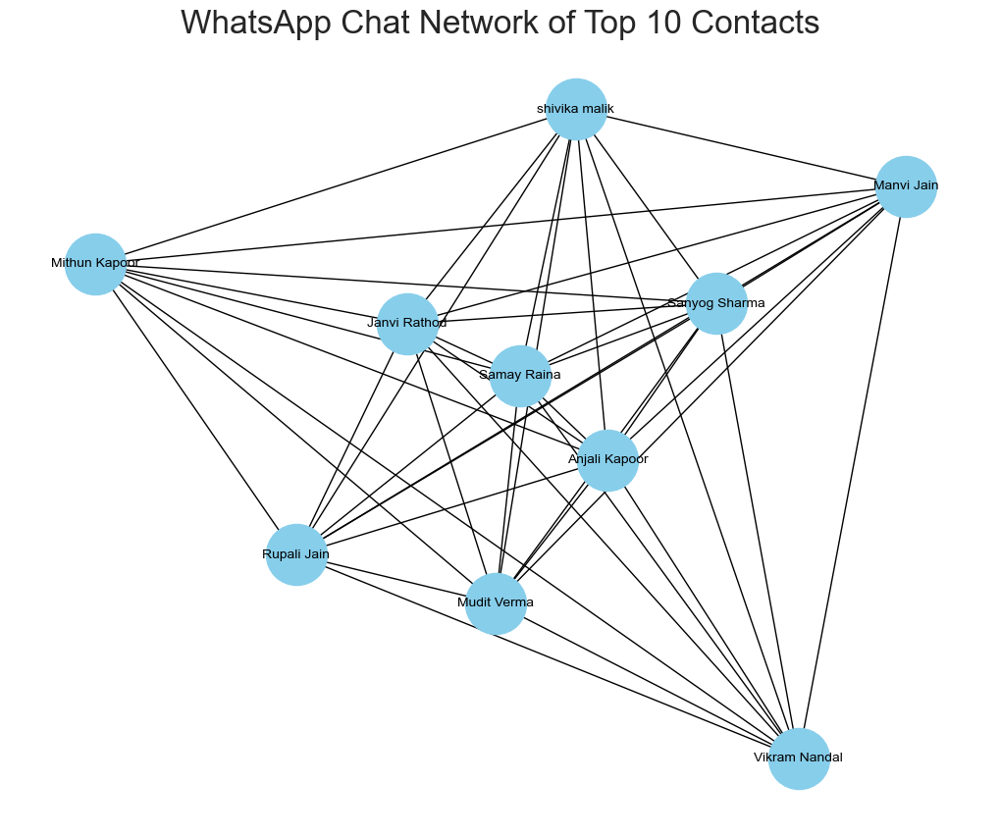

In [72]:
import networkx as nx

# Extract the top 10 contacts from the top10df DataFrame
top_contacts = top10df['user'].tolist()[:10]

# Filter the original contact network to include only the top 10 contacts
top_contact_network = undirected_contact_network.subgraph(top_contacts)

# Create a layout for the nodes
layout = nx.spring_layout(top_contact_network)

# Draw the graph
plt.figure(figsize=(10, 8))
nx.draw(top_contact_network, pos=layout, with_labels=True, node_size=2000, node_color='skyblue', font_size=10, font_color='black')
plt.title('WhatsApp Chat Network of Top 10 Contacts')
plt.show()
